In [1]:
import time
import torch
import torch.nn as nn
import numpy as np
import scipy.ndimage
import scipy.io
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar
from misfit import *
import warnings
from utils import *
device = torch.device('cuda:1')
warnings.filterwarnings("ignore", category=UserWarning)  

In [2]:
# Set parameters
freq = 6
dx = 25.0
dt = 0.004 # 4ms
nz = 117
nx = 567
nt = int(6 / dt) 
peak_time = 1.5 / freq

num_dims = 2
source_depth = 2
receiver_depth = 2
n_sources_per_shot = 1

d_source = 19
first_source = 9

d_receiver = 2
first_receiver = 0

n_shots = len(range(first_source, nx-1, d_source))
n_receivers_per_shot = len(range(first_receiver, nx, d_receiver))



# source_locations
source_locations = torch.zeros(n_shots, n_sources_per_shot, 2,
                               dtype=torch.long)
source_locations[..., 1] = source_depth
source_locations[:, 0, 0] = (torch.arange(n_shots) * d_source +
                             first_source)
# receiver_locations
receiver_locations = torch.zeros(n_shots, n_receivers_per_shot, 2,
                                 dtype=torch.long)
receiver_locations[..., 1] = receiver_depth
receiver_locations[:, :, 0] = (
    (torch.arange(n_receivers_per_shot) * d_receiver +
     first_receiver)
    .repeat(n_shots, 1)
)
# Load ricker wavelet, frequencies below 3 Hz are muted
from scipy.io import loadmat, savemat
r = loadmat('wavelet')
ricker = torch.tensor(r['wavelet'])[0]

source_amplitudes_true = (
    ricker
    .repeat(n_shots, n_sources_per_shot, 1)
    .to(device)
)

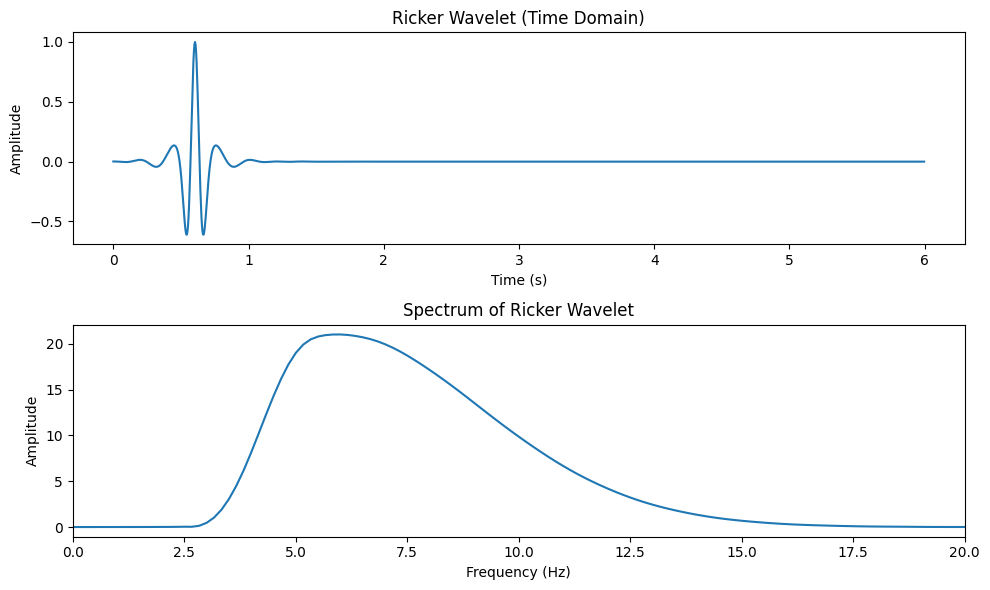

In [3]:
t_max = nt * dt  
t = np.arange(0, t_max, dt)  

wavelet = ricker.numpy()


n = len(wavelet)
f = np.fft.fftfreq(n, dt)  
f = np.fft.fftshift(f)  
wavelet_freq = np.abs(np.fft.fftshift(np.fft.fft(wavelet))) 


plt.figure(figsize=(10, 6))


plt.subplot(2, 1, 1)
plt.plot(t, wavelet)
plt.title('Ricker Wavelet (Time Domain)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


plt.subplot(2, 1, 2)
plt.plot(f, wavelet_freq)
plt.title('Spectrum of Ricker Wavelet')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.xlim([0, 20])  

plt.tight_layout()
plt.show()

In [4]:
# load true model
v = scipy.io.loadmat('True.mat')
model_true = v['True']
model_true = torch.Tensor(model_true) # Convert to a PyTorch Tensor

out = scalar(
    model_true.T.to(device), dx, dt,
    source_amplitudes=source_amplitudes_true.to(device),
    source_locations=source_locations.to(device),
    receiver_locations=receiver_locations.to(device),
    pml_freq=freq,)[-1].permute(0, 2, 1)

receiver_amplitudes_true = out

-1.198324122428894 1.1732336473464953


(array([0., 1., 2., 3., 4., 5., 6.]),
 [Text(0, 0.0, '0'),
  Text(0, 1.0, '1'),
  Text(0, 2.0, '2'),
  Text(0, 3.0, '3'),
  Text(0, 4.0, '4'),
  Text(0, 5.0, '5'),
  Text(0, 6.0, '6')])

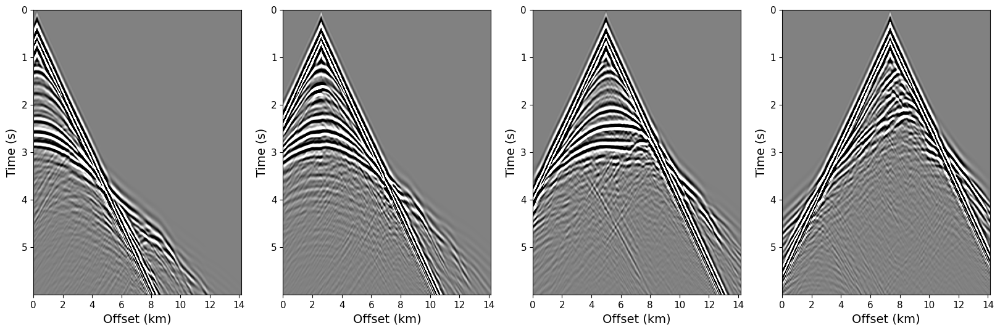

In [5]:
vmin, vmax = np.percentile(receiver_amplitudes_true[1].cpu().numpy(), [4,96])
print(vmin, vmax )
plt.style.use('default')
plt.figure(figsize=(20,6))
plt.subplot(1,4,1)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[0].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,2)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[5].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,3)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[10].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,4)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[15].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
# plt.savefig('data.jpeg', dpi=400)

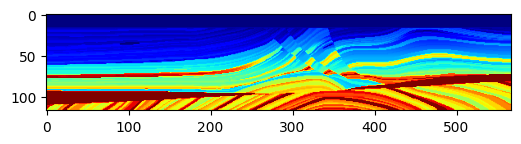

In [6]:
# plt.imshow(model_true.cpu().detach().numpy())
plt.figure(figsize=(6, 4))
plt.imshow(model_true.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
           cmap='jet')
plt.show()

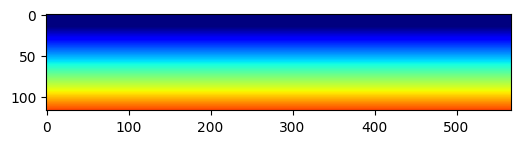

In [7]:
# Create initial model for inversion
model_init = get_linear_vel_model(v['True'],vp_min=1.5e3,vp_max=4.0e3,mask_depth = 15)
model_init = torch.Tensor(model_init)

model = model_init.clone().to(device)
model.requires_grad = True

# Create initial source amplitude for inversion
source_amplitudes = source_amplitudes_true

mask = torch.ones_like(model)
mask[:15, :] = 0


plt.figure(figsize=(6, 4))
plt.imshow(model_init.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
           cmap='jet')
plt.show()

In [8]:
# Set-up inversion
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam([{'params': [model], 'lr': 120, 'weight_decay':0e-11},
                             ]) 
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.75, last_epoch=-1)

criterion_data = Misfit_M_SSIM(gaussian_sigmas=[0.5,1,2],alpha=15,compensation=1)

Epoch: 0 Loss:  -1.362805962562561 model_loss:  235132.62
Epoch: 1 Loss:  -1.2921934127807617 model_loss:  243421.38
Epoch: 2 Loss:  -1.3349733352661133 model_loss:  249213.69
Epoch: 3 Loss:  -1.3792955875396729 model_loss:  253777.55
Epoch: 4 Loss:  -1.4129865765571594 model_loss:  256823.34
Epoch: 5 Loss:  -1.4417030215263367 model_loss:  259585.53
Epoch: 6 Loss:  -1.4662493467330933 model_loss:  262450.8
Epoch: 7 Loss:  -1.4876039028167725 model_loss:  264881.4
Epoch: 8 Loss:  -1.5037317276000977 model_loss:  267152.97
Epoch: 9 Loss:  -1.5173348188400269 model_loss:  269255.78
Epoch: 10 Loss:  -1.52897447347641 model_loss:  271125.72


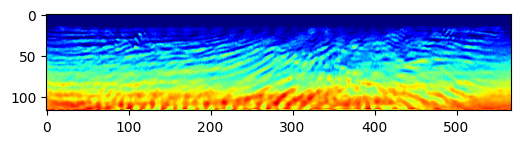

Epoch: 11 Loss:  -1.5396056771278381 model_loss:  273008.94
Epoch: 12 Loss:  -1.5485919713974 model_loss:  274461.38
Epoch: 13 Loss:  -1.5562365055084229 model_loss:  276057.6
Epoch: 14 Loss:  -1.5648666024208069 model_loss:  278004.62
Epoch: 15 Loss:  -1.5693223476409912 model_loss:  279430.1
Epoch: 16 Loss:  -1.572116494178772 model_loss:  280920.12
Epoch: 17 Loss:  -1.5793962478637695 model_loss:  282911.9
Epoch: 18 Loss:  -1.5875936150550842 model_loss:  283940.88
Epoch: 19 Loss:  -1.5966054201126099 model_loss:  285722.28
Epoch: 20 Loss:  -1.5948413014411926 model_loss:  287076.88


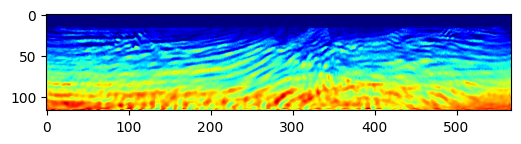

Epoch: 21 Loss:  -1.590899109840393 model_loss:  289098.22
Epoch: 22 Loss:  -1.5860362648963928 model_loss:  289359.28
Epoch: 23 Loss:  -1.583717703819275 model_loss:  293508.25
Epoch: 24 Loss:  -1.5773339867591858 model_loss:  292166.25
Epoch: 25 Loss:  -1.5819799900054932 model_loss:  294322.22
Epoch: 26 Loss:  -1.5800513625144958 model_loss:  294633.47
Epoch: 27 Loss:  -1.5932795405387878 model_loss:  296896.22
Epoch: 28 Loss:  -1.611857831478119 model_loss:  296322.84
Epoch: 29 Loss:  -1.62171471118927 model_loss:  298658.9
Epoch: 30 Loss:  -1.6278627514839172 model_loss:  298248.38


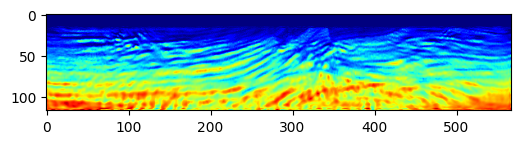

Epoch: 31 Loss:  -1.6333731412887573 model_loss:  299544.3
Epoch: 32 Loss:  -1.6319898962974548 model_loss:  299299.7
Epoch: 33 Loss:  -1.6356303095817566 model_loss:  301271.34
Epoch: 34 Loss:  -1.6320888996124268 model_loss:  300688.44
Epoch: 35 Loss:  -1.62850022315979 model_loss:  303380.7
Epoch: 36 Loss:  -1.6163068413734436 model_loss:  301907.97
Epoch: 37 Loss:  -1.6137601137161255 model_loss:  304359.88
Epoch: 38 Loss:  -1.6136073470115662 model_loss:  303596.12
Epoch: 39 Loss:  -1.6250726580619812 model_loss:  305594.38
Epoch: 40 Loss:  -1.6298760771751404 model_loss:  304946.3


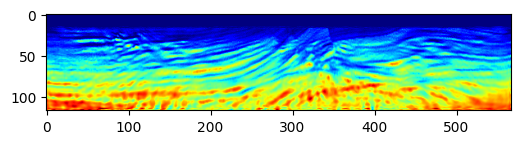

Epoch: 41 Loss:  -1.6409311890602112 model_loss:  306805.9
Epoch: 42 Loss:  -1.6511844396591187 model_loss:  305856.44
Epoch: 43 Loss:  -1.658242106437683 model_loss:  307749.84
Epoch: 44 Loss:  -1.6589825749397278 model_loss:  307608.06
Epoch: 45 Loss:  -1.6596315503120422 model_loss:  308630.5
Epoch: 46 Loss:  -1.6524896025657654 model_loss:  308968.25
Epoch: 47 Loss:  -1.642980694770813 model_loss:  310413.5
Epoch: 48 Loss:  -1.6340592503547668 model_loss:  308923.34
Epoch: 49 Loss:  -1.6430490016937256 model_loss:  311664.0
Epoch: 50 Loss:  -1.6506789922714233 model_loss:  310462.16


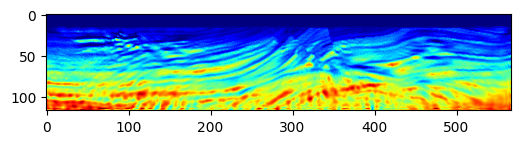

Epoch: 51 Loss:  -1.6612446308135986 model_loss:  311977.97
Epoch: 52 Loss:  -1.6671205759048462 model_loss:  311630.16
Epoch: 53 Loss:  -1.674722671508789 model_loss:  312645.9
Epoch: 54 Loss:  -1.6791744232177734 model_loss:  311775.7
Epoch: 55 Loss:  -1.6860318779945374 model_loss:  313335.34
Epoch: 56 Loss:  -1.6853370666503906 model_loss:  312341.7
Epoch: 57 Loss:  -1.687151849269867 model_loss:  313604.34
Epoch: 58 Loss:  -1.6752750873565674 model_loss:  312677.84
Epoch: 59 Loss:  -1.6623932719230652 model_loss:  314163.3
Epoch: 60 Loss:  -1.6539211869239807 model_loss:  312430.28


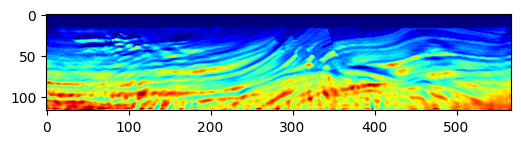

Epoch: 61 Loss:  -1.668038010597229 model_loss:  314292.72
Epoch: 62 Loss:  -1.6757869124412537 model_loss:  313017.97
Epoch: 63 Loss:  -1.686470627784729 model_loss:  314543.78
Epoch: 64 Loss:  -1.6897383332252502 model_loss:  313079.78
Epoch: 65 Loss:  -1.6961933970451355 model_loss:  314638.5
Epoch: 66 Loss:  -1.6984058618545532 model_loss:  313729.4
Epoch: 67 Loss:  -1.7051332592964172 model_loss:  314981.88
Epoch: 68 Loss:  -1.7047929763793945 model_loss:  314589.5
Epoch: 69 Loss:  -1.702961802482605 model_loss:  315426.94
Epoch: 70 Loss:  -1.6893165111541748 model_loss:  314899.84


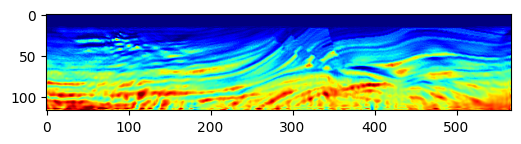

Epoch: 71 Loss:  -1.6743628978729248 model_loss:  316604.44
Epoch: 72 Loss:  -1.6716784238815308 model_loss:  314520.44
Epoch: 73 Loss:  -1.6888347268104553 model_loss:  316067.3
Epoch: 74 Loss:  -1.6963651180267334 model_loss:  315024.7
Epoch: 75 Loss:  -1.7049311399459839 model_loss:  316166.4
Epoch: 76 Loss:  -1.7090340852737427 model_loss:  314914.2
Epoch: 77 Loss:  -1.7151668667793274 model_loss:  316211.3
Epoch: 78 Loss:  -1.7176637649536133 model_loss:  315217.75
Epoch: 79 Loss:  -1.7209530472755432 model_loss:  316103.06
Epoch: 80 Loss:  -1.7114484906196594 model_loss:  315648.06


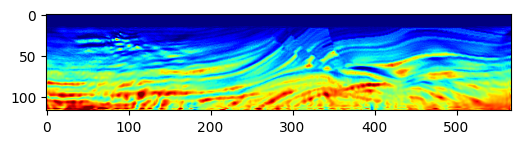

Epoch: 81 Loss:  -1.6946205496788025 model_loss:  316718.38
Epoch: 82 Loss:  -1.6768324971199036 model_loss:  314812.5
Epoch: 83 Loss:  -1.6853269338607788 model_loss:  316216.22
Epoch: 84 Loss:  -1.6967986822128296 model_loss:  314762.03
Epoch: 85 Loss:  -1.7076281905174255 model_loss:  316132.62
Epoch: 86 Loss:  -1.7091821432113647 model_loss:  314959.0
Epoch: 87 Loss:  -1.7137835621833801 model_loss:  316260.4
Epoch: 88 Loss:  -1.7168527841567993 model_loss:  315138.53
Epoch: 89 Loss:  -1.7227461338043213 model_loss:  316296.84
Epoch: 90 Loss:  -1.7242623567581177 model_loss:  315264.03


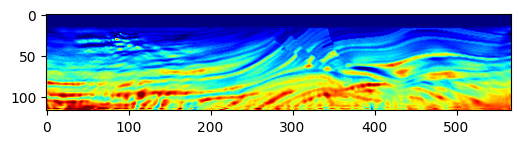

Epoch: 91 Loss:  -1.729256808757782 model_loss:  315995.38
Epoch: 92 Loss:  -1.7264719605445862 model_loss:  315509.25
Epoch: 93 Loss:  -1.7178833484649658 model_loss:  315988.06
Epoch: 94 Loss:  -1.6988046765327454 model_loss:  314716.03
Epoch: 95 Loss:  -1.6914591789245605 model_loss:  316156.84
Epoch: 96 Loss:  -1.701401948928833 model_loss:  314326.56
Epoch: 97 Loss:  -1.7160906791687012 model_loss:  315314.88
Epoch: 98 Loss:  -1.7217111587524414 model_loss:  314279.94
Epoch: 99 Loss:  -1.728644073009491 model_loss:  315081.16
Epoch: 100 Loss:  -1.7325161695480347 model_loss:  314083.53


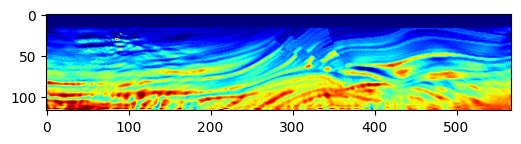

Epoch: 101 Loss:  -1.7351723909378052 model_loss:  315002.97
Epoch: 102 Loss:  -1.7275391221046448 model_loss:  314315.56
Epoch: 103 Loss:  -1.714225172996521 model_loss:  315206.34
Epoch: 104 Loss:  -1.6974819898605347 model_loss:  313767.84
Epoch: 105 Loss:  -1.701644241809845 model_loss:  315104.16
Epoch: 106 Loss:  -1.7140360474586487 model_loss:  313677.5
Epoch: 107 Loss:  -1.726754069328308 model_loss:  314748.56
Epoch: 108 Loss:  -1.7315539717674255 model_loss:  313719.56
Epoch: 109 Loss:  -1.7376129031181335 model_loss:  314716.06
Epoch: 110 Loss:  -1.739040732383728 model_loss:  314123.97


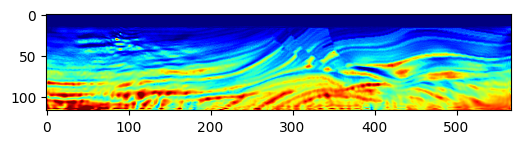

Epoch: 111 Loss:  -1.7369179725646973 model_loss:  314881.44
Epoch: 112 Loss:  -1.7231957912445068 model_loss:  314251.8
Epoch: 113 Loss:  -1.7072820663452148 model_loss:  315392.34
Epoch: 114 Loss:  -1.7024377584457397 model_loss:  313752.16
Epoch: 115 Loss:  -1.7169823050498962 model_loss:  314860.16
Epoch: 116 Loss:  -1.7263092398643494 model_loss:  313571.72
Epoch: 117 Loss:  -1.736171305179596 model_loss:  314519.34
Epoch: 118 Loss:  -1.740258276462555 model_loss:  313640.5
Epoch: 119 Loss:  -1.7420673370361328 model_loss:  314435.56
Epoch: 120 Loss:  -1.7364395260810852 model_loss:  313914.47


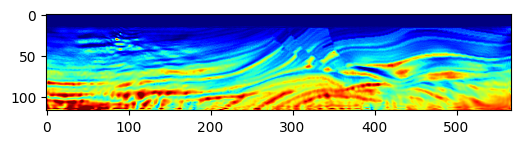

Epoch: 121 Loss:  -1.7261741161346436 model_loss:  314725.56
Epoch: 122 Loss:  -1.7093580961227417 model_loss:  313487.62
Epoch: 123 Loss:  -1.7088176012039185 model_loss:  314771.3
Epoch: 124 Loss:  -1.7210922241210938 model_loss:  313323.34
Epoch: 125 Loss:  -1.7341859340667725 model_loss:  314225.44
Epoch: 126 Loss:  -1.7402567863464355 model_loss:  313183.56
Epoch: 127 Loss:  -1.7461004853248596 model_loss:  313971.34
Epoch: 128 Loss:  -1.7457358837127686 model_loss:  313435.88
Epoch: 129 Loss:  -1.7409066557884216 model_loss:  314183.12
Epoch: 130 Loss:  -1.726133644580841 model_loss:  313429.75


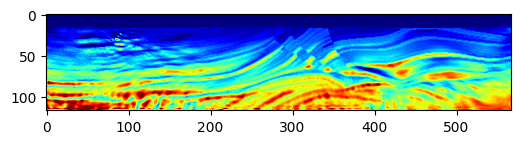

Epoch: 131 Loss:  -1.7144137620925903 model_loss:  314576.5
Epoch: 132 Loss:  -1.7139257192611694 model_loss:  312999.4
Epoch: 133 Loss:  -1.7275252938270569 model_loss:  313934.7
Epoch: 134 Loss:  -1.7355229258537292 model_loss:  312788.06
Epoch: 135 Loss:  -1.7447891235351562 model_loss:  313474.0
Epoch: 136 Loss:  -1.747719943523407 model_loss:  312665.16
Epoch: 137 Loss:  -1.7487380504608154 model_loss:  313445.22
Epoch: 138 Loss:  -1.7393404245376587 model_loss:  312824.25
Epoch: 139 Loss:  -1.727703034877777 model_loss:  313744.7
Epoch: 140 Loss:  -1.7148934602737427 model_loss:  312464.75


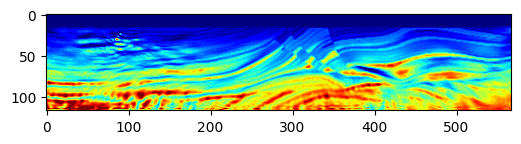

Epoch: 141 Loss:  -1.7208097577095032 model_loss:  313564.66
Epoch: 142 Loss:  -1.7321388721466064 model_loss:  312338.7
Epoch: 143 Loss:  -1.7434051036834717 model_loss:  313259.25
Epoch: 144 Loss:  -1.7482138276100159 model_loss:  312257.22
Epoch: 145 Loss:  -1.7523247003555298 model_loss:  313071.97
Epoch: 146 Loss:  -1.747858464717865 model_loss:  312517.2
Epoch: 147 Loss:  -1.7398176193237305 model_loss:  313194.88
Epoch: 148 Loss:  -1.7235922813415527 model_loss:  312235.5
Epoch: 149 Loss:  -1.7194082736968994 model_loss:  313388.12
Epoch: 150 Loss:  -1.7283145785331726 model_loss:  311908.94


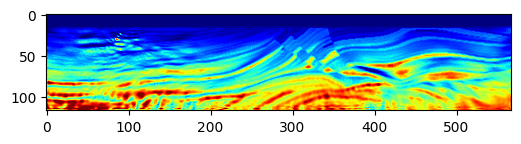

Epoch: 151 Loss:  -1.7420766353607178 model_loss:  312706.6
Epoch: 152 Loss:  -1.748039960861206 model_loss:  311658.22
Epoch: 153 Loss:  -1.7533565163612366 model_loss:  312258.16
Epoch: 154 Loss:  -1.751218557357788 model_loss:  311631.38
Epoch: 155 Loss:  -1.7452310919761658 model_loss:  312342.12
Epoch: 156 Loss:  -1.7304053902626038 model_loss:  311344.1
Epoch: 157 Loss:  -1.7246142029762268 model_loss:  312510.88
Epoch: 158 Loss:  -1.7286254167556763 model_loss:  311127.84
Epoch: 159 Loss:  -1.741182029247284 model_loss:  311942.1
Epoch: 160 Loss:  -1.7475454211235046 model_loss:  310873.9


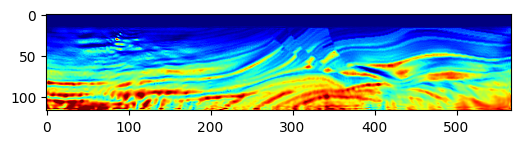

Epoch: 161 Loss:  -1.7535451650619507 model_loss:  311486.88
Epoch: 162 Loss:  -1.7525137066841125 model_loss:  310721.66
Epoch: 163 Loss:  -1.7489086389541626 model_loss:  311545.9
Epoch: 164 Loss:  -1.7361029386520386 model_loss:  310586.72
Epoch: 165 Loss:  -1.7303529381752014 model_loss:  311616.62
Epoch: 166 Loss:  -1.7309102416038513 model_loss:  310319.6
Epoch: 167 Loss:  -1.7414594888687134 model_loss:  311165.06
Epoch: 168 Loss:  -1.747717559337616 model_loss:  310084.78
Epoch: 169 Loss:  -1.7536540627479553 model_loss:  310744.94
Epoch: 170 Loss:  -1.752043902873993 model_loss:  309936.12


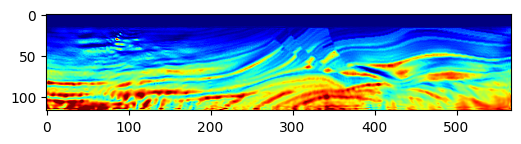

Epoch: 171 Loss:  -1.7490074038505554 model_loss:  310794.66
Epoch: 172 Loss:  -1.7382326126098633 model_loss:  309792.03
Epoch: 173 Loss:  -1.7336447834968567 model_loss:  310838.53
Epoch: 174 Loss:  -1.734921157360077 model_loss:  309526.5
Epoch: 175 Loss:  -1.7448765635490417 model_loss:  310483.62
Epoch: 176 Loss:  -1.7505668997764587 model_loss:  309409.38
Epoch: 177 Loss:  -1.7560742497444153 model_loss:  310141.62
Epoch: 178 Loss:  -1.7530909776687622 model_loss:  309295.5
Epoch: 179 Loss:  -1.7492002248764038 model_loss:  310135.78
Epoch: 180 Loss:  -1.7386599779129028 model_loss:  309133.75


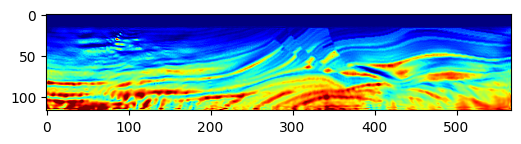

Epoch: 181 Loss:  -1.7368980050086975 model_loss:  310183.84
Epoch: 182 Loss:  -1.7396564483642578 model_loss:  308805.9
Epoch: 183 Loss:  -1.749427080154419 model_loss:  309712.16
Epoch: 184 Loss:  -1.7530876994132996 model_loss:  308657.16
Epoch: 185 Loss:  -1.7564382553100586 model_loss:  309409.1
Epoch: 186 Loss:  -1.751483142375946 model_loss:  308562.16
Epoch: 187 Loss:  -1.746526300907135 model_loss:  309540.7
Epoch: 188 Loss:  -1.7396506667137146 model_loss:  308398.72
Epoch: 189 Loss:  -1.741640329360962 model_loss:  309405.34
Epoch: 190 Loss:  -1.7455257177352905 model_loss:  308146.97


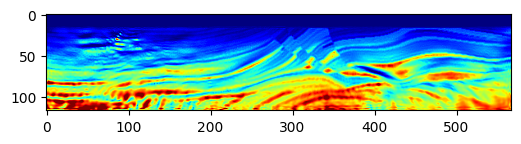

Epoch: 191 Loss:  -1.753418207168579 model_loss:  308908.8
Epoch: 192 Loss:  -1.7550139427185059 model_loss:  307947.3
Epoch: 193 Loss:  -1.7566697597503662 model_loss:  308710.0
Epoch: 194 Loss:  -1.7508886456489563 model_loss:  307812.44
Epoch: 195 Loss:  -1.747808039188385 model_loss:  308797.9
Epoch: 196 Loss:  -1.7425076961517334 model_loss:  307640.0
Epoch: 197 Loss:  -1.7467337250709534 model_loss:  308617.25
Epoch: 198 Loss:  -1.7491249442100525 model_loss:  307439.5
Epoch: 199 Loss:  -1.7561368942260742 model_loss:  308276.78
Epoch: 200 Loss:  -1.755103349685669 model_loss:  307289.06


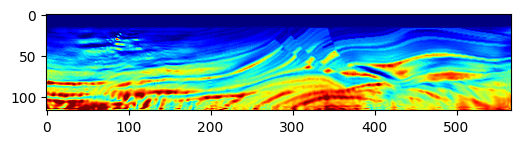

Epoch: 201 Loss:  -1.75560063123703 model_loss:  308157.78
Epoch: 202 Loss:  -1.7494977116584778 model_loss:  307120.8
Epoch: 203 Loss:  -1.7484126687049866 model_loss:  308184.88
Epoch: 204 Loss:  -1.7465084791183472 model_loss:  306971.62
Epoch: 205 Loss:  -1.751638948917389 model_loss:  307939.62
Epoch: 206 Loss:  -1.7536019086837769 model_loss:  306874.25
Epoch: 207 Loss:  -1.7580187320709229 model_loss:  307748.84
Epoch: 208 Loss:  -1.7555742859840393 model_loss:  306853.38
Epoch: 209 Loss:  -1.754859983921051 model_loss:  307765.0
Epoch: 210 Loss:  -1.7490959167480469 model_loss:  306754.75


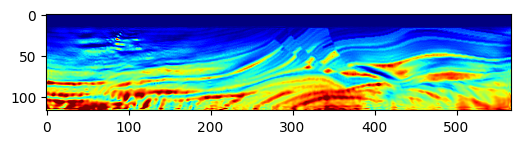

Epoch: 211 Loss:  -1.7501752972602844 model_loss:  307704.2
Epoch: 212 Loss:  -1.7495423555374146 model_loss:  306586.47
Epoch: 213 Loss:  -1.7552896738052368 model_loss:  307468.25
Epoch: 214 Loss:  -1.7557582259178162 model_loss:  306464.5
Epoch: 215 Loss:  -1.758789598941803 model_loss:  307314.78
Epoch: 216 Loss:  -1.7556814551353455 model_loss:  306379.34
Epoch: 217 Loss:  -1.7550750374794006 model_loss:  307248.28
Epoch: 218 Loss:  -1.750957727432251 model_loss:  306156.1
Epoch: 219 Loss:  -1.7526507377624512 model_loss:  307053.44
Epoch: 220 Loss:  -1.753396213054657 model_loss:  305879.4


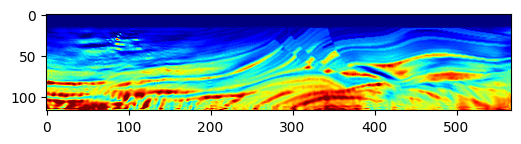

Epoch: 221 Loss:  -1.7579891085624695 model_loss:  306710.7
Epoch: 222 Loss:  -1.7582306265830994 model_loss:  305665.88
Epoch: 223 Loss:  -1.7597759366035461 model_loss:  306505.6
Epoch: 224 Loss:  -1.756803274154663 model_loss:  305485.97
Epoch: 225 Loss:  -1.7565054297447205 model_loss:  306416.47
Epoch: 226 Loss:  -1.754058599472046 model_loss:  305241.66
Epoch: 227 Loss:  -1.7564426064491272 model_loss:  306160.16
Epoch: 228 Loss:  -1.7570512890815735 model_loss:  305030.22
Epoch: 229 Loss:  -1.7605276107788086 model_loss:  305895.06
Epoch: 230 Loss:  -1.759768307209015 model_loss:  304861.72


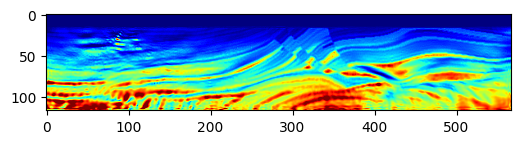

Epoch: 231 Loss:  -1.7607542276382446 model_loss:  305710.4
Epoch: 232 Loss:  -1.7576466798782349 model_loss:  304666.12
Epoch: 233 Loss:  -1.7580996751785278 model_loss:  305525.5
Epoch: 234 Loss:  -1.7568671107292175 model_loss:  304421.2
Epoch: 235 Loss:  -1.7597015500068665 model_loss:  305280.72
Epoch: 236 Loss:  -1.7598755955696106 model_loss:  304205.3
Epoch: 237 Loss:  -1.762327253818512 model_loss:  305035.97
Epoch: 238 Loss:  -1.7602680325508118 model_loss:  303990.56
Epoch: 239 Loss:  -1.7606792449951172 model_loss:  304863.44
Epoch: 240 Loss:  -1.7577429413795471 model_loss:  303764.16


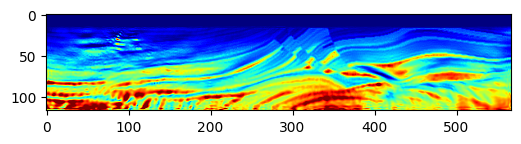

Epoch: 241 Loss:  -1.759187638759613 model_loss:  304661.72
Epoch: 242 Loss:  -1.7580367922782898 model_loss:  303529.38
Epoch: 243 Loss:  -1.760966181755066 model_loss:  304424.34
Epoch: 244 Loss:  -1.7604304552078247 model_loss:  303388.28
Epoch: 245 Loss:  -1.762443721294403 model_loss:  304281.7
Epoch: 246 Loss:  -1.7609216570854187 model_loss:  303280.5
Epoch: 247 Loss:  -1.7619245648384094 model_loss:  304167.34
Epoch: 248 Loss:  -1.759977638721466 model_loss:  303131.4
Epoch: 249 Loss:  -1.761446237564087 model_loss:  304003.53
Epoch: 250 Loss:  -1.760569155216217 model_loss:  302939.12


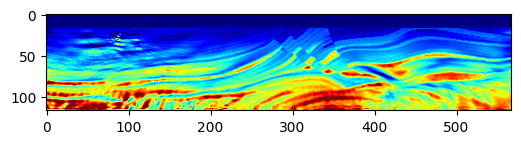

Epoch: 251 Loss:  -1.7630149722099304 model_loss:  303798.7
Epoch: 252 Loss:  -1.7621815204620361 model_loss:  302773.47
Epoch: 253 Loss:  -1.7642818093299866 model_loss:  303627.34
Epoch: 254 Loss:  -1.7621161341667175 model_loss:  302588.2
Epoch: 255 Loss:  -1.7631746530532837 model_loss:  303463.4
Epoch: 256 Loss:  -1.7609719634056091 model_loss:  302396.84
Epoch: 257 Loss:  -1.7627768516540527 model_loss:  303289.22
Epoch: 258 Loss:  -1.7623168230056763 model_loss:  302240.34
Epoch: 259 Loss:  -1.76485276222229 model_loss:  303120.06
Epoch: 260 Loss:  -1.764464020729065 model_loss:  302125.25


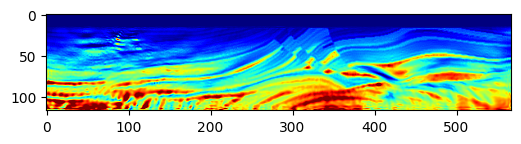

Epoch: 261 Loss:  -1.7654929161071777 model_loss:  302991.34
Epoch: 262 Loss:  -1.7639527916908264 model_loss:  301978.78
Epoch: 263 Loss:  -1.76435786485672 model_loss:  302850.97
Epoch: 264 Loss:  -1.763405680656433 model_loss:  301773.38
Epoch: 265 Loss:  -1.7650411128997803 model_loss:  302640.25
Epoch: 266 Loss:  -1.7652370929718018 model_loss:  301590.03
Epoch: 267 Loss:  -1.7666456699371338 model_loss:  302450.4
Epoch: 268 Loss:  -1.7660832405090332 model_loss:  301459.34
Epoch: 269 Loss:  -1.76625394821167 model_loss:  302338.3
Epoch: 270 Loss:  -1.7649756073951721 model_loss:  301334.8


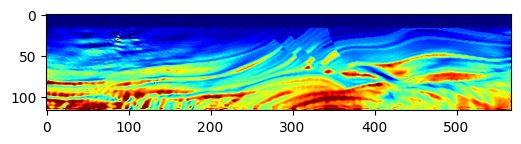

Epoch: 271 Loss:  -1.765692412853241 model_loss:  302232.38
Epoch: 272 Loss:  -1.765236258506775 model_loss:  301206.5
Epoch: 273 Loss:  -1.7670144438743591 model_loss:  302077.44
Epoch: 274 Loss:  -1.7663044333457947 model_loss:  301059.12
Epoch: 275 Loss:  -1.7673231959342957 model_loss:  301919.6
Epoch: 276 Loss:  -1.7658479809761047 model_loss:  300871.8
Epoch: 277 Loss:  -1.7665748000144958 model_loss:  301765.66
Epoch: 278 Loss:  -1.765752911567688 model_loss:  300679.2
Epoch: 279 Loss:  -1.7671064734458923 model_loss:  301565.06
Epoch: 280 Loss:  -1.7668768167495728 model_loss:  300483.3


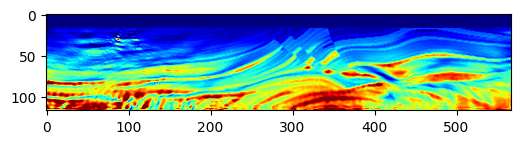

Epoch: 281 Loss:  -1.7680386900901794 model_loss:  301368.3
Epoch: 282 Loss:  -1.767241656780243 model_loss:  300293.44
Epoch: 283 Loss:  -1.768121361732483 model_loss:  301203.53
Epoch: 284 Loss:  -1.767193078994751 model_loss:  300143.66
Epoch: 285 Loss:  -1.7685000896453857 model_loss:  301062.38
Epoch: 286 Loss:  -1.7675434350967407 model_loss:  300019.78
Epoch: 287 Loss:  -1.7689701914787292 model_loss:  300930.84
Epoch: 288 Loss:  -1.7678877115249634 model_loss:  299863.97
Epoch: 289 Loss:  -1.7691452503204346 model_loss:  300780.4
Epoch: 290 Loss:  -1.7678733468055725 model_loss:  299694.0


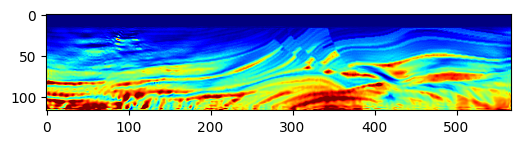

Epoch: 291 Loss:  -1.7690975666046143 model_loss:  300617.9
Epoch: 292 Loss:  -1.768301248550415 model_loss:  299535.06
Epoch: 293 Loss:  -1.7699132561683655 model_loss:  300468.7
Epoch: 294 Loss:  -1.7692041993141174 model_loss:  299379.0
Epoch: 295 Loss:  -1.7706090807914734 model_loss:  300290.6
Epoch: 296 Loss:  -1.7694050073623657 model_loss:  299213.62
Epoch: 297 Loss:  -1.770321011543274 model_loss:  300105.28
Epoch: 298 Loss:  -1.769054889678955 model_loss:  299052.34
Epoch: 299 Loss:  -1.7705588340759277 model_loss:  299960.03
Epoch: 300 Loss:  -1.7698987126350403 model_loss:  298910.12


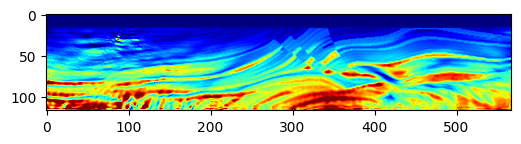

Epoch: 301 Loss:  -1.771979808807373 model_loss:  299807.72
Epoch: 302 Loss:  -1.7707883715629578 model_loss:  298763.94
Epoch: 303 Loss:  -1.7718921899795532 model_loss:  299636.94
Epoch: 304 Loss:  -1.7704870700836182 model_loss:  298549.7
Epoch: 305 Loss:  -1.7713200449943542 model_loss:  299411.16
Epoch: 306 Loss:  -1.770561397075653 model_loss:  298291.38
Epoch: 307 Loss:  -1.7715216279029846 model_loss:  299153.34
Epoch: 308 Loss:  -1.7712721228599548 model_loss:  298073.6
Epoch: 309 Loss:  -1.7723894715309143 model_loss:  298921.06
Epoch: 310 Loss:  -1.7718971967697144 model_loss:  297875.03


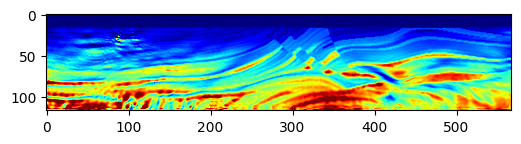

Epoch: 311 Loss:  -1.77268785238266 model_loss:  298712.16
Epoch: 312 Loss:  -1.7717012166976929 model_loss:  297651.12
Epoch: 313 Loss:  -1.7725200653076172 model_loss:  298499.28
Epoch: 314 Loss:  -1.7715491652488708 model_loss:  297428.3
Epoch: 315 Loss:  -1.7729157209396362 model_loss:  298298.44
Epoch: 316 Loss:  -1.7723543643951416 model_loss:  297229.34
Epoch: 317 Loss:  -1.7741020321846008 model_loss:  298081.8
Epoch: 318 Loss:  -1.7731483578681946 model_loss:  297008.78
Epoch: 319 Loss:  -1.7740070819854736 model_loss:  297836.88
Epoch: 320 Loss:  -1.7723126411437988 model_loss:  296747.44


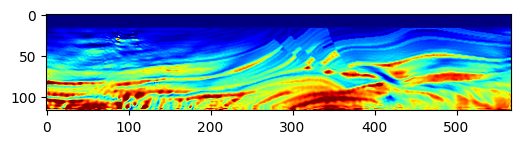

Epoch: 321 Loss:  -1.773255169391632 model_loss:  297558.16
Epoch: 322 Loss:  -1.7724077105522156 model_loss:  296434.38
Epoch: 323 Loss:  -1.774545133113861 model_loss:  297229.4
Epoch: 324 Loss:  -1.7741806507110596 model_loss:  296113.8
Epoch: 325 Loss:  -1.7754445672035217 model_loss:  296897.06
Epoch: 326 Loss:  -1.773973822593689 model_loss:  295829.2
Epoch: 327 Loss:  -1.7747303247451782 model_loss:  296631.56
Epoch: 328 Loss:  -1.7736499905586243 model_loss:  295563.28
Epoch: 329 Loss:  -1.7754393219947815 model_loss:  296361.12
Epoch: 330 Loss:  -1.7748213410377502 model_loss:  295294.12


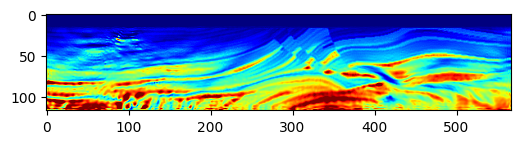

Epoch: 331 Loss:  -1.7761995792388916 model_loss:  296086.9
Epoch: 332 Loss:  -1.7751628756523132 model_loss:  295032.66
Epoch: 333 Loss:  -1.776083528995514 model_loss:  295855.62
Epoch: 334 Loss:  -1.7751632928848267 model_loss:  294789.94
Epoch: 335 Loss:  -1.7764924764633179 model_loss:  295614.53
Epoch: 336 Loss:  -1.7755345106124878 model_loss:  294553.7
Epoch: 337 Loss:  -1.7767024636268616 model_loss:  295361.66
Epoch: 338 Loss:  -1.7755309343338013 model_loss:  294302.16
Epoch: 339 Loss:  -1.7767471671104431 model_loss:  295099.72
Epoch: 340 Loss:  -1.7758967280387878 model_loss:  294054.7


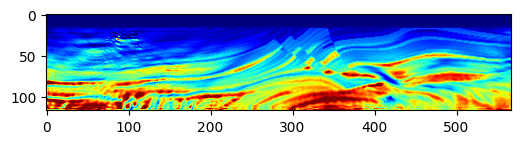

Epoch: 341 Loss:  -1.7773374319076538 model_loss:  294849.5
Epoch: 342 Loss:  -1.7762026190757751 model_loss:  293836.47
Epoch: 343 Loss:  -1.777205228805542 model_loss:  294656.44
Epoch: 344 Loss:  -1.7759776711463928 model_loss:  293620.25
Epoch: 345 Loss:  -1.7771615982055664 model_loss:  294445.78
Epoch: 346 Loss:  -1.7763003706932068 model_loss:  293351.0
Epoch: 347 Loss:  -1.7777735590934753 model_loss:  294151.5
Epoch: 348 Loss:  -1.7768827676773071 model_loss:  293038.38
Epoch: 349 Loss:  -1.7781805396080017 model_loss:  293811.16
Epoch: 350 Loss:  -1.7768744826316833 model_loss:  292688.75


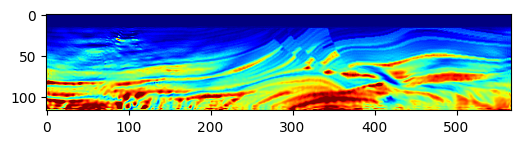

Epoch: 351 Loss:  -1.7781553864479065 model_loss:  293470.2
Epoch: 352 Loss:  -1.7769408822059631 model_loss:  292384.28
Epoch: 353 Loss:  -1.7786468863487244 model_loss:  293190.75
Epoch: 354 Loss:  -1.7774626016616821 model_loss:  292153.25
Epoch: 355 Loss:  -1.7792999148368835 model_loss:  292974.5
Epoch: 356 Loss:  -1.7780336737632751 model_loss:  291943.34
Epoch: 357 Loss:  -1.7797395586967468 model_loss:  292746.9
Epoch: 358 Loss:  -1.7782713770866394 model_loss:  291698.56
Epoch: 359 Loss:  -1.7798823714256287 model_loss:  292482.6
Epoch: 360 Loss:  -1.7782272696495056 model_loss:  291416.5


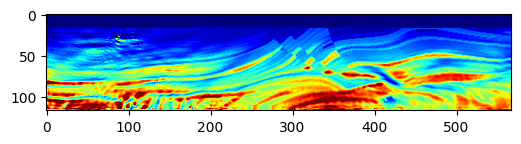

Epoch: 361 Loss:  -1.7802572846412659 model_loss:  292191.34
Epoch: 362 Loss:  -1.7785420417785645 model_loss:  291102.47
Epoch: 363 Loss:  -1.780319631099701 model_loss:  291861.25
Epoch: 364 Loss:  -1.7784752249717712 model_loss:  290780.06
Epoch: 365 Loss:  -1.779891848564148 model_loss:  291569.6
Epoch: 366 Loss:  -1.778563380241394 model_loss:  290513.7
Epoch: 367 Loss:  -1.7804014682769775 model_loss:  291316.8
Epoch: 368 Loss:  -1.7795835733413696 model_loss:  290268.72
Epoch: 369 Loss:  -1.780868947505951 model_loss:  291036.62
Epoch: 370 Loss:  -1.7787320613861084 model_loss:  289955.6


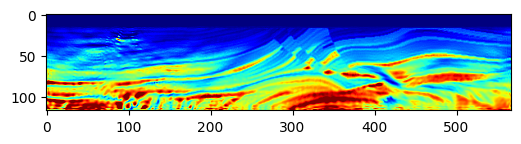

Epoch: 371 Loss:  -1.7795912027359009 model_loss:  290709.44
Epoch: 372 Loss:  -1.7781506776809692 model_loss:  289603.06
Epoch: 373 Loss:  -1.7806780934333801 model_loss:  290336.7
Epoch: 374 Loss:  -1.7801336646080017 model_loss:  289274.56
Epoch: 375 Loss:  -1.7820611596107483 model_loss:  290014.22
Epoch: 376 Loss:  -1.7798965573310852 model_loss:  288983.34
Epoch: 377 Loss:  -1.780466616153717 model_loss:  289759.7
Epoch: 378 Loss:  -1.7791972160339355 model_loss:  288686.3
Epoch: 379 Loss:  -1.78116774559021 model_loss:  289459.34
Epoch: 380 Loss:  -1.7813662886619568 model_loss:  288431.72


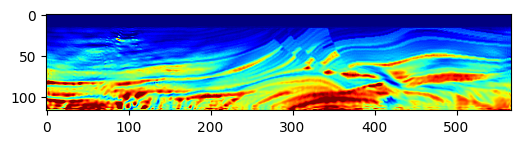

Epoch: 381 Loss:  -1.7828914523124695 model_loss:  289202.03
Epoch: 382 Loss:  -1.78132963180542 model_loss:  288215.25
Epoch: 383 Loss:  -1.7812579870224 model_loss:  289020.06
Epoch: 384 Loss:  -1.7794955372810364 model_loss:  287984.88
Epoch: 385 Loss:  -1.7808873057365417 model_loss:  288779.3
Epoch: 386 Loss:  -1.7808823585510254 model_loss:  287731.28
Epoch: 387 Loss:  -1.7831020951271057 model_loss:  288493.84
Epoch: 388 Loss:  -1.782452404499054 model_loss:  287466.1
Epoch: 389 Loss:  -1.7829874753952026 model_loss:  288249.84
Epoch: 390 Loss:  -1.78142911195755 model_loss:  287252.2


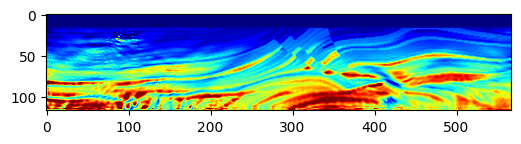

Epoch: 391 Loss:  -1.781937599182129 model_loss:  288059.38
Epoch: 392 Loss:  -1.7813389301300049 model_loss:  287069.6
Epoch: 393 Loss:  -1.7828713655471802 model_loss:  287844.28
Epoch: 394 Loss:  -1.7826619744300842 model_loss:  286850.16
Epoch: 395 Loss:  -1.7839500308036804 model_loss:  287571.44
Epoch: 396 Loss:  -1.782541811466217 model_loss:  286547.4
Epoch: 397 Loss:  -1.783212125301361 model_loss:  287304.12
Epoch: 398 Loss:  -1.782078206539154 model_loss:  286253.44
Epoch: 399 Loss:  -1.7841076254844666 model_loss:  287015.88
Epoch: 400 Loss:  -1.7840231657028198 model_loss:  285999.62


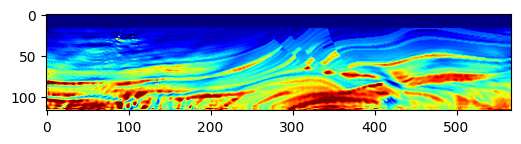

Epoch: 401 Loss:  -1.7857275009155273 model_loss:  286722.47
Epoch: 402 Loss:  -1.7842536568641663 model_loss:  285761.03
Epoch: 403 Loss:  -1.7843722105026245 model_loss:  286498.0
Epoch: 404 Loss:  -1.782475769519806 model_loss:  285540.84
Epoch: 405 Loss:  -1.7838214039802551 model_loss:  286279.97
Epoch: 406 Loss:  -1.783824384212494 model_loss:  285315.16
Epoch: 407 Loss:  -1.7860198020935059 model_loss:  286033.2
Epoch: 408 Loss:  -1.7850710153579712 model_loss:  285073.97
Epoch: 409 Loss:  -1.785579264163971 model_loss:  285840.97
Epoch: 410 Loss:  -1.7837114930152893 model_loss:  284870.66


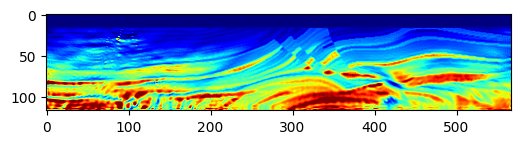

Epoch: 411 Loss:  -1.784868597984314 model_loss:  285684.4
Epoch: 412 Loss:  -1.7844763398170471 model_loss:  284706.1
Epoch: 413 Loss:  -1.7861374020576477 model_loss:  285458.2
Epoch: 414 Loss:  -1.7852401733398438 model_loss:  284483.1
Epoch: 415 Loss:  -1.7849464416503906 model_loss:  285196.28
Epoch: 416 Loss:  -1.7838079333305359 model_loss:  284211.47
Epoch: 417 Loss:  -1.7841760516166687 model_loss:  284957.34
Epoch: 418 Loss:  -1.784419596195221 model_loss:  284018.16
Epoch: 419 Loss:  -1.7856650352478027 model_loss:  284775.28
Epoch: 420 Loss:  -1.7851859331130981 model_loss:  283853.03


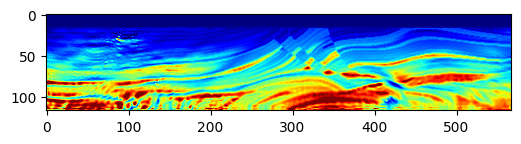

Epoch: 421 Loss:  -1.7851102948188782 model_loss:  284640.34
Epoch: 422 Loss:  -1.784209132194519 model_loss:  283731.66
Epoch: 423 Loss:  -1.7844265699386597 model_loss:  284554.9
Epoch: 424 Loss:  -1.7849459648132324 model_loss:  283641.97
Epoch: 425 Loss:  -1.7860974669456482 model_loss:  284416.72
Epoch: 426 Loss:  -1.7860034108161926 model_loss:  283456.84
Epoch: 427 Loss:  -1.7859110236167908 model_loss:  284184.0
Epoch: 428 Loss:  -1.7849025130271912 model_loss:  283187.1
Epoch: 429 Loss:  -1.7849735617637634 model_loss:  283924.4
Epoch: 430 Loss:  -1.7856909036636353 model_loss:  282932.47


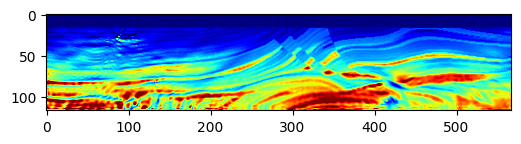

Epoch: 431 Loss:  -1.7875049710273743 model_loss:  283670.28
Epoch: 432 Loss:  -1.7876137495040894 model_loss:  282743.5
Epoch: 433 Loss:  -1.787920892238617 model_loss:  283503.03
Epoch: 434 Loss:  -1.786549150943756 model_loss:  282612.1
Epoch: 435 Loss:  -1.7862508893013 model_loss:  283397.34
Epoch: 436 Loss:  -1.78597754240036 model_loss:  282501.25
Epoch: 437 Loss:  -1.7876981496810913 model_loss:  283241.3
Epoch: 438 Loss:  -1.7879311442375183 model_loss:  282343.06
Epoch: 439 Loss:  -1.7889829874038696 model_loss:  283021.12
Epoch: 440 Loss:  -1.787619173526764 model_loss:  282102.34


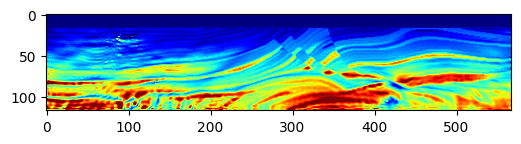

Epoch: 441 Loss:  -1.7877253293991089 model_loss:  282782.44
Epoch: 442 Loss:  -1.786694347858429 model_loss:  281847.72
Epoch: 443 Loss:  -1.7878961563110352 model_loss:  282549.72
Epoch: 444 Loss:  -1.7881267666816711 model_loss:  281652.72
Epoch: 445 Loss:  -1.789588987827301 model_loss:  282359.22
Epoch: 446 Loss:  -1.789118468761444 model_loss:  281482.44
Epoch: 447 Loss:  -1.7889682054519653 model_loss:  282199.12
Epoch: 448 Loss:  -1.7878536581993103 model_loss:  281316.66
Epoch: 449 Loss:  -1.7883930206298828 model_loss:  282006.84
Epoch: 450 Loss:  -1.7889076471328735 model_loss:  281121.28


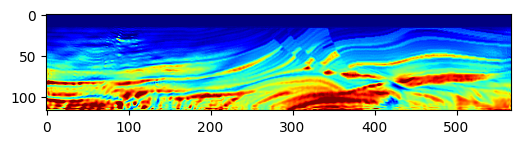

Epoch: 451 Loss:  -1.7902798652648926 model_loss:  281784.66
Epoch: 452 Loss:  -1.7902836799621582 model_loss:  280927.16
Epoch: 453 Loss:  -1.790164053440094 model_loss:  281612.28
Epoch: 454 Loss:  -1.7893530130386353 model_loss:  280739.6
Epoch: 455 Loss:  -1.7893537878990173 model_loss:  281416.03
Epoch: 456 Loss:  -1.7897912859916687 model_loss:  280512.84
Epoch: 457 Loss:  -1.790268063545227 model_loss:  281164.06
Epoch: 458 Loss:  -1.7908744812011719 model_loss:  280259.1
Epoch: 459 Loss:  -1.7904991507530212 model_loss:  280956.38
Epoch: 460 Loss:  -1.790864109992981 model_loss:  280078.62


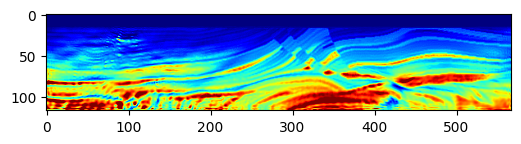

Epoch: 461 Loss:  -1.790249764919281 model_loss:  280832.53
Epoch: 462 Loss:  -1.7908307313919067 model_loss:  279954.66
Epoch: 463 Loss:  -1.7906420826911926 model_loss:  280704.34
Epoch: 464 Loss:  -1.7915679216384888 model_loss:  279827.5
Epoch: 465 Loss:  -1.7908251881599426 model_loss:  280557.84
Epoch: 466 Loss:  -1.7910311222076416 model_loss:  279692.12
Epoch: 467 Loss:  -1.790250539779663 model_loss:  280418.6
Epoch: 468 Loss:  -1.7915464043617249 model_loss:  279534.6
Epoch: 469 Loss:  -1.7918434739112854 model_loss:  280206.56
Epoch: 470 Loss:  -1.792846441268921 model_loss:  279341.94


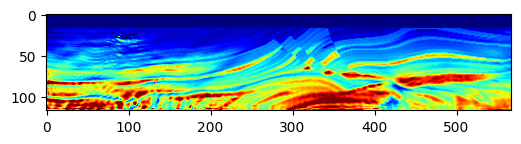

Epoch: 471 Loss:  -1.7923187017440796 model_loss:  280035.62
Epoch: 472 Loss:  -1.792391300201416 model_loss:  279191.84
Epoch: 473 Loss:  -1.7918249368667603 model_loss:  279933.25
Epoch: 474 Loss:  -1.7925697565078735 model_loss:  279086.3
Epoch: 475 Loss:  -1.7929180264472961 model_loss:  279834.0
Epoch: 476 Loss:  -1.7938854098320007 model_loss:  278980.4
Epoch: 477 Loss:  -1.7936121821403503 model_loss:  279704.56
Epoch: 478 Loss:  -1.7938810586929321 model_loss:  278854.16
Epoch: 479 Loss:  -1.7933555245399475 model_loss:  279560.4
Epoch: 480 Loss:  -1.7940390706062317 model_loss:  278711.6


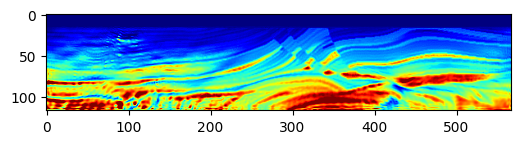

Epoch: 481 Loss:  -1.7939261198043823 model_loss:  279420.7
Epoch: 482 Loss:  -1.7949100732803345 model_loss:  278604.56
Epoch: 483 Loss:  -1.7944677472114563 model_loss:  279334.75
Epoch: 484 Loss:  -1.7948130369186401 model_loss:  278510.56
Epoch: 485 Loss:  -1.7940512299537659 model_loss:  279227.0
Epoch: 486 Loss:  -1.7945636510849 model_loss:  278375.97
Epoch: 487 Loss:  -1.794588565826416 model_loss:  279046.53
Epoch: 488 Loss:  -1.7957921028137207 model_loss:  278197.78
Epoch: 489 Loss:  -1.795468807220459 model_loss:  278804.72
Epoch: 490 Loss:  -1.79624605178833 model_loss:  277969.16


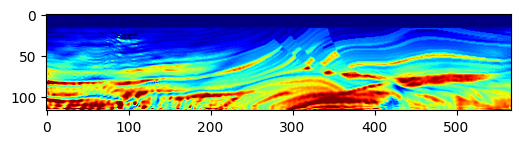

Epoch: 491 Loss:  -1.7950827479362488 model_loss:  278580.53
Epoch: 492 Loss:  -1.795830488204956 model_loss:  277734.9
Epoch: 493 Loss:  -1.7948682308197021 model_loss:  278429.03
Epoch: 494 Loss:  -1.7961899638175964 model_loss:  277598.22
Epoch: 495 Loss:  -1.795828402042389 model_loss:  278293.56
Epoch: 496 Loss:  -1.7968742847442627 model_loss:  277472.94
Epoch: 497 Loss:  -1.7962414026260376 model_loss:  278158.16
Epoch: 498 Loss:  -1.7966797947883606 model_loss:  277336.88
Epoch: 499 Loss:  -1.7960857152938843 model_loss:  278033.0
Epoch: 500 Loss:  -1.7967649698257446 model_loss:  277196.38


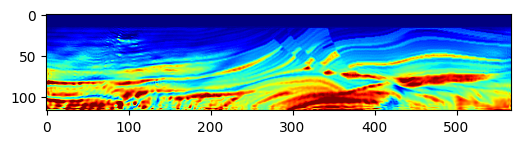

Epoch: 501 Loss:  -1.796579897403717 model_loss:  277876.16
Epoch: 502 Loss:  -1.797397255897522 model_loss:  277059.56
Epoch: 503 Loss:  -1.7971744537353516 model_loss:  277706.94
Epoch: 504 Loss:  -1.797575831413269 model_loss:  276893.56
Epoch: 505 Loss:  -1.7971044778823853 model_loss:  277551.1
Epoch: 506 Loss:  -1.7973657846450806 model_loss:  276719.34
Epoch: 507 Loss:  -1.7973695993423462 model_loss:  277423.78
Epoch: 508 Loss:  -1.7979931235313416 model_loss:  276569.12
Epoch: 509 Loss:  -1.7978817820549011 model_loss:  277299.97
Epoch: 510 Loss:  -1.7982817888259888 model_loss:  276432.8


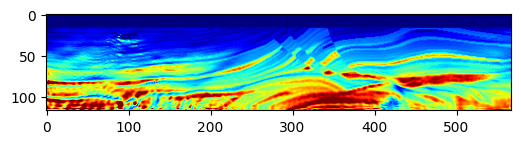

Epoch: 511 Loss:  -1.7979431748390198 model_loss:  277189.34
Epoch: 512 Loss:  -1.7987909317016602 model_loss:  276322.38
Epoch: 513 Loss:  -1.7985355257987976 model_loss:  277066.4
Epoch: 514 Loss:  -1.7992894053459167 model_loss:  276217.97
Epoch: 515 Loss:  -1.798509418964386 model_loss:  276930.4
Epoch: 516 Loss:  -1.7990885376930237 model_loss:  276076.16
Epoch: 517 Loss:  -1.7986512184143066 model_loss:  276784.78
Epoch: 518 Loss:  -1.7997101545333862 model_loss:  275932.06
Epoch: 519 Loss:  -1.7993524670600891 model_loss:  276641.3
Epoch: 520 Loss:  -1.8000885248184204 model_loss:  275793.25


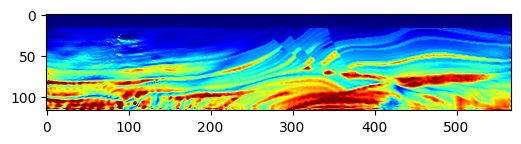

Epoch: 521 Loss:  -1.799534261226654 model_loss:  276475.16
Epoch: 522 Loss:  -1.8002392649650574 model_loss:  275612.34
Epoch: 523 Loss:  -1.7996641993522644 model_loss:  276285.12
Epoch: 524 Loss:  -1.8003719449043274 model_loss:  275430.28
Epoch: 525 Loss:  -1.7999540567398071 model_loss:  276119.2
Epoch: 526 Loss:  -1.800700604915619 model_loss:  275276.6
Epoch: 527 Loss:  -1.8004441857337952 model_loss:  275979.12
Epoch: 528 Loss:  -1.8008570671081543 model_loss:  275118.38
Epoch: 529 Loss:  -1.800410807132721 model_loss:  275820.0
Epoch: 530 Loss:  -1.8009341359138489 model_loss:  274923.66


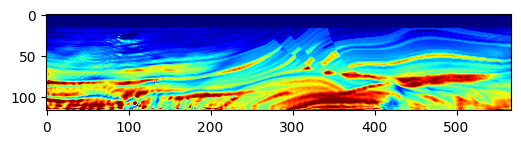

Epoch: 531 Loss:  -1.8005937337875366 model_loss:  275600.7
Epoch: 532 Loss:  -1.801436185836792 model_loss:  274687.5
Epoch: 533 Loss:  -1.8009390830993652 model_loss:  275344.9
Epoch: 534 Loss:  -1.8019899129867554 model_loss:  274463.2
Epoch: 535 Loss:  -1.8014534711837769 model_loss:  275127.9
Epoch: 536 Loss:  -1.8024287223815918 model_loss:  274290.28
Epoch: 537 Loss:  -1.8015421628952026 model_loss:  274965.1
Epoch: 538 Loss:  -1.8022983074188232 model_loss:  274147.12
Epoch: 539 Loss:  -1.8016315698623657 model_loss:  274836.06
Epoch: 540 Loss:  -1.8027594685554504 model_loss:  274016.62


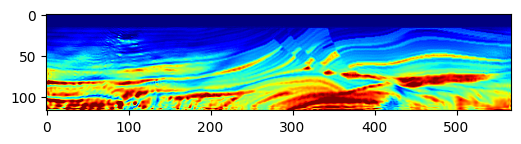

Epoch: 541 Loss:  -1.8021568059921265 model_loss:  274717.2
Epoch: 542 Loss:  -1.802941918373108 model_loss:  273891.28
Epoch: 543 Loss:  -1.8019893169403076 model_loss:  274601.22
Epoch: 544 Loss:  -1.8024859428405762 model_loss:  273763.4
Epoch: 545 Loss:  -1.8017112612724304 model_loss:  274473.56
Epoch: 546 Loss:  -1.802224040031433 model_loss:  273622.34
Epoch: 547 Loss:  -1.8017079830169678 model_loss:  274338.78
Epoch: 548 Loss:  -1.8024937510490417 model_loss:  273484.2
Epoch: 549 Loss:  -1.80196875333786 model_loss:  274166.84
Epoch: 550 Loss:  -1.8029587864875793 model_loss:  273328.66


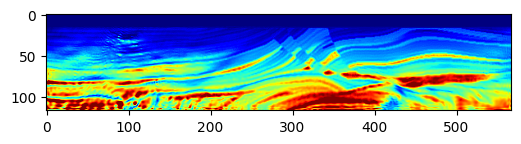

Epoch: 551 Loss:  -1.8022220730781555 model_loss:  273978.06
Epoch: 552 Loss:  -1.8030535578727722 model_loss:  273137.44
Epoch: 553 Loss:  -1.8021801114082336 model_loss:  273801.44
Epoch: 554 Loss:  -1.8032649159431458 model_loss:  272946.16
Epoch: 555 Loss:  -1.802953064441681 model_loss:  273629.88
Epoch: 556 Loss:  -1.8042609095573425 model_loss:  272785.0
Epoch: 557 Loss:  -1.8037363290786743 model_loss:  273470.34
Epoch: 558 Loss:  -1.8043261170387268 model_loss:  272622.78
Epoch: 559 Loss:  -1.8036143779754639 model_loss:  273351.3
Epoch: 560 Loss:  -1.8041316270828247 model_loss:  272480.16


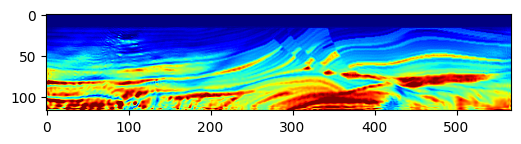

Epoch: 561 Loss:  -1.8038566708564758 model_loss:  273217.0
Epoch: 562 Loss:  -1.8046100735664368 model_loss:  272319.75
Epoch: 563 Loss:  -1.8044886589050293 model_loss:  273013.7
Epoch: 564 Loss:  -1.804791510105133 model_loss:  272107.0
Epoch: 565 Loss:  -1.8042071461677551 model_loss:  272799.66
Epoch: 566 Loss:  -1.804303765296936 model_loss:  271915.2
Epoch: 567 Loss:  -1.8042396903038025 model_loss:  272618.03
Epoch: 568 Loss:  -1.8048828840255737 model_loss:  271749.2
Epoch: 569 Loss:  -1.8048726916313171 model_loss:  272443.5
Epoch: 570 Loss:  -1.8052796721458435 model_loss:  271588.84


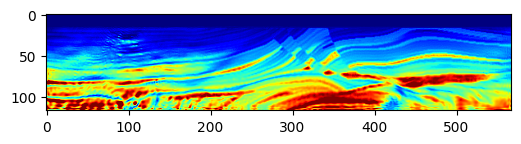

Epoch: 571 Loss:  -1.805005967617035 model_loss:  272293.5
Epoch: 572 Loss:  -1.8055309653282166 model_loss:  271437.97
Epoch: 573 Loss:  -1.805456817150116 model_loss:  272135.28
Epoch: 574 Loss:  -1.8060092329978943 model_loss:  271264.25
Epoch: 575 Loss:  -1.8056249022483826 model_loss:  271938.34
Epoch: 576 Loss:  -1.8060852885246277 model_loss:  271049.8
Epoch: 577 Loss:  -1.8056558966636658 model_loss:  271712.47
Epoch: 578 Loss:  -1.8063427805900574 model_loss:  270813.16
Epoch: 579 Loss:  -1.8061724305152893 model_loss:  271478.1
Epoch: 580 Loss:  -1.8068121671676636 model_loss:  270574.44


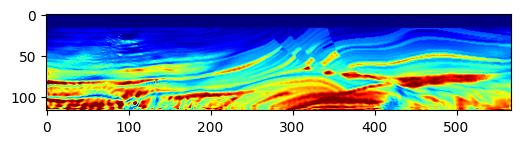

Epoch: 581 Loss:  -1.8066439032554626 model_loss:  271248.06
Epoch: 582 Loss:  -1.8070611953735352 model_loss:  270355.94
Epoch: 583 Loss:  -1.8068265318870544 model_loss:  271056.9
Epoch: 584 Loss:  -1.8072340488433838 model_loss:  270196.7
Epoch: 585 Loss:  -1.8069818615913391 model_loss:  270923.22
Epoch: 586 Loss:  -1.8072633743286133 model_loss:  270105.2
Epoch: 587 Loss:  -1.8068716526031494 model_loss:  270830.3
Epoch: 588 Loss:  -1.8069531321525574 model_loss:  270034.6
Epoch: 589 Loss:  -1.8064011931419373 model_loss:  270749.5
Epoch: 590 Loss:  -1.8067277669906616 model_loss:  269967.03


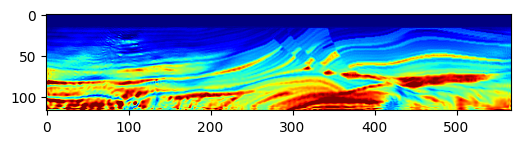

Epoch: 591 Loss:  -1.8065677285194397 model_loss:  270675.12
Epoch: 592 Loss:  -1.8071984648704529 model_loss:  269883.44
Epoch: 593 Loss:  -1.8067440390586853 model_loss:  270587.9
Epoch: 594 Loss:  -1.8069804310798645 model_loss:  269753.88
Epoch: 595 Loss:  -1.8062666058540344 model_loss:  270463.97
Epoch: 596 Loss:  -1.8065903782844543 model_loss:  269615.22
Epoch: 597 Loss:  -1.806682288646698 model_loss:  270323.47
Epoch: 598 Loss:  -1.8072871565818787 model_loss:  269495.6
Epoch: 599 Loss:  -1.8078824877738953 model_loss:  270177.47
Epoch: 600 Loss:  -1.8079272508621216 model_loss:  269353.16


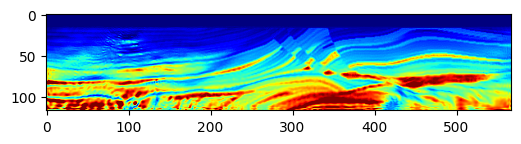

Epoch: 601 Loss:  -1.8079460859298706 model_loss:  270045.03
Epoch: 602 Loss:  -1.8078783750534058 model_loss:  269220.34
Epoch: 603 Loss:  -1.8083086609840393 model_loss:  269914.3
Epoch: 604 Loss:  -1.8086167573928833 model_loss:  269088.1
Epoch: 605 Loss:  -1.8088990449905396 model_loss:  269748.88
Epoch: 606 Loss:  -1.8087302446365356 model_loss:  268916.75
Epoch: 607 Loss:  -1.8085347414016724 model_loss:  269572.2
Epoch: 608 Loss:  -1.8084251880645752 model_loss:  268749.8
Epoch: 609 Loss:  -1.8085508942604065 model_loss:  269424.25
Epoch: 610 Loss:  -1.8088126182556152 model_loss:  268626.56


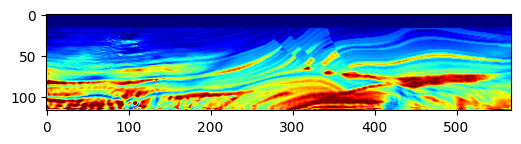

Epoch: 611 Loss:  -1.8090088367462158 model_loss:  269305.47
Epoch: 612 Loss:  -1.8089737296104431 model_loss:  268524.78
Epoch: 613 Loss:  -1.8087891340255737 model_loss:  269194.0
Epoch: 614 Loss:  -1.8088502287864685 model_loss:  268403.38
Epoch: 615 Loss:  -1.8090409636497498 model_loss:  269074.1
Epoch: 616 Loss:  -1.8094816207885742 model_loss:  268257.66
Epoch: 617 Loss:  -1.8096212148666382 model_loss:  268920.4
Epoch: 618 Loss:  -1.809761643409729 model_loss:  268079.3
Epoch: 619 Loss:  -1.809654414653778 model_loss:  268722.78
Epoch: 620 Loss:  -1.809644877910614 model_loss:  267870.78


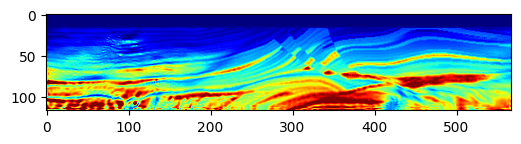

Epoch: 621 Loss:  -1.8096826076507568 model_loss:  268500.97
Epoch: 622 Loss:  -1.8097918033599854 model_loss:  267667.7
Epoch: 623 Loss:  -1.8101140260696411 model_loss:  268288.0
Epoch: 624 Loss:  -1.8103424310684204 model_loss:  267484.97
Epoch: 625 Loss:  -1.8103611469268799 model_loss:  268127.56
Epoch: 626 Loss:  -1.8102357387542725 model_loss:  267336.3
Epoch: 627 Loss:  -1.8101986050605774 model_loss:  268019.38
Epoch: 628 Loss:  -1.8104020357131958 model_loss:  267227.7
Epoch: 629 Loss:  -1.8107358813285828 model_loss:  267921.84
Epoch: 630 Loss:  -1.810667634010315 model_loss:  267142.47


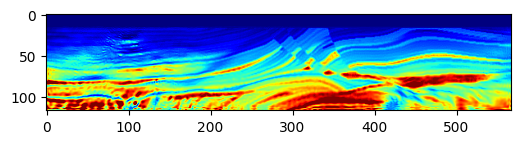

Epoch: 631 Loss:  -1.8107970356941223 model_loss:  267819.7
Epoch: 632 Loss:  -1.81052565574646 model_loss:  267032.22
Epoch: 633 Loss:  -1.8110053539276123 model_loss:  267687.9
Epoch: 634 Loss:  -1.810711145401001 model_loss:  266885.72
Epoch: 635 Loss:  -1.8111369013786316 model_loss:  267551.78
Epoch: 636 Loss:  -1.8108524680137634 model_loss:  266762.56
Epoch: 637 Loss:  -1.811220645904541 model_loss:  267424.2
Epoch: 638 Loss:  -1.8109624981880188 model_loss:  266657.0
Epoch: 639 Loss:  -1.8109402656555176 model_loss:  267301.8
Epoch: 640 Loss:  -1.810647428035736 model_loss:  266523.03


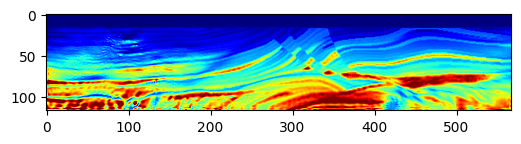

Epoch: 641 Loss:  -1.8109687566757202 model_loss:  267137.8
Epoch: 642 Loss:  -1.8110700845718384 model_loss:  266337.3
Epoch: 643 Loss:  -1.8115856647491455 model_loss:  266955.4
Epoch: 644 Loss:  -1.811506748199463 model_loss:  266165.16
Epoch: 645 Loss:  -1.8119671940803528 model_loss:  266803.22
Epoch: 646 Loss:  -1.811870813369751 model_loss:  266033.03
Epoch: 647 Loss:  -1.8123055696487427 model_loss:  266680.97
Epoch: 648 Loss:  -1.8116360306739807 model_loss:  265914.1
Epoch: 649 Loss:  -1.8119758367538452 model_loss:  266558.34
Epoch: 650 Loss:  -1.8112995028495789 model_loss:  265786.2


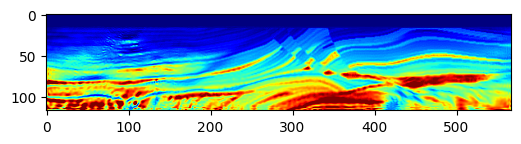

Epoch: 651 Loss:  -1.8122352957725525 model_loss:  266395.88
Epoch: 652 Loss:  -1.8115922212600708 model_loss:  265627.2
Epoch: 653 Loss:  -1.812347173690796 model_loss:  266192.06
Epoch: 654 Loss:  -1.8114784359931946 model_loss:  265397.44
Epoch: 655 Loss:  -1.811993658542633 model_loss:  265967.75
Epoch: 656 Loss:  -1.811312735080719 model_loss:  265158.12
Epoch: 657 Loss:  -1.8119198679924011 model_loss:  265755.8
Epoch: 658 Loss:  -1.8120335936546326 model_loss:  264955.2
Epoch: 659 Loss:  -1.8126620054244995 model_loss:  265544.22
Epoch: 660 Loss:  -1.8120777606964111 model_loss:  264768.03


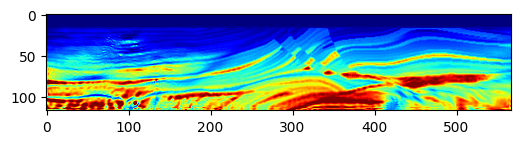

Epoch: 661 Loss:  -1.8120309114456177 model_loss:  265350.78
Epoch: 662 Loss:  -1.8117737174034119 model_loss:  264580.94
Epoch: 663 Loss:  -1.8123933672904968 model_loss:  265126.78
Epoch: 664 Loss:  -1.8124767541885376 model_loss:  264355.25
Epoch: 665 Loss:  -1.812857747077942 model_loss:  264921.66
Epoch: 666 Loss:  -1.8125796914100647 model_loss:  264165.2
Epoch: 667 Loss:  -1.8126972913742065 model_loss:  264794.62
Epoch: 668 Loss:  -1.8125411868095398 model_loss:  264033.72
Epoch: 669 Loss:  -1.8128742575645447 model_loss:  264651.6
Epoch: 670 Loss:  -1.8130448460578918 model_loss:  263884.84


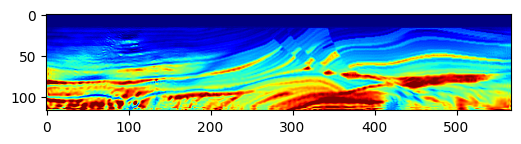

Epoch: 671 Loss:  -1.8134108185768127 model_loss:  264498.47
Epoch: 672 Loss:  -1.8130648732185364 model_loss:  263731.5
Epoch: 673 Loss:  -1.813392698764801 model_loss:  264332.5
Epoch: 674 Loss:  -1.8132375478744507 model_loss:  263566.4
Epoch: 675 Loss:  -1.8137637376785278 model_loss:  264158.22
Epoch: 676 Loss:  -1.8135814666748047 model_loss:  263416.4
Epoch: 677 Loss:  -1.8138235211372375 model_loss:  264004.94
Epoch: 678 Loss:  -1.8139185905456543 model_loss:  263251.2
Epoch: 679 Loss:  -1.814079761505127 model_loss:  263832.62
Epoch: 680 Loss:  -1.814158022403717 model_loss:  263077.12


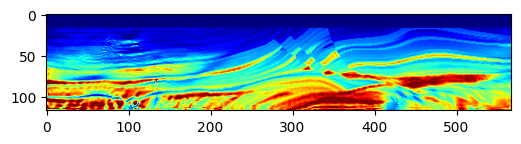

Epoch: 681 Loss:  -1.8143003582954407 model_loss:  263659.62
Epoch: 682 Loss:  -1.814535677433014 model_loss:  262913.97
Epoch: 683 Loss:  -1.814900517463684 model_loss:  263492.84
Epoch: 684 Loss:  -1.8148258924484253 model_loss:  262749.16
Epoch: 685 Loss:  -1.8148711323738098 model_loss:  263329.28
Epoch: 686 Loss:  -1.8145775198936462 model_loss:  262579.1
Epoch: 687 Loss:  -1.8149672746658325 model_loss:  263161.28
Epoch: 688 Loss:  -1.8149844408035278 model_loss:  262408.44
Epoch: 689 Loss:  -1.8153502345085144 model_loss:  263006.78
Epoch: 690 Loss:  -1.8149003982543945 model_loss:  262264.03


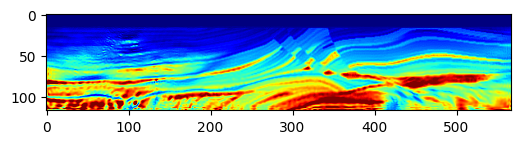

Epoch: 691 Loss:  -1.81509667634964 model_loss:  262864.8
Epoch: 692 Loss:  -1.81465083360672 model_loss:  262109.48
Epoch: 693 Loss:  -1.8151918649673462 model_loss:  262671.22
Epoch: 694 Loss:  -1.8148587942123413 model_loss:  261909.06
Epoch: 695 Loss:  -1.8153906464576721 model_loss:  262453.56
Epoch: 696 Loss:  -1.8151369094848633 model_loss:  261707.11
Epoch: 697 Loss:  -1.8155052065849304 model_loss:  262241.75
Epoch: 698 Loss:  -1.8154270648956299 model_loss:  261506.94
Epoch: 699 Loss:  -1.8156447410583496 model_loss:  262032.25
Epoch: 700 Loss:  -1.815511405467987 model_loss:  261298.92


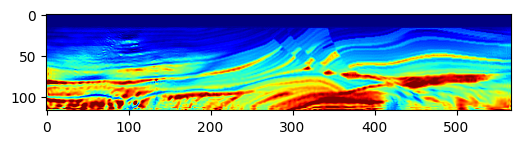

Epoch: 701 Loss:  -1.8156169652938843 model_loss:  261806.3
Epoch: 702 Loss:  -1.8155465722084045 model_loss:  261066.2
Epoch: 703 Loss:  -1.815775752067566 model_loss:  261564.39
Epoch: 704 Loss:  -1.8160234093666077 model_loss:  260839.92
Epoch: 705 Loss:  -1.8162620067596436 model_loss:  261368.31
Epoch: 706 Loss:  -1.816163957118988 model_loss:  260655.3
Epoch: 707 Loss:  -1.8163498640060425 model_loss:  261192.1
Epoch: 708 Loss:  -1.8162820935249329 model_loss:  260456.61
Epoch: 709 Loss:  -1.8165387511253357 model_loss:  261003.14
Epoch: 710 Loss:  -1.8162131309509277 model_loss:  260263.64


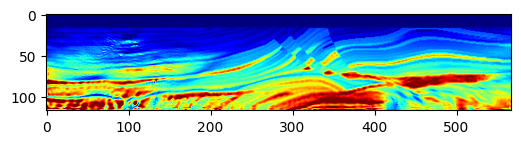

Epoch: 711 Loss:  -1.8162124156951904 model_loss:  260814.75
Epoch: 712 Loss:  -1.8164795637130737 model_loss:  260076.19
Epoch: 713 Loss:  -1.8167073130607605 model_loss:  260603.06
Epoch: 714 Loss:  -1.816794514656067 model_loss:  259886.17
Epoch: 715 Loss:  -1.8167280554771423 model_loss:  260420.8
Epoch: 716 Loss:  -1.8168141841888428 model_loss:  259713.84
Epoch: 717 Loss:  -1.8167772889137268 model_loss:  260247.06
Epoch: 718 Loss:  -1.8168861269950867 model_loss:  259530.77
Epoch: 719 Loss:  -1.8171427845954895 model_loss:  260049.5
Epoch: 720 Loss:  -1.8171215057373047 model_loss:  259336.73


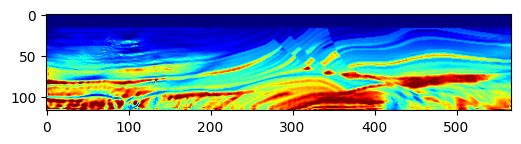

Epoch: 721 Loss:  -1.8172167539596558 model_loss:  259872.83
Epoch: 722 Loss:  -1.8167667984962463 model_loss:  259166.3
Epoch: 723 Loss:  -1.8171215057373047 model_loss:  259719.55
Epoch: 724 Loss:  -1.8167906999588013 model_loss:  259009.9
Epoch: 725 Loss:  -1.8172850012779236 model_loss:  259544.78
Epoch: 726 Loss:  -1.8168489933013916 model_loss:  258827.69
Epoch: 727 Loss:  -1.8171875476837158 model_loss:  259328.0
Epoch: 728 Loss:  -1.8170236349105835 model_loss:  258616.11
Epoch: 729 Loss:  -1.8175859451293945 model_loss:  259107.39
Epoch: 730 Loss:  -1.8174259066581726 model_loss:  258397.0


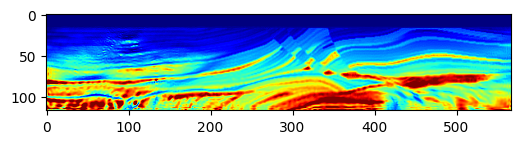

Epoch: 731 Loss:  -1.8177637457847595 model_loss:  258908.62
Epoch: 732 Loss:  -1.817318081855774 model_loss:  258189.61
Epoch: 733 Loss:  -1.817678987979889 model_loss:  258702.6
Epoch: 734 Loss:  -1.8174184560775757 model_loss:  257976.6
Epoch: 735 Loss:  -1.8179906606674194 model_loss:  258481.92
Epoch: 736 Loss:  -1.8176049590110779 model_loss:  257750.61
Epoch: 737 Loss:  -1.8181986212730408 model_loss:  258257.89
Epoch: 738 Loss:  -1.8176400065422058 model_loss:  257531.3
Epoch: 739 Loss:  -1.818237066268921 model_loss:  258026.27
Epoch: 740 Loss:  -1.8179161548614502 model_loss:  257311.25


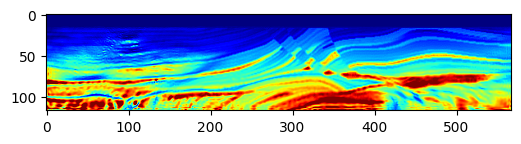

Epoch: 741 Loss:  -1.8186193704605103 model_loss:  257798.4
Epoch: 742 Loss:  -1.8182969093322754 model_loss:  257102.8
Epoch: 743 Loss:  -1.8187920451164246 model_loss:  257589.28
Epoch: 744 Loss:  -1.8183895349502563 model_loss:  256911.83
Epoch: 745 Loss:  -1.8189029097557068 model_loss:  257399.75
Epoch: 746 Loss:  -1.8187132477760315 model_loss:  256727.98
Epoch: 747 Loss:  -1.8191588521003723 model_loss:  257218.94
Epoch: 748 Loss:  -1.8189787864685059 model_loss:  256542.52
Epoch: 749 Loss:  -1.8191250562667847 model_loss:  257050.75
Epoch: 750 Loss:  -1.8189839720726013 model_loss:  256381.67


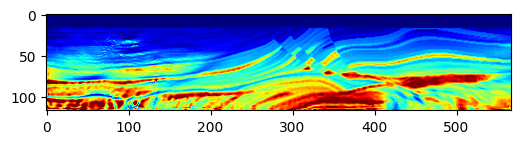

Epoch: 751 Loss:  -1.819189727306366 model_loss:  256901.92
Epoch: 752 Loss:  -1.8192384243011475 model_loss:  256238.92
Epoch: 753 Loss:  -1.8195123076438904 model_loss:  256748.28
Epoch: 754 Loss:  -1.819355547428131 model_loss:  256089.42
Epoch: 755 Loss:  -1.8194419741630554 model_loss:  256579.38
Epoch: 756 Loss:  -1.8192362189292908 model_loss:  255925.6
Epoch: 757 Loss:  -1.8194416165351868 model_loss:  256402.14
Epoch: 758 Loss:  -1.8194602727890015 model_loss:  255760.25
Epoch: 759 Loss:  -1.8195556998252869 model_loss:  256234.4
Epoch: 760 Loss:  -1.819608211517334 model_loss:  255601.69


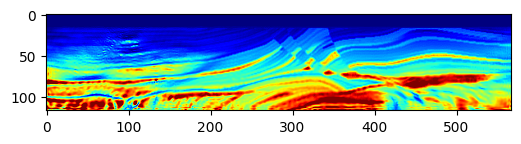

Epoch: 761 Loss:  -1.819486677646637 model_loss:  256087.22
Epoch: 762 Loss:  -1.8196765184402466 model_loss:  255449.16
Epoch: 763 Loss:  -1.8195862174034119 model_loss:  255951.0
Epoch: 764 Loss:  -1.8198579549789429 model_loss:  255296.66
Epoch: 765 Loss:  -1.8197016716003418 model_loss:  255799.58
Epoch: 766 Loss:  -1.819678544998169 model_loss:  255140.95
Epoch: 767 Loss:  -1.8196812272071838 model_loss:  255640.34
Epoch: 768 Loss:  -1.8199549913406372 model_loss:  254983.52
Epoch: 769 Loss:  -1.8201894164085388 model_loss:  255475.48
Epoch: 770 Loss:  -1.820235013961792 model_loss:  254816.77


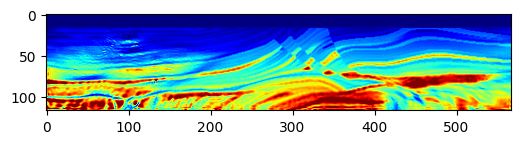

Epoch: 771 Loss:  -1.8202349543571472 model_loss:  255313.38
Epoch: 772 Loss:  -1.8202311992645264 model_loss:  254652.53
Epoch: 773 Loss:  -1.8203150629997253 model_loss:  255155.11
Epoch: 774 Loss:  -1.8203227519989014 model_loss:  254486.78
Epoch: 775 Loss:  -1.8204440474510193 model_loss:  254997.38
Epoch: 776 Loss:  -1.820406436920166 model_loss:  254329.97
Epoch: 777 Loss:  -1.8206354975700378 model_loss:  254846.75
Epoch: 778 Loss:  -1.8206189274787903 model_loss:  254175.27
Epoch: 779 Loss:  -1.8209022879600525 model_loss:  254691.62
Epoch: 780 Loss:  -1.8206392526626587 model_loss:  254019.7


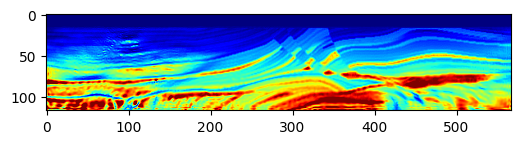

Epoch: 781 Loss:  -1.8209681510925293 model_loss:  254526.77
Epoch: 782 Loss:  -1.8206185102462769 model_loss:  253853.23
Epoch: 783 Loss:  -1.8209509253501892 model_loss:  254352.61
Epoch: 784 Loss:  -1.8206643462181091 model_loss:  253684.84
Epoch: 785 Loss:  -1.821061909198761 model_loss:  254182.2
Epoch: 786 Loss:  -1.8209348917007446 model_loss:  253523.16
Epoch: 787 Loss:  -1.8211969137191772 model_loss:  254010.94
Epoch: 788 Loss:  -1.8208274245262146 model_loss:  253360.25
Epoch: 789 Loss:  -1.8208085894584656 model_loss:  253849.33
Epoch: 790 Loss:  -1.8206055760383606 model_loss:  253200.52


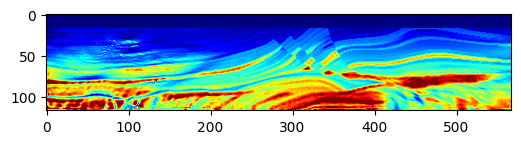

Epoch: 791 Loss:  -1.820835828781128 model_loss:  253695.11
Epoch: 792 Loss:  -1.8208590149879456 model_loss:  253038.23
Epoch: 793 Loss:  -1.8211347460746765 model_loss:  253531.64
Epoch: 794 Loss:  -1.8210803866386414 model_loss:  252858.64
Epoch: 795 Loss:  -1.8213923573493958 model_loss:  253327.3
Epoch: 796 Loss:  -1.8213178515434265 model_loss:  252653.97
Epoch: 797 Loss:  -1.8214776515960693 model_loss:  253113.44
Epoch: 798 Loss:  -1.8214462995529175 model_loss:  252449.44
Epoch: 799 Loss:  -1.821593463420868 model_loss:  252905.78
Epoch: 800 Loss:  -1.8216806054115295 model_loss:  252242.67


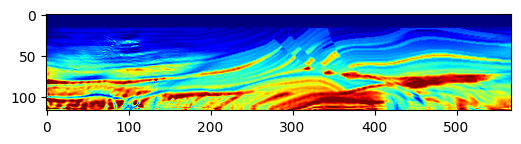

Epoch: 801 Loss:  -1.8217280507087708 model_loss:  252696.36
Epoch: 802 Loss:  -1.8218735456466675 model_loss:  252027.58
Epoch: 803 Loss:  -1.8217962980270386 model_loss:  252477.0
Epoch: 804 Loss:  -1.8220357298851013 model_loss:  251808.89
Epoch: 805 Loss:  -1.8220325112342834 model_loss:  252255.9
Epoch: 806 Loss:  -1.8223634362220764 model_loss:  251586.52
Epoch: 807 Loss:  -1.822388768196106 model_loss:  252023.94
Epoch: 808 Loss:  -1.822554588317871 model_loss:  251351.6
Epoch: 809 Loss:  -1.8226092457771301 model_loss:  251791.31
Epoch: 810 Loss:  -1.8227603435516357 model_loss:  251116.5


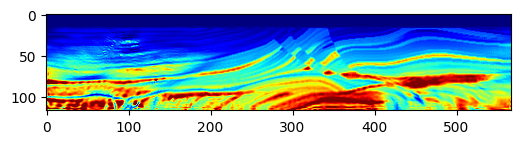

Epoch: 811 Loss:  -1.8228756189346313 model_loss:  251554.78
Epoch: 812 Loss:  -1.822775661945343 model_loss:  250879.78
Epoch: 813 Loss:  -1.8228570222854614 model_loss:  251325.03
Epoch: 814 Loss:  -1.822641372680664 model_loss:  250647.45
Epoch: 815 Loss:  -1.8229172229766846 model_loss:  251091.31
Epoch: 816 Loss:  -1.8226406574249268 model_loss:  250411.11
Epoch: 817 Loss:  -1.8229039311408997 model_loss:  250847.94
Epoch: 818 Loss:  -1.8225571513175964 model_loss:  250162.05
Epoch: 819 Loss:  -1.8226507902145386 model_loss:  250595.89
Epoch: 820 Loss:  -1.8224692344665527 model_loss:  249913.4


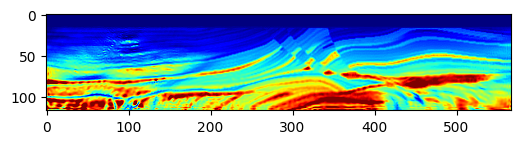

Epoch: 821 Loss:  -1.8227548599243164 model_loss:  250355.44
Epoch: 822 Loss:  -1.8229981660842896 model_loss:  249682.16
Epoch: 823 Loss:  -1.823091745376587 model_loss:  250136.44
Epoch: 824 Loss:  -1.8231242895126343 model_loss:  249467.81
Epoch: 825 Loss:  -1.8227446675300598 model_loss:  249938.36
Epoch: 826 Loss:  -1.8229994177818298 model_loss:  249269.22
Epoch: 827 Loss:  -1.8228840231895447 model_loss:  249751.89
Epoch: 828 Loss:  -1.8235347270965576 model_loss:  249092.48
Epoch: 829 Loss:  -1.8233794569969177 model_loss:  249580.62
Epoch: 830 Loss:  -1.8237041234970093 model_loss:  248918.61


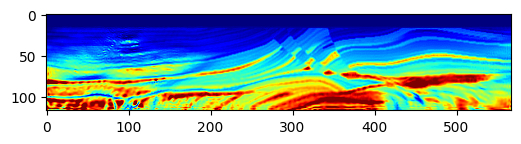

Epoch: 831 Loss:  -1.8235442638397217 model_loss:  249416.33
Epoch: 832 Loss:  -1.8237048983573914 model_loss:  248752.55
Epoch: 833 Loss:  -1.8239405155181885 model_loss:  249246.33
Epoch: 834 Loss:  -1.8239156007766724 model_loss:  248572.98
Epoch: 835 Loss:  -1.8241289258003235 model_loss:  249050.7
Epoch: 836 Loss:  -1.8238454461097717 model_loss:  248371.53
Epoch: 837 Loss:  -1.8240880370140076 model_loss:  248845.1
Epoch: 838 Loss:  -1.8238192200660706 model_loss:  248150.03
Epoch: 839 Loss:  -1.8241745233535767 model_loss:  248619.12
Epoch: 840 Loss:  -1.8239074349403381 model_loss:  247910.19


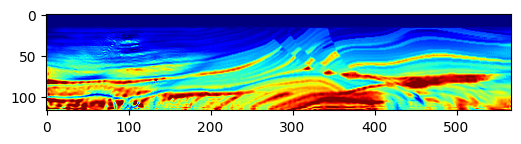

Epoch: 841 Loss:  -1.8242709040641785 model_loss:  248377.89
Epoch: 842 Loss:  -1.8239006400108337 model_loss:  247658.42
Epoch: 843 Loss:  -1.8242490887641907 model_loss:  248122.16
Epoch: 844 Loss:  -1.8239145874977112 model_loss:  247412.48
Epoch: 845 Loss:  -1.8244537711143494 model_loss:  247874.1
Epoch: 846 Loss:  -1.824142575263977 model_loss:  247175.44
Epoch: 847 Loss:  -1.8247807621955872 model_loss:  247631.5
Epoch: 848 Loss:  -1.8243133425712585 model_loss:  246935.52
Epoch: 849 Loss:  -1.824863314628601 model_loss:  247387.98
Epoch: 850 Loss:  -1.8243489265441895 model_loss:  246689.39


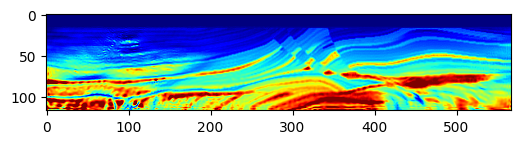

Epoch: 851 Loss:  -1.8248416781425476 model_loss:  247140.48
Epoch: 852 Loss:  -1.8243452906608582 model_loss:  246448.4
Epoch: 853 Loss:  -1.8249216079711914 model_loss:  246904.6
Epoch: 854 Loss:  -1.8243776559829712 model_loss:  246205.84
Epoch: 855 Loss:  -1.8249263167381287 model_loss:  246666.31
Epoch: 856 Loss:  -1.8243554830551147 model_loss:  245963.62
Epoch: 857 Loss:  -1.8249412178993225 model_loss:  246437.31
Epoch: 858 Loss:  -1.8244453072547913 model_loss:  245745.02
Epoch: 859 Loss:  -1.825136423110962 model_loss:  246230.56
Epoch: 860 Loss:  -1.8246477246284485 model_loss:  245552.42


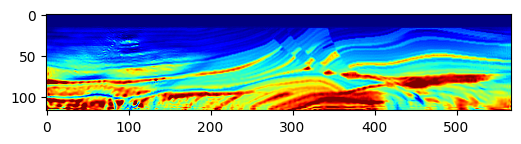

Epoch: 861 Loss:  -1.8253100514411926 model_loss:  246044.67
Epoch: 862 Loss:  -1.8248354196548462 model_loss:  245358.2
Epoch: 863 Loss:  -1.825510859489441 model_loss:  245843.36
Epoch: 864 Loss:  -1.8251535296440125 model_loss:  245154.55
Epoch: 865 Loss:  -1.8258734941482544 model_loss:  245630.53
Epoch: 866 Loss:  -1.8254640102386475 model_loss:  244930.45
Epoch: 867 Loss:  -1.826070249080658 model_loss:  245395.78
Epoch: 868 Loss:  -1.8254477977752686 model_loss:  244691.88
Epoch: 869 Loss:  -1.8260750770568848 model_loss:  245164.73
Epoch: 870 Loss:  -1.8255179524421692 model_loss:  244453.1


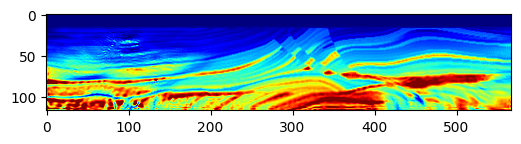

Epoch: 871 Loss:  -1.8262960314750671 model_loss:  244920.44
Epoch: 872 Loss:  -1.8257697224617004 model_loss:  244201.19
Epoch: 873 Loss:  -1.826456367969513 model_loss:  244664.3
Epoch: 874 Loss:  -1.825814127922058 model_loss:  243936.22
Epoch: 875 Loss:  -1.8263964653015137 model_loss:  244393.52
Epoch: 876 Loss:  -1.825839102268219 model_loss:  243677.73
Epoch: 877 Loss:  -1.826500654220581 model_loss:  244149.45
Epoch: 878 Loss:  -1.8260236382484436 model_loss:  243448.64
Epoch: 879 Loss:  -1.8266148567199707 model_loss:  243933.23
Epoch: 880 Loss:  -1.825986385345459 model_loss:  243246.44


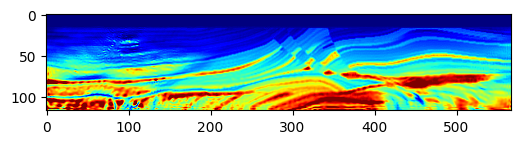

Epoch: 881 Loss:  -1.8265820145606995 model_loss:  243743.61
Epoch: 882 Loss:  -1.8259993195533752 model_loss:  243059.44
Epoch: 883 Loss:  -1.8267244696617126 model_loss:  243549.6
Epoch: 884 Loss:  -1.8260888457298279 model_loss:  242865.67
Epoch: 885 Loss:  -1.82673579454422 model_loss:  243354.84
Epoch: 886 Loss:  -1.8260412812232971 model_loss:  242663.88
Epoch: 887 Loss:  -1.8266223669052124 model_loss:  243146.8
Epoch: 888 Loss:  -1.8261935710906982 model_loss:  242458.39
Epoch: 889 Loss:  -1.8267446756362915 model_loss:  242933.16
Epoch: 890 Loss:  -1.826241135597229 model_loss:  242244.31


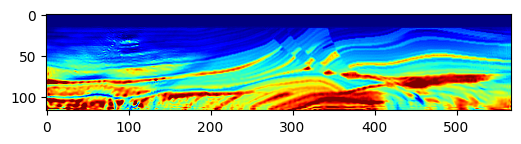

Epoch: 891 Loss:  -1.8269050121307373 model_loss:  242705.83
Epoch: 892 Loss:  -1.8265278935432434 model_loss:  242019.12
Epoch: 893 Loss:  -1.827400803565979 model_loss:  242464.55
Epoch: 894 Loss:  -1.8268888592720032 model_loss:  241781.95
Epoch: 895 Loss:  -1.8274837136268616 model_loss:  242227.83
Epoch: 896 Loss:  -1.8266778588294983 model_loss:  241553.3
Epoch: 897 Loss:  -1.8273630142211914 model_loss:  242009.83
Epoch: 898 Loss:  -1.8268094062805176 model_loss:  241341.33
Epoch: 899 Loss:  -1.8277632594108582 model_loss:  241798.69
Epoch: 900 Loss:  -1.8270632028579712 model_loss:  241142.33


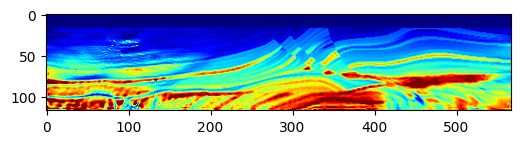

Epoch: 901 Loss:  -1.8277339935302734 model_loss:  241602.72
Epoch: 902 Loss:  -1.8270998001098633 model_loss:  240950.89
Epoch: 903 Loss:  -1.8279711604118347 model_loss:  241399.0
Epoch: 904 Loss:  -1.8273652791976929 model_loss:  240735.88
Epoch: 905 Loss:  -1.828269124031067 model_loss:  241168.98
Epoch: 906 Loss:  -1.8274272084236145 model_loss:  240486.92
Epoch: 907 Loss:  -1.8280926942825317 model_loss:  240911.34
Epoch: 908 Loss:  -1.827307105064392 model_loss:  240221.89
Epoch: 909 Loss:  -1.8282426595687866 model_loss:  240632.45
Epoch: 910 Loss:  -1.8277209997177124 model_loss:  239945.38


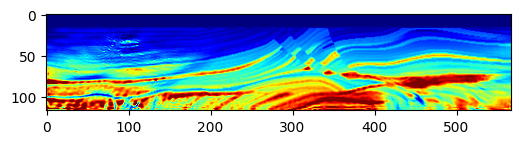

Epoch: 911 Loss:  -1.82857084274292 model_loss:  240352.36
Epoch: 912 Loss:  -1.8277179598808289 model_loss:  239675.92
Epoch: 913 Loss:  -1.828326940536499 model_loss:  240093.44
Epoch: 914 Loss:  -1.827444851398468 model_loss:  239422.83
Epoch: 915 Loss:  -1.8283668756484985 model_loss:  239847.67
Epoch: 916 Loss:  -1.8276921510696411 model_loss:  239187.89
Epoch: 917 Loss:  -1.828631579875946 model_loss:  239616.78
Epoch: 918 Loss:  -1.8278039693832397 model_loss:  238971.12
Epoch: 919 Loss:  -1.8285709619522095 model_loss:  239407.45
Epoch: 920 Loss:  -1.8277802467346191 model_loss:  238768.33


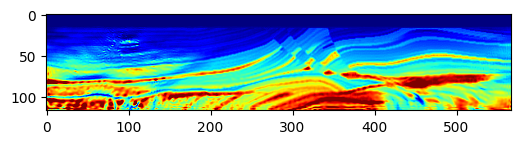

Epoch: 921 Loss:  -1.8287700414657593 model_loss:  239199.78
Epoch: 922 Loss:  -1.8279818892478943 model_loss:  238560.97
Epoch: 923 Loss:  -1.8288599848747253 model_loss:  238984.98
Epoch: 924 Loss:  -1.8277713060379028 model_loss:  238336.92
Epoch: 925 Loss:  -1.828512728214264 model_loss:  238749.06
Epoch: 926 Loss:  -1.8272851705551147 model_loss:  238077.77
Epoch: 927 Loss:  -1.8282926678657532 model_loss:  238476.23
Epoch: 928 Loss:  -1.8274146914482117 model_loss:  237793.45
Epoch: 929 Loss:  -1.828495740890503 model_loss:  238184.66
Epoch: 930 Loss:  -1.8276639580726624 model_loss:  237502.4


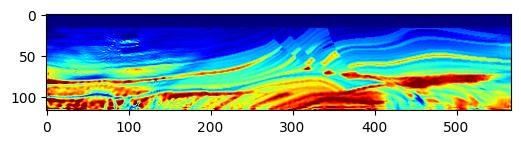

Epoch: 931 Loss:  -1.8282893896102905 model_loss:  237897.42
Epoch: 932 Loss:  -1.8273639678955078 model_loss:  237210.47
Epoch: 933 Loss:  -1.8281542658805847 model_loss:  237600.86
Epoch: 934 Loss:  -1.8275643587112427 model_loss:  236895.45
Epoch: 935 Loss:  -1.828531801700592 model_loss:  237270.92
Epoch: 936 Loss:  -1.8280262351036072 model_loss:  236551.83
Epoch: 937 Loss:  -1.828861117362976 model_loss:  236920.34
Epoch: 938 Loss:  -1.828231155872345 model_loss:  236212.58
Epoch: 939 Loss:  -1.829084575176239 model_loss:  236603.3
Epoch: 940 Loss:  -1.8284968137741089 model_loss:  235929.94


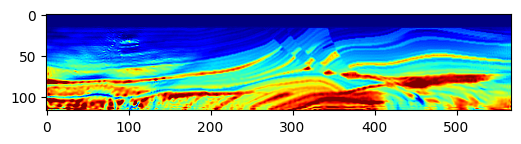

Epoch: 941 Loss:  -1.8294920921325684 model_loss:  236349.1
Epoch: 942 Loss:  -1.8288964629173279 model_loss:  235709.67
Epoch: 943 Loss:  -1.8296297192573547 model_loss:  236147.36
Epoch: 944 Loss:  -1.8288219571113586 model_loss:  235517.56
Epoch: 945 Loss:  -1.8295230865478516 model_loss:  235951.92
Epoch: 946 Loss:  -1.82891845703125 model_loss:  235320.58
Epoch: 947 Loss:  -1.8298413157463074 model_loss:  235746.6
Epoch: 948 Loss:  -1.8292479515075684 model_loss:  235111.05
Epoch: 949 Loss:  -1.8300099968910217 model_loss:  235529.89
Epoch: 950 Loss:  -1.8293038606643677 model_loss:  234881.84


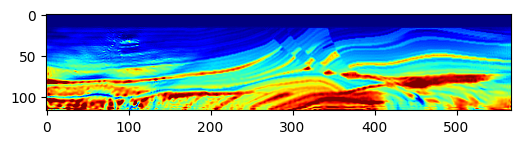

Epoch: 951 Loss:  -1.8301539421081543 model_loss:  235291.67
Epoch: 952 Loss:  -1.829654037952423 model_loss:  234634.2
Epoch: 953 Loss:  -1.830688714981079 model_loss:  235040.1
Epoch: 954 Loss:  -1.8299851417541504 model_loss:  234384.84
Epoch: 955 Loss:  -1.8307626247406006 model_loss:  234804.75
Epoch: 956 Loss:  -1.8297176361083984 model_loss:  234150.06
Epoch: 957 Loss:  -1.830540955066681 model_loss:  234577.27
Epoch: 958 Loss:  -1.8296109437942505 model_loss:  233909.02
Epoch: 959 Loss:  -1.8304281830787659 model_loss:  234326.14
Epoch: 960 Loss:  -1.829563319683075 model_loss:  233646.02


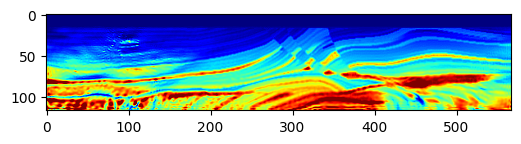

Epoch: 961 Loss:  -1.8303284645080566 model_loss:  234049.86
Epoch: 962 Loss:  -1.8297618627548218 model_loss:  233380.39
Epoch: 963 Loss:  -1.8306478261947632 model_loss:  233775.66
Epoch: 964 Loss:  -1.8300308585166931 model_loss:  233131.67
Epoch: 965 Loss:  -1.83072829246521 model_loss:  233523.69
Epoch: 966 Loss:  -1.8299776315689087 model_loss:  232892.39
Epoch: 967 Loss:  -1.8307204246520996 model_loss:  233280.5
Epoch: 968 Loss:  -1.8300989866256714 model_loss:  232636.58
Epoch: 969 Loss:  -1.8310731649398804 model_loss:  233016.64
Epoch: 970 Loss:  -1.830396831035614 model_loss:  232357.38


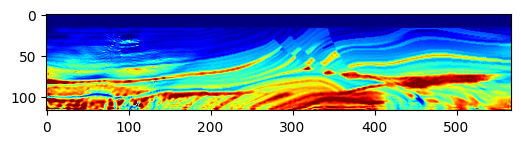

Epoch: 971 Loss:  -1.8313704133033752 model_loss:  232738.66
Epoch: 972 Loss:  -1.8304049968719482 model_loss:  232076.36
Epoch: 973 Loss:  -1.8313713073730469 model_loss:  232467.45
Epoch: 974 Loss:  -1.8304259181022644 model_loss:  231814.95
Epoch: 975 Loss:  -1.8316314816474915 model_loss:  232214.62
Epoch: 976 Loss:  -1.8307288885116577 model_loss:  231560.67
Epoch: 977 Loss:  -1.8318039178848267 model_loss:  231962.33
Epoch: 978 Loss:  -1.8306649327278137 model_loss:  231299.1
Epoch: 979 Loss:  -1.8315837979316711 model_loss:  231708.8
Epoch: 980 Loss:  -1.83037668466568 model_loss:  231039.95


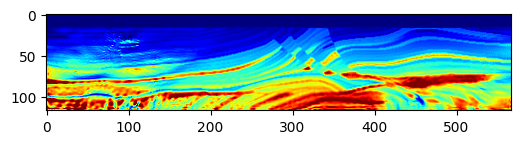

Epoch: 981 Loss:  -1.8314432501792908 model_loss:  231456.53
Epoch: 982 Loss:  -1.8307090997695923 model_loss:  230798.86
Epoch: 983 Loss:  -1.8320059180259705 model_loss:  231209.05
Epoch: 984 Loss:  -1.8313826322555542 model_loss:  230567.03
Epoch: 985 Loss:  -1.831994116306305 model_loss:  230986.33
Epoch: 986 Loss:  -1.8310999274253845 model_loss:  230353.67
Epoch: 987 Loss:  -1.8317243456840515 model_loss:  230797.6
Epoch: 988 Loss:  -1.8314290642738342 model_loss:  230169.69
Epoch: 989 Loss:  -1.8325110077857971 model_loss:  230612.3
Epoch: 990 Loss:  -1.8318032026290894 model_loss:  229974.75


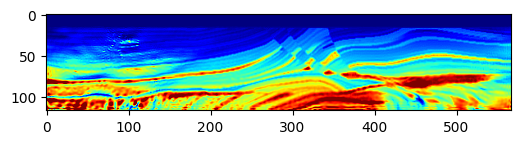

Epoch: 991 Loss:  -1.832054078578949 model_loss:  230416.0
Epoch: 992 Loss:  -1.8308945298194885 model_loss:  229757.95
Epoch: 993 Loss:  -1.8316884636878967 model_loss:  230197.95
Epoch: 994 Loss:  -1.8315299153327942 model_loss:  229531.78
Epoch: 995 Loss:  -1.8328826427459717 model_loss:  229946.56
Epoch: 996 Loss:  -1.8321011662483215 model_loss:  229296.78
Epoch: 997 Loss:  -1.8322904109954834 model_loss:  229709.6
Epoch: 998 Loss:  -1.8310580849647522 model_loss:  229086.73
Epoch: 999 Loss:  -1.8318439722061157 model_loss:  229497.88
Epoch: 1000 Loss:  -1.8319344520568848 model_loss:  228878.22


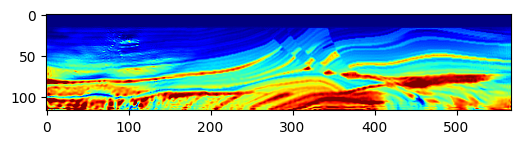

Epoch: 1001 Loss:  -1.8327845335006714 model_loss:  229273.66
Epoch: 1002 Loss:  -1.8320435285568237 model_loss:  228629.28
Epoch: 1003 Loss:  -1.8318987488746643 model_loss:  229047.48
Epoch: 1004 Loss:  -1.831304669380188 model_loss:  228382.48
Epoch: 1005 Loss:  -1.8322414755821228 model_loss:  228801.72
Epoch: 1006 Loss:  -1.8318886160850525 model_loss:  228144.66
Epoch: 1007 Loss:  -1.8327555060386658 model_loss:  228542.7
Epoch: 1008 Loss:  -1.8313806653022766 model_loss:  227897.97
Epoch: 1009 Loss:  -1.8318670392036438 model_loss:  228300.98
Epoch: 1010 Loss:  -1.830935001373291 model_loss:  227661.69


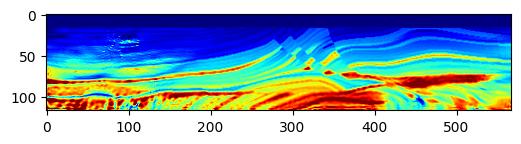

Epoch: 1011 Loss:  -1.8324220180511475 model_loss:  228084.1
Epoch: 1012 Loss:  -1.8322497606277466 model_loss:  227444.39
Epoch: 1013 Loss:  -1.8333515524864197 model_loss:  227870.75
Epoch: 1014 Loss:  -1.8323493599891663 model_loss:  227239.66
Epoch: 1015 Loss:  -1.8329161405563354 model_loss:  227673.55
Epoch: 1016 Loss:  -1.83225816488266 model_loss:  227041.73
Epoch: 1017 Loss:  -1.8332940340042114 model_loss:  227470.73
Epoch: 1018 Loss:  -1.8332106471061707 model_loss:  226821.5
Epoch: 1019 Loss:  -1.8340168595314026 model_loss:  227252.1
Epoch: 1020 Loss:  -1.8334513902664185 model_loss:  226582.98


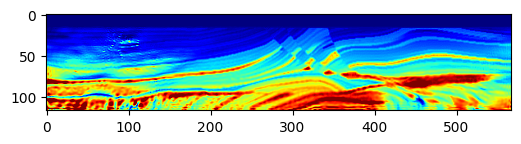

Epoch: 1021 Loss:  -1.8335774540901184 model_loss:  227032.75
Epoch: 1022 Loss:  -1.8330857753753662 model_loss:  226359.58
Epoch: 1023 Loss:  -1.8335686326026917 model_loss:  226812.53
Epoch: 1024 Loss:  -1.8336843848228455 model_loss:  226160.73
Epoch: 1025 Loss:  -1.8340457677841187 model_loss:  226618.45
Epoch: 1026 Loss:  -1.833575427532196 model_loss:  225985.08
Epoch: 1027 Loss:  -1.833735167980194 model_loss:  226458.5
Epoch: 1028 Loss:  -1.8334506154060364 model_loss:  225832.9
Epoch: 1029 Loss:  -1.834108054637909 model_loss:  226310.52
Epoch: 1030 Loss:  -1.8338235020637512 model_loss:  225687.61


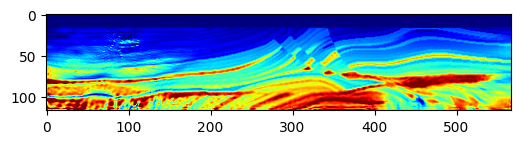

Epoch: 1031 Loss:  -1.8341721296310425 model_loss:  226154.55
Epoch: 1032 Loss:  -1.8336521983146667 model_loss:  225528.31
Epoch: 1033 Loss:  -1.8339130282402039 model_loss:  225986.66
Epoch: 1034 Loss:  -1.8335369229316711 model_loss:  225349.1
Epoch: 1035 Loss:  -1.834134042263031 model_loss:  225800.55
Epoch: 1036 Loss:  -1.833857536315918 model_loss:  225145.3
Epoch: 1037 Loss:  -1.834443747997284 model_loss:  225596.78
Epoch: 1038 Loss:  -1.8339219093322754 model_loss:  224926.3
Epoch: 1039 Loss:  -1.8345320224761963 model_loss:  225383.72
Epoch: 1040 Loss:  -1.83414226770401 model_loss:  224708.03


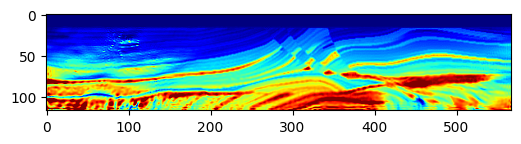

Epoch: 1041 Loss:  -1.8348615169525146 model_loss:  225167.98
Epoch: 1042 Loss:  -1.8344308137893677 model_loss:  224501.89
Epoch: 1043 Loss:  -1.8349494338035583 model_loss:  224966.06
Epoch: 1044 Loss:  -1.8345328569412231 model_loss:  224309.53
Epoch: 1045 Loss:  -1.8350924849510193 model_loss:  224771.77
Epoch: 1046 Loss:  -1.8347234725952148 model_loss:  224122.4
Epoch: 1047 Loss:  -1.8353228569030762 model_loss:  224577.89
Epoch: 1048 Loss:  -1.8347563743591309 model_loss:  223933.75
Epoch: 1049 Loss:  -1.8353082537651062 model_loss:  224386.39
Epoch: 1050 Loss:  -1.8346886038780212 model_loss:  223737.25


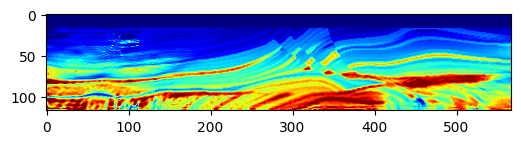

Epoch: 1051 Loss:  -1.8353750109672546 model_loss:  224186.28
Epoch: 1052 Loss:  -1.8347870707511902 model_loss:  223530.6
Epoch: 1053 Loss:  -1.8354432582855225 model_loss:  223988.9
Epoch: 1054 Loss:  -1.8347925543785095 model_loss:  223333.27
Epoch: 1055 Loss:  -1.8354641199111938 model_loss:  223797.45
Epoch: 1056 Loss:  -1.8348788619041443 model_loss:  223138.67
Epoch: 1057 Loss:  -1.8352712392807007 model_loss:  223592.44
Epoch: 1058 Loss:  -1.834636628627777 model_loss:  222938.88
Epoch: 1059 Loss:  -1.8349332809448242 model_loss:  223379.28
Epoch: 1060 Loss:  -1.834924340248108 model_loss:  222735.33


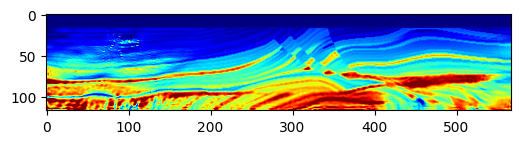

Epoch: 1061 Loss:  -1.835411250591278 model_loss:  223157.44
Epoch: 1062 Loss:  -1.8352667093276978 model_loss:  222518.61
Epoch: 1063 Loss:  -1.8353960514068604 model_loss:  222939.27
Epoch: 1064 Loss:  -1.835151731967926 model_loss:  222286.86
Epoch: 1065 Loss:  -1.8351431488990784 model_loss:  222729.6
Epoch: 1066 Loss:  -1.8353551030158997 model_loss:  222070.84
Epoch: 1067 Loss:  -1.8356695175170898 model_loss:  222522.94
Epoch: 1068 Loss:  -1.8360718488693237 model_loss:  221867.08
Epoch: 1069 Loss:  -1.836107850074768 model_loss:  222319.9
Epoch: 1070 Loss:  -1.8357908725738525 model_loss:  221673.75


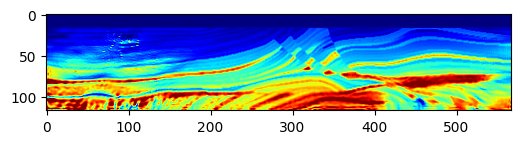

Epoch: 1071 Loss:  -1.8358600735664368 model_loss:  222131.06
Epoch: 1072 Loss:  -1.835651934146881 model_loss:  221487.88
Epoch: 1073 Loss:  -1.8363337516784668 model_loss:  221947.88
Epoch: 1074 Loss:  -1.8361560702323914 model_loss:  221309.61
Epoch: 1075 Loss:  -1.83661550283432 model_loss:  221769.97
Epoch: 1076 Loss:  -1.8361905813217163 model_loss:  221132.44
Epoch: 1077 Loss:  -1.836406409740448 model_loss:  221596.45
Epoch: 1078 Loss:  -1.836069941520691 model_loss:  220954.03
Epoch: 1079 Loss:  -1.8363208770751953 model_loss:  221414.5
Epoch: 1080 Loss:  -1.8361645936965942 model_loss:  220768.19


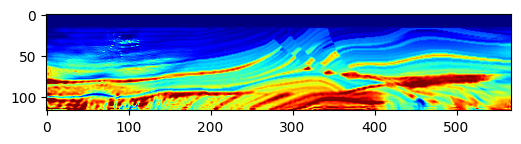

Epoch: 1081 Loss:  -1.8364028334617615 model_loss:  221229.2
Epoch: 1082 Loss:  -1.8363173604011536 model_loss:  220587.25
Epoch: 1083 Loss:  -1.8365800380706787 model_loss:  221048.7
Epoch: 1084 Loss:  -1.8363494873046875 model_loss:  220414.72
Epoch: 1085 Loss:  -1.836428940296173 model_loss:  220877.9
Epoch: 1086 Loss:  -1.8366502523422241 model_loss:  220252.42
Epoch: 1087 Loss:  -1.8368667364120483 model_loss:  220712.12
Epoch: 1088 Loss:  -1.8369885683059692 model_loss:  220090.06
Epoch: 1089 Loss:  -1.8368404507637024 model_loss:  220551.94
Epoch: 1090 Loss:  -1.8366417288780212 model_loss:  219939.83


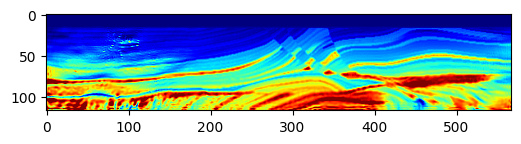

Epoch: 1091 Loss:  -1.8369600772857666 model_loss:  220400.69
Epoch: 1092 Loss:  -1.8366557359695435 model_loss:  219804.7
Epoch: 1093 Loss:  -1.8370414972305298 model_loss:  220248.03
Epoch: 1094 Loss:  -1.836656391620636 model_loss:  219666.98
Epoch: 1095 Loss:  -1.8372423648834229 model_loss:  220108.84
Epoch: 1096 Loss:  -1.8370136618614197 model_loss:  219526.9
Epoch: 1097 Loss:  -1.8373550772666931 model_loss:  219980.81
Epoch: 1098 Loss:  -1.8368699550628662 model_loss:  219386.89
Epoch: 1099 Loss:  -1.8371544480323792 model_loss:  219868.8
Epoch: 1100 Loss:  -1.8370363116264343 model_loss:  219253.11


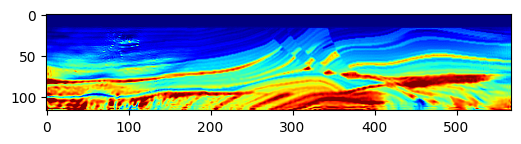

Epoch: 1101 Loss:  -1.8374646306037903 model_loss:  219743.72
Epoch: 1102 Loss:  -1.8374605774879456 model_loss:  219105.56
Epoch: 1103 Loss:  -1.837562382221222 model_loss:  219566.23
Epoch: 1104 Loss:  -1.8373188972473145 model_loss:  218925.11
Epoch: 1105 Loss:  -1.8374019265174866 model_loss:  219366.88
Epoch: 1106 Loss:  -1.8374635577201843 model_loss:  218749.92
Epoch: 1107 Loss:  -1.8377647995948792 model_loss:  219191.81
Epoch: 1108 Loss:  -1.8378701210021973 model_loss:  218595.16
Epoch: 1109 Loss:  -1.8378751873970032 model_loss:  219021.75
Epoch: 1110 Loss:  -1.837733805179596 model_loss:  218418.98


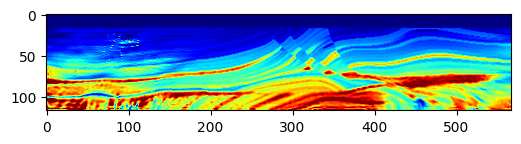

Epoch: 1111 Loss:  -1.8377695679664612 model_loss:  218837.12
Epoch: 1112 Loss:  -1.8379133343696594 model_loss:  218214.58
Epoch: 1113 Loss:  -1.8381098508834839 model_loss:  218624.86
Epoch: 1114 Loss:  -1.8383888006210327 model_loss:  217986.73
Epoch: 1115 Loss:  -1.838266372680664 model_loss:  218402.47
Epoch: 1116 Loss:  -1.8383386135101318 model_loss:  217768.95
Epoch: 1117 Loss:  -1.8380905389785767 model_loss:  218191.67
Epoch: 1118 Loss:  -1.8383166193962097 model_loss:  217575.73
Epoch: 1119 Loss:  -1.8384556770324707 model_loss:  217991.11
Epoch: 1120 Loss:  -1.838542878627777 model_loss:  217386.5


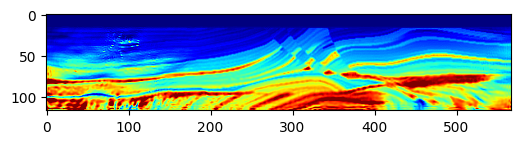

Epoch: 1121 Loss:  -1.8385075330734253 model_loss:  217791.34
Epoch: 1122 Loss:  -1.8383728861808777 model_loss:  217185.11
Epoch: 1123 Loss:  -1.8384429216384888 model_loss:  217593.7
Epoch: 1124 Loss:  -1.838723361492157 model_loss:  216985.45
Epoch: 1125 Loss:  -1.8387980461120605 model_loss:  217399.86
Epoch: 1126 Loss:  -1.8389045000076294 model_loss:  216794.19
Epoch: 1127 Loss:  -1.8386688828468323 model_loss:  217216.45
Epoch: 1128 Loss:  -1.8388696312904358 model_loss:  216621.22
Epoch: 1129 Loss:  -1.8387374877929688 model_loss:  217050.92
Epoch: 1130 Loss:  -1.839199423789978 model_loss:  216466.33


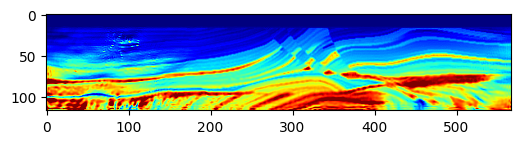

Epoch: 1131 Loss:  -1.8388845920562744 model_loss:  216899.1
Epoch: 1132 Loss:  -1.839184284210205 model_loss:  216307.05
Epoch: 1133 Loss:  -1.8386144638061523 model_loss:  216753.34
Epoch: 1134 Loss:  -1.839085578918457 model_loss:  216151.11
Epoch: 1135 Loss:  -1.8387067317962646 model_loss:  216609.69
Epoch: 1136 Loss:  -1.8392137289047241 model_loss:  215999.98
Epoch: 1137 Loss:  -1.8388846516609192 model_loss:  216456.73
Epoch: 1138 Loss:  -1.839125156402588 model_loss:  215845.3
Epoch: 1139 Loss:  -1.8389191031455994 model_loss:  216305.22
Epoch: 1140 Loss:  -1.8391824960708618 model_loss:  215696.84


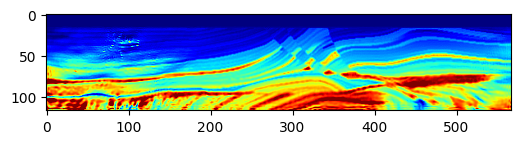

Epoch: 1141 Loss:  -1.8391108512878418 model_loss:  216161.56
Epoch: 1142 Loss:  -1.8393648862838745 model_loss:  215560.88
Epoch: 1143 Loss:  -1.8391293287277222 model_loss:  216020.2
Epoch: 1144 Loss:  -1.8392876386642456 model_loss:  215426.69
Epoch: 1145 Loss:  -1.8391577005386353 model_loss:  215874.56
Epoch: 1146 Loss:  -1.839470386505127 model_loss:  215296.73
Epoch: 1147 Loss:  -1.8394548892974854 model_loss:  215732.17
Epoch: 1148 Loss:  -1.839573860168457 model_loss:  215164.16
Epoch: 1149 Loss:  -1.8393855690956116 model_loss:  215594.5
Epoch: 1150 Loss:  -1.839607298374176 model_loss:  215032.52


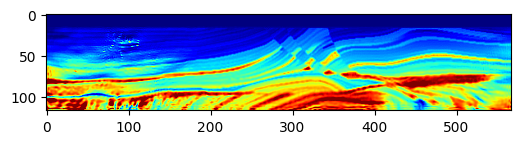

Epoch: 1151 Loss:  -1.8394922018051147 model_loss:  215441.56
Epoch: 1152 Loss:  -1.8398979306221008 model_loss:  214872.02
Epoch: 1153 Loss:  -1.8398181200027466 model_loss:  215280.62
Epoch: 1154 Loss:  -1.8402226567268372 model_loss:  214711.28
Epoch: 1155 Loss:  -1.8400604724884033 model_loss:  215140.48
Epoch: 1156 Loss:  -1.8403803706169128 model_loss:  214557.98
Epoch: 1157 Loss:  -1.8401485085487366 model_loss:  214997.6
Epoch: 1158 Loss:  -1.8404417037963867 model_loss:  214406.75
Epoch: 1159 Loss:  -1.840128481388092 model_loss:  214842.02
Epoch: 1160 Loss:  -1.8404662013053894 model_loss:  214247.97


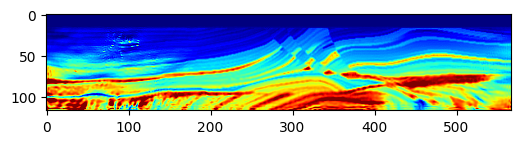

Epoch: 1161 Loss:  -1.8400814533233643 model_loss:  214677.8
Epoch: 1162 Loss:  -1.8406471014022827 model_loss:  214100.89
Epoch: 1163 Loss:  -1.8401969075202942 model_loss:  214513.53
Epoch: 1164 Loss:  -1.8407222032546997 model_loss:  213949.52
Epoch: 1165 Loss:  -1.8400754928588867 model_loss:  214352.95
Epoch: 1166 Loss:  -1.8407456278800964 model_loss:  213795.12
Epoch: 1167 Loss:  -1.8400756120681763 model_loss:  214208.94
Epoch: 1168 Loss:  -1.8408283591270447 model_loss:  213643.55
Epoch: 1169 Loss:  -1.8400213718414307 model_loss:  214076.89
Epoch: 1170 Loss:  -1.8407430052757263 model_loss:  213508.72


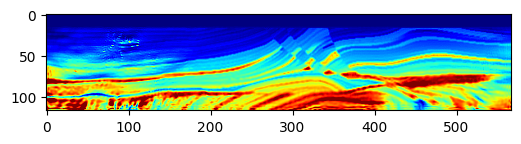

Epoch: 1171 Loss:  -1.8399084210395813 model_loss:  213941.83
Epoch: 1172 Loss:  -1.8407644033432007 model_loss:  213371.34
Epoch: 1173 Loss:  -1.840095341205597 model_loss:  213803.64
Epoch: 1174 Loss:  -1.840926706790924 model_loss:  213235.47
Epoch: 1175 Loss:  -1.8403512239456177 model_loss:  213655.42
Epoch: 1176 Loss:  -1.841001033782959 model_loss:  213075.31
Epoch: 1177 Loss:  -1.840358018875122 model_loss:  213493.95
Epoch: 1178 Loss:  -1.8407112956047058 model_loss:  212912.11
Epoch: 1179 Loss:  -1.8402633666992188 model_loss:  213332.27
Epoch: 1180 Loss:  -1.8408423066139221 model_loss:  212756.2


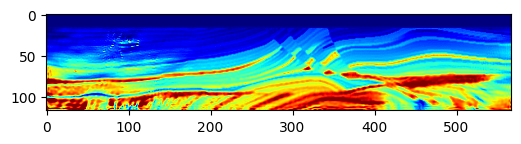

Epoch: 1181 Loss:  -1.8406723737716675 model_loss:  213173.62
Epoch: 1182 Loss:  -1.8405996561050415 model_loss:  212610.2
Epoch: 1183 Loss:  -1.8404673337936401 model_loss:  213019.58
Epoch: 1184 Loss:  -1.8400611877441406 model_loss:  212454.47
Epoch: 1185 Loss:  -1.8404132723808289 model_loss:  212855.86
Epoch: 1186 Loss:  -1.840220332145691 model_loss:  212290.58
Epoch: 1187 Loss:  -1.8409347534179688 model_loss:  212670.36
Epoch: 1188 Loss:  -1.8406003713607788 model_loss:  212095.55
Epoch: 1189 Loss:  -1.8409529328346252 model_loss:  212466.2
Epoch: 1190 Loss:  -1.84048593044281 model_loss:  211896.92


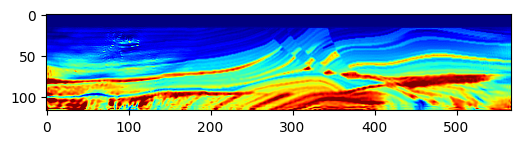

Epoch: 1191 Loss:  -1.8410223722457886 model_loss:  212280.38
Epoch: 1192 Loss:  -1.8411222696304321 model_loss:  211727.27
Epoch: 1193 Loss:  -1.8415892124176025 model_loss:  212122.08
Epoch: 1194 Loss:  -1.841279685497284 model_loss:  211578.27
Epoch: 1195 Loss:  -1.8414583206176758 model_loss:  211985.08
Epoch: 1196 Loss:  -1.8414127826690674 model_loss:  211437.14
Epoch: 1197 Loss:  -1.8419319987297058 model_loss:  211857.97
Epoch: 1198 Loss:  -1.8420011401176453 model_loss:  211317.6
Epoch: 1199 Loss:  -1.8421871662139893 model_loss:  211722.31
Epoch: 1200 Loss:  -1.8418527245521545 model_loss:  211164.89


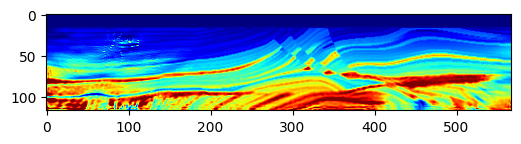

Epoch: 1201 Loss:  -1.8419086933135986 model_loss:  211551.55
Epoch: 1202 Loss:  -1.8418729901313782 model_loss:  210986.92
Epoch: 1203 Loss:  -1.8422130942344666 model_loss:  211378.69
Epoch: 1204 Loss:  -1.842195987701416 model_loss:  210812.73
Epoch: 1205 Loss:  -1.8422907590866089 model_loss:  211223.73
Epoch: 1206 Loss:  -1.842034935951233 model_loss:  210668.67
Epoch: 1207 Loss:  -1.8422423005104065 model_loss:  211097.06
Epoch: 1208 Loss:  -1.8420632481575012 model_loss:  210544.86
Epoch: 1209 Loss:  -1.8424221277236938 model_loss:  210979.31
Epoch: 1210 Loss:  -1.8419021964073181 model_loss:  210446.06


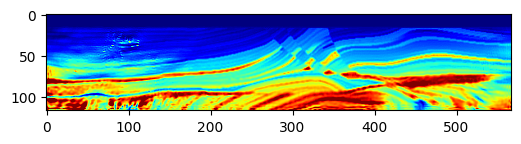

Epoch: 1211 Loss:  -1.8422478437423706 model_loss:  210875.67
Epoch: 1212 Loss:  -1.8418959379196167 model_loss:  210337.6
Epoch: 1213 Loss:  -1.8423858880996704 model_loss:  210738.58
Epoch: 1214 Loss:  -1.8422889709472656 model_loss:  210196.48
Epoch: 1215 Loss:  -1.842458188533783 model_loss:  210579.95
Epoch: 1216 Loss:  -1.842407464981079 model_loss:  210020.28
Epoch: 1217 Loss:  -1.8423194885253906 model_loss:  210407.2
Epoch: 1218 Loss:  -1.8423805236816406 model_loss:  209850.4
Epoch: 1219 Loss:  -1.8423380255699158 model_loss:  210239.47
Epoch: 1220 Loss:  -1.8427616357803345 model_loss:  209684.8


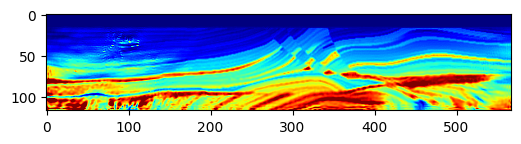

Epoch: 1221 Loss:  -1.8425827026367188 model_loss:  210071.92
Epoch: 1222 Loss:  -1.8426371216773987 model_loss:  209520.94
Epoch: 1223 Loss:  -1.8424798846244812 model_loss:  209922.48
Epoch: 1224 Loss:  -1.8426831364631653 model_loss:  209374.52
Epoch: 1225 Loss:  -1.8429136872291565 model_loss:  209785.11
Epoch: 1226 Loss:  -1.8429670929908752 model_loss:  209250.25
Epoch: 1227 Loss:  -1.8430712223052979 model_loss:  209649.67
Epoch: 1228 Loss:  -1.842987835407257 model_loss:  209111.33
Epoch: 1229 Loss:  -1.8430343270301819 model_loss:  209491.8
Epoch: 1230 Loss:  -1.8432451486587524 model_loss:  208948.4


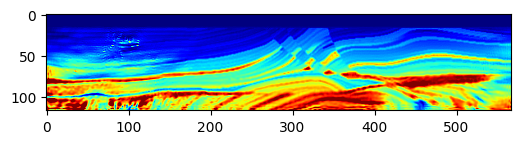

Epoch: 1231 Loss:  -1.843454122543335 model_loss:  209308.11
Epoch: 1232 Loss:  -1.843552589416504 model_loss:  208756.6
Epoch: 1233 Loss:  -1.8432944416999817 model_loss:  209111.45
Epoch: 1234 Loss:  -1.8431779742240906 model_loss:  208554.25
Epoch: 1235 Loss:  -1.843174397945404 model_loss:  208906.78
Epoch: 1236 Loss:  -1.8435794115066528 model_loss:  208343.1
Epoch: 1237 Loss:  -1.8435591459274292 model_loss:  208705.92
Epoch: 1238 Loss:  -1.8433754444122314 model_loss:  208140.14
Epoch: 1239 Loss:  -1.8431941270828247 model_loss:  208522.36
Epoch: 1240 Loss:  -1.8431652188301086 model_loss:  207954.75


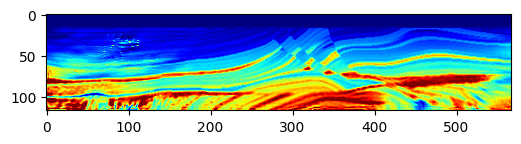

Epoch: 1241 Loss:  -1.8433780670166016 model_loss:  208351.27
Epoch: 1242 Loss:  -1.8431249260902405 model_loss:  207788.84
Epoch: 1243 Loss:  -1.8432050347328186 model_loss:  208184.06
Epoch: 1244 Loss:  -1.8426918983459473 model_loss:  207623.97
Epoch: 1245 Loss:  -1.8430951833724976 model_loss:  208018.39
Epoch: 1246 Loss:  -1.8428454399108887 model_loss:  207465.14
Epoch: 1247 Loss:  -1.8432942628860474 model_loss:  207845.0
Epoch: 1248 Loss:  -1.8427715301513672 model_loss:  207279.28
Epoch: 1249 Loss:  -1.8432212471961975 model_loss:  207635.23
Epoch: 1250 Loss:  -1.8431202173233032 model_loss:  207063.33


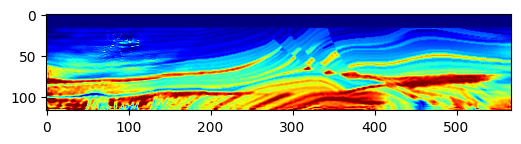

Epoch: 1251 Loss:  -1.8439316153526306 model_loss:  207397.58
Epoch: 1252 Loss:  -1.8434999585151672 model_loss:  206824.31
Epoch: 1253 Loss:  -1.8438267707824707 model_loss:  207173.75
Epoch: 1254 Loss:  -1.8429861664772034 model_loss:  206596.33
Epoch: 1255 Loss:  -1.843933641910553 model_loss:  206965.03
Epoch: 1256 Loss:  -1.844007670879364 model_loss:  206391.03
Epoch: 1257 Loss:  -1.8447793126106262 model_loss:  206763.75
Epoch: 1258 Loss:  -1.8439028859138489 model_loss:  206193.92
Epoch: 1259 Loss:  -1.8439410328865051 model_loss:  206576.78
Epoch: 1260 Loss:  -1.8436363339424133 model_loss:  206007.08


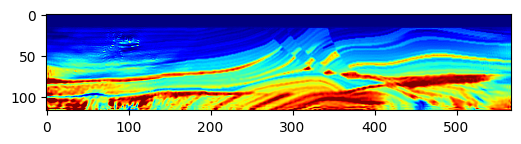

Epoch: 1261 Loss:  -1.8445062041282654 model_loss:  206398.72
Epoch: 1262 Loss:  -1.8446117639541626 model_loss:  205824.12
Epoch: 1263 Loss:  -1.8447945713996887 model_loss:  206201.83
Epoch: 1264 Loss:  -1.8442105054855347 model_loss:  205601.97
Epoch: 1265 Loss:  -1.8442098498344421 model_loss:  205969.17
Epoch: 1266 Loss:  -1.8441503643989563 model_loss:  205363.03
Epoch: 1267 Loss:  -1.8448122143745422 model_loss:  205714.05
Epoch: 1268 Loss:  -1.8447449207305908 model_loss:  205113.16
Epoch: 1269 Loss:  -1.8447009921073914 model_loss:  205445.89
Epoch: 1270 Loss:  -1.8439560532569885 model_loss:  204863.7


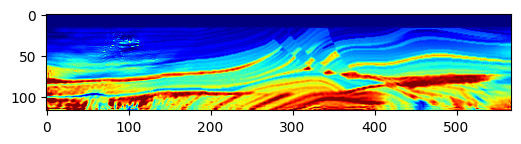

Epoch: 1271 Loss:  -1.844319999217987 model_loss:  205199.17
Epoch: 1272 Loss:  -1.8445957899093628 model_loss:  204637.92
Epoch: 1273 Loss:  -1.8451499938964844 model_loss:  204976.83
Epoch: 1274 Loss:  -1.8445239067077637 model_loss:  204430.4
Epoch: 1275 Loss:  -1.8443368673324585 model_loss:  204785.39
Epoch: 1276 Loss:  -1.8443068861961365 model_loss:  204234.53
Epoch: 1277 Loss:  -1.8448209166526794 model_loss:  204602.1
Epoch: 1278 Loss:  -1.8447786569595337 model_loss:  204036.88
Epoch: 1279 Loss:  -1.844724714756012 model_loss:  204407.97
Epoch: 1280 Loss:  -1.8444184064865112 model_loss:  203814.44


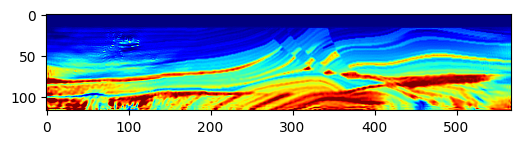

Epoch: 1281 Loss:  -1.8446147441864014 model_loss:  204189.83
Epoch: 1282 Loss:  -1.8450123071670532 model_loss:  203596.48
Epoch: 1283 Loss:  -1.845296561717987 model_loss:  203967.61
Epoch: 1284 Loss:  -1.8452318906784058 model_loss:  203365.6
Epoch: 1285 Loss:  -1.8448769450187683 model_loss:  203724.86
Epoch: 1286 Loss:  -1.844635784626007 model_loss:  203118.45
Epoch: 1287 Loss:  -1.8448662161827087 model_loss:  203468.03
Epoch: 1288 Loss:  -1.8454365730285645 model_loss:  202861.72
Epoch: 1289 Loss:  -1.8454803824424744 model_loss:  203197.19
Epoch: 1290 Loss:  -1.8454514741897583 model_loss:  202604.62


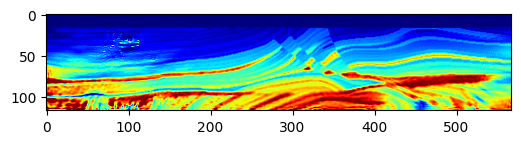

Epoch: 1291 Loss:  -1.8451271653175354 model_loss:  202942.31
Epoch: 1292 Loss:  -1.845541000366211 model_loss:  202354.05
Epoch: 1293 Loss:  -1.8456521034240723 model_loss:  202693.81
Epoch: 1294 Loss:  -1.8457573056221008 model_loss:  202109.75
Epoch: 1295 Loss:  -1.8452953100204468 model_loss:  202442.56
Epoch: 1296 Loss:  -1.845259666442871 model_loss:  201846.17
Epoch: 1297 Loss:  -1.8450684547424316 model_loss:  202177.17
Epoch: 1298 Loss:  -1.8453925848007202 model_loss:  201579.31
Epoch: 1299 Loss:  -1.8452926278114319 model_loss:  201915.47
Epoch: 1300 Loss:  -1.8453936576843262 model_loss:  201298.9


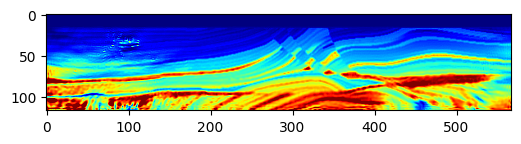

Epoch: 1301 Loss:  -1.8451915979385376 model_loss:  201640.55
Epoch: 1302 Loss:  -1.8451805710792542 model_loss:  201005.16
Epoch: 1303 Loss:  -1.8454729914665222 model_loss:  201343.05
Epoch: 1304 Loss:  -1.8457496166229248 model_loss:  200707.03
Epoch: 1305 Loss:  -1.8459020853042603 model_loss:  201032.84
Epoch: 1306 Loss:  -1.8456793427467346 model_loss:  200409.23
Epoch: 1307 Loss:  -1.8457335829734802 model_loss:  200728.69
Epoch: 1308 Loss:  -1.8459138870239258 model_loss:  200109.4
Epoch: 1309 Loss:  -1.8460797667503357 model_loss:  200433.45
Epoch: 1310 Loss:  -1.8461639285087585 model_loss:  199805.23


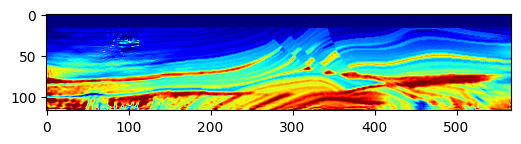

Epoch: 1311 Loss:  -1.8458258509635925 model_loss:  200131.94
Epoch: 1312 Loss:  -1.8460708856582642 model_loss:  199494.84
Epoch: 1313 Loss:  -1.8458150029182434 model_loss:  199814.84
Epoch: 1314 Loss:  -1.84630686044693 model_loss:  199178.08
Epoch: 1315 Loss:  -1.846126914024353 model_loss:  199494.53
Epoch: 1316 Loss:  -1.8464620113372803 model_loss:  198869.3
Epoch: 1317 Loss:  -1.8459593653678894 model_loss:  199188.27
Epoch: 1318 Loss:  -1.846397340297699 model_loss:  198572.69
Epoch: 1319 Loss:  -1.846367597579956 model_loss:  198892.38
Epoch: 1320 Loss:  -1.8471969366073608 model_loss:  198281.0


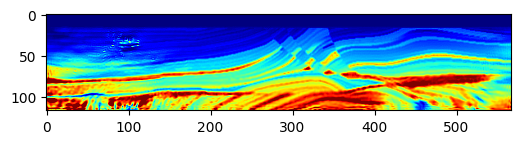

Epoch: 1321 Loss:  -1.8467546701431274 model_loss:  198593.42
Epoch: 1322 Loss:  -1.846537172794342 model_loss:  197995.6
Epoch: 1323 Loss:  -1.8463972210884094 model_loss:  198310.83
Epoch: 1324 Loss:  -1.8468868732452393 model_loss:  197722.97
Epoch: 1325 Loss:  -1.8472205996513367 model_loss:  198031.17
Epoch: 1326 Loss:  -1.8469102382659912 model_loss:  197431.72
Epoch: 1327 Loss:  -1.846929669380188 model_loss:  197730.38
Epoch: 1328 Loss:  -1.8469709753990173 model_loss:  197109.42
Epoch: 1329 Loss:  -1.8473103046417236 model_loss:  197400.6
Epoch: 1330 Loss:  -1.8472577333450317 model_loss:  196773.9


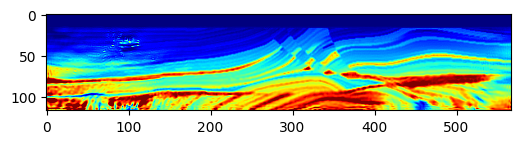

Epoch: 1331 Loss:  -1.8474345803260803 model_loss:  197062.31
Epoch: 1332 Loss:  -1.8474816679954529 model_loss:  196437.44
Epoch: 1333 Loss:  -1.847665250301361 model_loss:  196738.89
Epoch: 1334 Loss:  -1.8474870324134827 model_loss:  196121.23
Epoch: 1335 Loss:  -1.8477935791015625 model_loss:  196431.55
Epoch: 1336 Loss:  -1.8475250005722046 model_loss:  195815.6
Epoch: 1337 Loss:  -1.8478707075119019 model_loss:  196121.86
Epoch: 1338 Loss:  -1.8472102880477905 model_loss:  195511.86
Epoch: 1339 Loss:  -1.8475723266601562 model_loss:  195814.9
Epoch: 1340 Loss:  -1.8474581837654114 model_loss:  195193.0


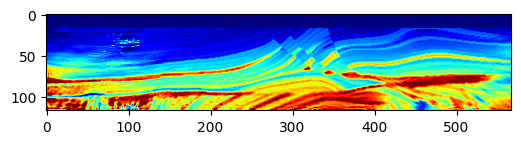

Epoch: 1341 Loss:  -1.847703218460083 model_loss:  195484.66
Epoch: 1342 Loss:  -1.8473301529884338 model_loss:  194852.38
Epoch: 1343 Loss:  -1.8473276495933533 model_loss:  195136.22
Epoch: 1344 Loss:  -1.847480595111847 model_loss:  194495.31
Epoch: 1345 Loss:  -1.8475703001022339 model_loss:  194779.66
Epoch: 1346 Loss:  -1.8477277159690857 model_loss:  194148.2
Epoch: 1347 Loss:  -1.8475663661956787 model_loss:  194442.88
Epoch: 1348 Loss:  -1.847648561000824 model_loss:  193816.83
Epoch: 1349 Loss:  -1.8476601839065552 model_loss:  194126.34
Epoch: 1350 Loss:  -1.847838819026947 model_loss:  193511.62


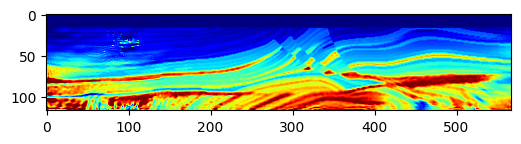

Epoch: 1351 Loss:  -1.8477354049682617 model_loss:  193840.14
Epoch: 1352 Loss:  -1.8478818535804749 model_loss:  193232.05
Epoch: 1353 Loss:  -1.8477246165275574 model_loss:  193563.8
Epoch: 1354 Loss:  -1.848192036151886 model_loss:  192963.56
Epoch: 1355 Loss:  -1.8481115698814392 model_loss:  193284.69
Epoch: 1356 Loss:  -1.8487879633903503 model_loss:  192683.53
Epoch: 1357 Loss:  -1.848351240158081 model_loss:  192985.23
Epoch: 1358 Loss:  -1.8485682010650635 model_loss:  192378.42
Epoch: 1359 Loss:  -1.8485426306724548 model_loss:  192669.16
Epoch: 1360 Loss:  -1.849324107170105 model_loss:  192052.39


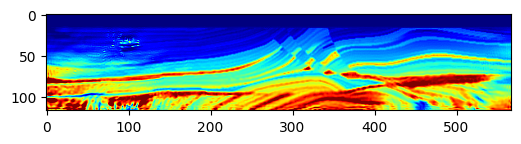

Epoch: 1361 Loss:  -1.8493606448173523 model_loss:  192340.31
Epoch: 1362 Loss:  -1.8491945266723633 model_loss:  191725.61
Epoch: 1363 Loss:  -1.8489424586296082 model_loss:  192014.81
Epoch: 1364 Loss:  -1.8494069576263428 model_loss:  191402.0
Epoch: 1365 Loss:  -1.8494067788124084 model_loss:  191688.95
Epoch: 1366 Loss:  -1.8495108485221863 model_loss:  191093.75
Epoch: 1367 Loss:  -1.8491252660751343 model_loss:  191385.22
Epoch: 1368 Loss:  -1.8493683338165283 model_loss:  190807.81
Epoch: 1369 Loss:  -1.8493706583976746 model_loss:  191105.73
Epoch: 1370 Loss:  -1.8497834205627441 model_loss:  190537.11


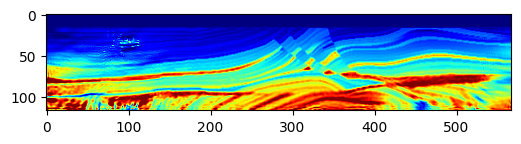

Epoch: 1371 Loss:  -1.849389135837555 model_loss:  190831.81
Epoch: 1372 Loss:  -1.8500927090644836 model_loss:  190260.77
Epoch: 1373 Loss:  -1.849382758140564 model_loss:  190525.77
Epoch: 1374 Loss:  -1.8501569628715515 model_loss:  189945.14
Epoch: 1375 Loss:  -1.8494516611099243 model_loss:  190188.47
Epoch: 1376 Loss:  -1.850616455078125 model_loss:  189591.7
Epoch: 1377 Loss:  -1.849567174911499 model_loss:  189828.75
Epoch: 1378 Loss:  -1.8504285216331482 model_loss:  189220.34
Epoch: 1379 Loss:  -1.8493069410324097 model_loss:  189483.88
Epoch: 1380 Loss:  -1.8511515855789185 model_loss:  188871.92


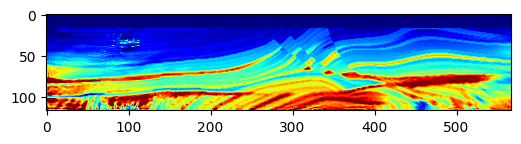

Epoch: 1381 Loss:  -1.849587857723236 model_loss:  189165.95
Epoch: 1382 Loss:  -1.8510976433753967 model_loss:  188562.22
Epoch: 1383 Loss:  -1.8491765856742859 model_loss:  188875.16
Epoch: 1384 Loss:  -1.851156234741211 model_loss:  188269.73
Epoch: 1385 Loss:  -1.849327564239502 model_loss:  188574.88
Epoch: 1386 Loss:  -1.8509007096290588 model_loss:  187961.11
Epoch: 1387 Loss:  -1.8493483066558838 model_loss:  188261.77
Epoch: 1388 Loss:  -1.8520727753639221 model_loss:  187659.67
Epoch: 1389 Loss:  -1.8502082228660583 model_loss:  187962.45
Epoch: 1390 Loss:  -1.852072298526764 model_loss:  187383.23


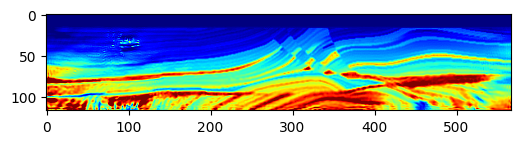

Epoch: 1391 Loss:  -1.8498506546020508 model_loss:  187696.23
Epoch: 1392 Loss:  -1.8522650599479675 model_loss:  187131.22
Epoch: 1393 Loss:  -1.8500650525093079 model_loss:  187447.03
Epoch: 1394 Loss:  -1.8518365621566772 model_loss:  186894.33
Epoch: 1395 Loss:  -1.8496704697608948 model_loss:  187213.39
Epoch: 1396 Loss:  -1.852114498615265 model_loss:  186653.94
Epoch: 1397 Loss:  -1.8498766422271729 model_loss:  186963.17
Epoch: 1398 Loss:  -1.8519465327262878 model_loss:  186395.47
Epoch: 1399 Loss:  -1.8501396775245667 model_loss:  186700.98
Epoch: 1400 Loss:  -1.8531384468078613 model_loss:  186137.97


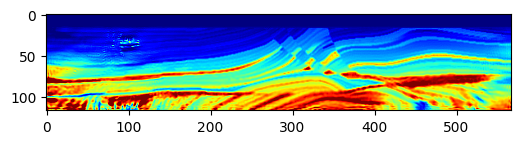

Epoch: 1401 Loss:  -1.850721299648285 model_loss:  186435.81
Epoch: 1402 Loss:  -1.852466881275177 model_loss:  185863.53
Epoch: 1403 Loss:  -1.8500958681106567 model_loss:  186153.61
Epoch: 1404 Loss:  -1.8533833622932434 model_loss:  185581.86
Epoch: 1405 Loss:  -1.8509422540664673 model_loss:  185873.86
Epoch: 1406 Loss:  -1.8532686829566956 model_loss:  185332.4
Epoch: 1407 Loss:  -1.8502302169799805 model_loss:  185647.98
Epoch: 1408 Loss:  -1.8534087538719177 model_loss:  185106.19
Epoch: 1409 Loss:  -1.850641667842865 model_loss:  185417.2
Epoch: 1410 Loss:  -1.8536617159843445 model_loss:  184878.23


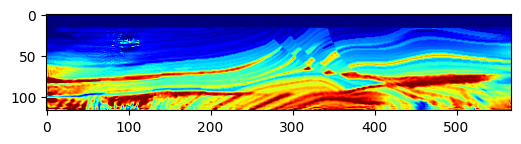

Epoch: 1411 Loss:  -1.8508825898170471 model_loss:  185184.69
Epoch: 1412 Loss:  -1.8533682227134705 model_loss:  184621.25
Epoch: 1413 Loss:  -1.8504291772842407 model_loss:  184921.7
Epoch: 1414 Loss:  -1.8538578748703003 model_loss:  184364.2
Epoch: 1415 Loss:  -1.8518316745758057 model_loss:  184666.9
Epoch: 1416 Loss:  -1.8547112345695496 model_loss:  184125.94
Epoch: 1417 Loss:  -1.85101318359375 model_loss:  184426.95
Epoch: 1418 Loss:  -1.8532358407974243 model_loss:  183875.78
Epoch: 1419 Loss:  -1.8517851829528809 model_loss:  184185.38
Epoch: 1420 Loss:  -1.855807602405548 model_loss:  183652.16


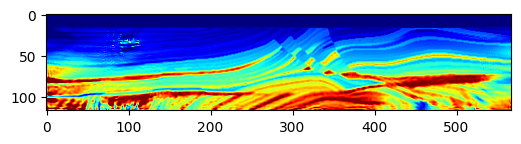

Epoch: 1421 Loss:  -1.8523482084274292 model_loss:  183954.88
Epoch: 1422 Loss:  -1.8528625965118408 model_loss:  183417.98
Epoch: 1423 Loss:  -1.8507916927337646 model_loss:  183712.48
Epoch: 1424 Loss:  -1.8556695580482483 model_loss:  183170.67
Epoch: 1425 Loss:  -1.8529108762741089 model_loss:  183469.89
Epoch: 1426 Loss:  -1.853236436843872 model_loss:  182931.39
Epoch: 1427 Loss:  -1.8508062362670898 model_loss:  183243.8
Epoch: 1428 Loss:  -1.855877161026001 model_loss:  182704.42
Epoch: 1429 Loss:  -1.8535076975822449 model_loss:  183017.05
Epoch: 1430 Loss:  -1.8535150289535522 model_loss:  182508.23


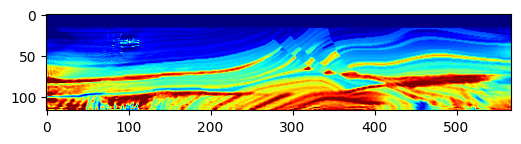

Epoch: 1431 Loss:  -1.8511082530021667 model_loss:  182815.9
Epoch: 1432 Loss:  -1.8560516834259033 model_loss:  182287.94
Epoch: 1433 Loss:  -1.8537647724151611 model_loss:  182587.05
Epoch: 1434 Loss:  -1.8536170721054077 model_loss:  182073.06
Epoch: 1435 Loss:  -1.8513411283493042 model_loss:  182384.66
Epoch: 1436 Loss:  -1.8572834134101868 model_loss:  181862.53
Epoch: 1437 Loss:  -1.85471773147583 model_loss:  182179.47
Epoch: 1438 Loss:  -1.853876531124115 model_loss:  181664.75
Epoch: 1439 Loss:  -1.8510305285453796 model_loss:  181968.22
Epoch: 1440 Loss:  -1.8573848605155945 model_loss:  181430.28


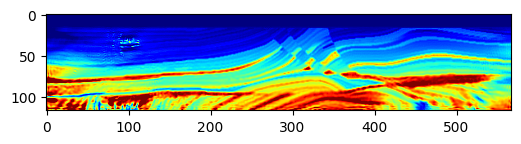

Epoch: 1441 Loss:  -1.8549532294273376 model_loss:  181717.83
Epoch: 1442 Loss:  -1.8538720607757568 model_loss:  181195.94
Epoch: 1443 Loss:  -1.8509040474891663 model_loss:  181480.97
Epoch: 1444 Loss:  -1.8573741912841797 model_loss:  180920.44
Epoch: 1445 Loss:  -1.8550758957862854 model_loss:  181199.48
Epoch: 1446 Loss:  -1.8538256287574768 model_loss:  180648.45
Epoch: 1447 Loss:  -1.8512345552444458 model_loss:  180908.73
Epoch: 1448 Loss:  -1.8581149578094482 model_loss:  180332.67
Epoch: 1449 Loss:  -1.8558459281921387 model_loss:  180588.6
Epoch: 1450 Loss:  -1.853676199913025 model_loss:  180034.58


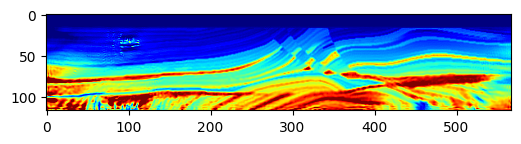

Epoch: 1451 Loss:  -1.8509070873260498 model_loss:  180294.58
Epoch: 1452 Loss:  -1.8581919074058533 model_loss:  179704.06
Epoch: 1453 Loss:  -1.8565032482147217 model_loss:  179950.88
Epoch: 1454 Loss:  -1.8535795211791992 model_loss:  179399.11
Epoch: 1455 Loss:  -1.8504754304885864 model_loss:  179648.16
Epoch: 1456 Loss:  -1.8585656881332397 model_loss:  179066.67
Epoch: 1457 Loss:  -1.857456088066101 model_loss:  179315.62
Epoch: 1458 Loss:  -1.8539257645606995 model_loss:  178795.11
Epoch: 1459 Loss:  -1.8505069017410278 model_loss:  179043.33
Epoch: 1460 Loss:  -1.858289659023285 model_loss:  178461.95


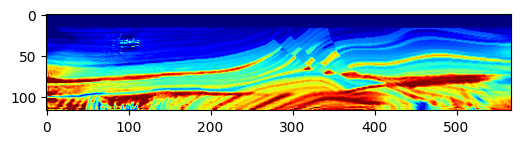

Epoch: 1461 Loss:  -1.8575705289840698 model_loss:  178732.88
Epoch: 1462 Loss:  -1.8548118472099304 model_loss:  178241.67
Epoch: 1463 Loss:  -1.8510693311691284 model_loss:  178510.28
Epoch: 1464 Loss:  -1.8583782315254211 model_loss:  177943.53
Epoch: 1465 Loss:  -1.8571372032165527 model_loss:  178221.84
Epoch: 1466 Loss:  -1.8551585674285889 model_loss:  177736.3
Epoch: 1467 Loss:  -1.8516955375671387 model_loss:  178004.33
Epoch: 1468 Loss:  -1.8591853380203247 model_loss:  177438.94
Epoch: 1469 Loss:  -1.8575507998466492 model_loss:  177721.84
Epoch: 1470 Loss:  -1.8549176454544067 model_loss:  177226.75


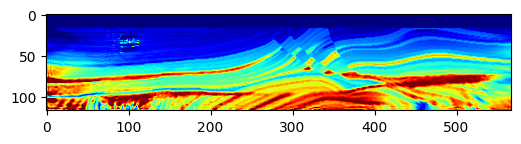

Epoch: 1471 Loss:  -1.8516443967819214 model_loss:  177507.97
Epoch: 1472 Loss:  -1.8597663640975952 model_loss:  176946.27
Epoch: 1473 Loss:  -1.8587812781333923 model_loss:  177233.25
Epoch: 1474 Loss:  -1.8552085757255554 model_loss:  176752.62
Epoch: 1475 Loss:  -1.851624071598053 model_loss:  177032.02
Epoch: 1476 Loss:  -1.8602551817893982 model_loss:  176466.52
Epoch: 1477 Loss:  -1.8600466847419739 model_loss:  176749.61
Epoch: 1478 Loss:  -1.8561844229698181 model_loss:  176292.19
Epoch: 1479 Loss:  -1.8517024517059326 model_loss:  176587.48
Epoch: 1480 Loss:  -1.8597822785377502 model_loss:  176033.4


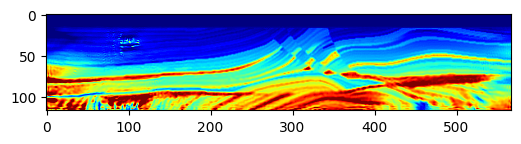

Epoch: 1481 Loss:  -1.8601028323173523 model_loss:  176305.6
Epoch: 1482 Loss:  -1.85670667886734 model_loss:  175861.08
Epoch: 1483 Loss:  -1.8520546555519104 model_loss:  176144.69
Epoch: 1484 Loss:  -1.859613299369812 model_loss:  175578.08
Epoch: 1485 Loss:  -1.859668791294098 model_loss:  175847.56
Epoch: 1486 Loss:  -1.8568047881126404 model_loss:  175395.56
Epoch: 1487 Loss:  -1.8524296879768372 model_loss:  175684.47
Epoch: 1488 Loss:  -1.859486162662506 model_loss:  175123.42
Epoch: 1489 Loss:  -1.8592414855957031 model_loss:  175377.02
Epoch: 1490 Loss:  -1.8567137718200684 model_loss:  174913.9


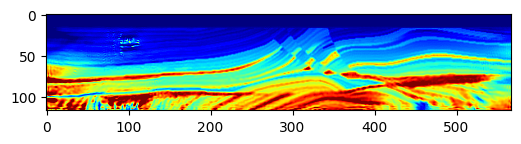

Epoch: 1491 Loss:  -1.8528449535369873 model_loss:  175196.23
Epoch: 1492 Loss:  -1.8599309921264648 model_loss:  174642.22
Epoch: 1493 Loss:  -1.8593498468399048 model_loss:  174898.22
Epoch: 1494 Loss:  -1.8569292426109314 model_loss:  174455.38
Epoch: 1495 Loss:  -1.8533266186714172 model_loss:  174729.0
Epoch: 1496 Loss:  -1.8600938320159912 model_loss:  174185.8
Epoch: 1497 Loss:  -1.8591220378875732 model_loss:  174428.67
Epoch: 1498 Loss:  -1.8566663265228271 model_loss:  173981.05
Epoch: 1499 Loss:  -1.8530906438827515 model_loss:  174255.11
Epoch: 1500 Loss:  -1.8598310351371765 model_loss:  173709.36


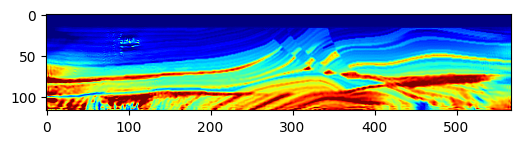

Epoch: 1501 Loss:  -1.8586786389350891 model_loss:  173955.66
Epoch: 1502 Loss:  -1.8565374612808228 model_loss:  173490.3
Epoch: 1503 Loss:  -1.8534343838691711 model_loss:  173765.23
Epoch: 1504 Loss:  -1.859842836856842 model_loss:  173216.14
Epoch: 1505 Loss:  -1.8587985038757324 model_loss:  173473.36
Epoch: 1506 Loss:  -1.8569034337997437 model_loss:  172992.88
Epoch: 1507 Loss:  -1.854142665863037 model_loss:  173272.83
Epoch: 1508 Loss:  -1.8606301546096802 model_loss:  172740.52
Epoch: 1509 Loss:  -1.859061598777771 model_loss:  173020.86
Epoch: 1510 Loss:  -1.8567094802856445 model_loss:  172560.61


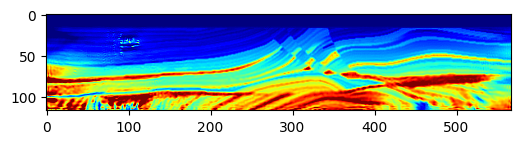

Epoch: 1511 Loss:  -1.8544774651527405 model_loss:  172869.58
Epoch: 1512 Loss:  -1.8621187210083008 model_loss:  172351.2
Epoch: 1513 Loss:  -1.8604515194892883 model_loss:  172647.3
Epoch: 1514 Loss:  -1.8569470643997192 model_loss:  172213.56
Epoch: 1515 Loss:  -1.8538972735404968 model_loss:  172507.86
Epoch: 1516 Loss:  -1.862764298915863 model_loss:  171991.23
Epoch: 1517 Loss:  -1.8621487021446228 model_loss:  172265.11
Epoch: 1518 Loss:  -1.8572660684585571 model_loss:  171853.9
Epoch: 1519 Loss:  -1.8528735041618347 model_loss:  172136.0
Epoch: 1520 Loss:  -1.8621383309364319 model_loss:  171607.33


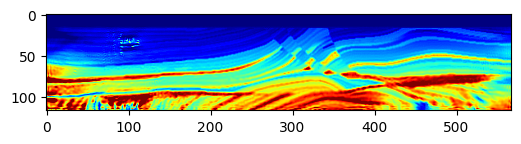

Epoch: 1521 Loss:  -1.8629692792892456 model_loss:  171873.45
Epoch: 1522 Loss:  -1.8583301901817322 model_loss:  171474.42
Epoch: 1523 Loss:  -1.8530111908912659 model_loss:  171775.83
Epoch: 1524 Loss:  -1.8620526194572449 model_loss:  171257.8
Epoch: 1525 Loss:  -1.863282859325409 model_loss:  171534.75
Epoch: 1526 Loss:  -1.8591873049736023 model_loss:  171134.33
Epoch: 1527 Loss:  -1.85330468416214 model_loss:  171426.12
Epoch: 1528 Loss:  -1.861881136894226 model_loss:  170902.83
Epoch: 1529 Loss:  -1.8628119230270386 model_loss:  171157.34
Epoch: 1530 Loss:  -1.859370231628418 model_loss:  170746.44


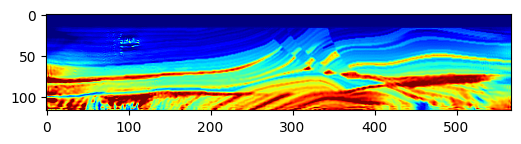

Epoch: 1531 Loss:  -1.8540167808532715 model_loss:  171022.72
Epoch: 1532 Loss:  -1.8617344498634338 model_loss:  170502.1
Epoch: 1533 Loss:  -1.8623611330986023 model_loss:  170737.5
Epoch: 1534 Loss:  -1.8594055771827698 model_loss:  170323.03
Epoch: 1535 Loss:  -1.8548904657363892 model_loss:  170594.19
Epoch: 1536 Loss:  -1.8623480200767517 model_loss:  170079.94
Epoch: 1537 Loss:  -1.8626429438591003 model_loss:  170317.84
Epoch: 1538 Loss:  -1.8593672513961792 model_loss:  169902.8
Epoch: 1539 Loss:  -1.8550408482551575 model_loss:  170195.86
Epoch: 1540 Loss:  -1.86195570230484 model_loss:  169679.78


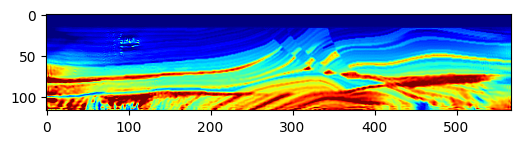

Epoch: 1541 Loss:  -1.862158715724945 model_loss:  169946.25
Epoch: 1542 Loss:  -1.85944002866745 model_loss:  169536.73
Epoch: 1543 Loss:  -1.855838119983673 model_loss:  169845.88
Epoch: 1544 Loss:  -1.862516701221466 model_loss:  169353.69
Epoch: 1545 Loss:  -1.8620097637176514 model_loss:  169637.58
Epoch: 1546 Loss:  -1.8589155077934265 model_loss:  169248.77
Epoch: 1547 Loss:  -1.855833113193512 model_loss:  169546.28
Epoch: 1548 Loss:  -1.8630774021148682 model_loss:  169053.81
Epoch: 1549 Loss:  -1.862324595451355 model_loss:  169340.36
Epoch: 1550 Loss:  -1.858731210231781 model_loss:  168947.5


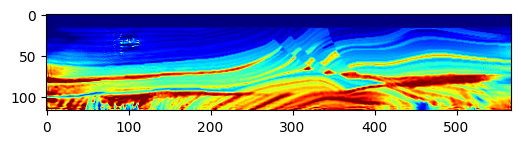

Epoch: 1551 Loss:  -1.8555904626846313 model_loss:  169245.8
Epoch: 1552 Loss:  -1.8642812371253967 model_loss:  168763.89
Epoch: 1553 Loss:  -1.8636130690574646 model_loss:  169035.62
Epoch: 1554 Loss:  -1.858875334262848 model_loss:  168641.53
Epoch: 1555 Loss:  -1.8548802137374878 model_loss:  168938.9
Epoch: 1556 Loss:  -1.8648764491081238 model_loss:  168460.69
Epoch: 1557 Loss:  -1.8653257489204407 model_loss:  168724.03
Epoch: 1558 Loss:  -1.8600635528564453 model_loss:  168347.64
Epoch: 1559 Loss:  -1.8542641997337341 model_loss:  168651.3
Epoch: 1560 Loss:  -1.864090919494629 model_loss:  168184.31


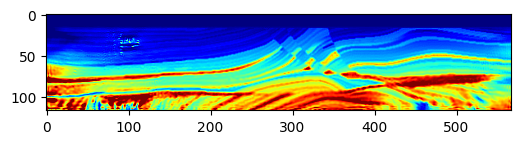

Epoch: 1561 Loss:  -1.865836501121521 model_loss:  168445.2
Epoch: 1562 Loss:  -1.8612860441207886 model_loss:  168069.2
Epoch: 1563 Loss:  -1.8546177744865417 model_loss:  168378.92
Epoch: 1564 Loss:  -1.862980306148529 model_loss:  167896.66
Epoch: 1565 Loss:  -1.8649548292160034 model_loss:  168144.58
Epoch: 1566 Loss:  -1.8618962168693542 model_loss:  167749.03
Epoch: 1567 Loss:  -1.8557373881340027 model_loss:  168035.84
Epoch: 1568 Loss:  -1.8622425198554993 model_loss:  167540.61
Epoch: 1569 Loss:  -1.8632284998893738 model_loss:  167778.3
Epoch: 1570 Loss:  -1.861530065536499 model_loss:  167377.77


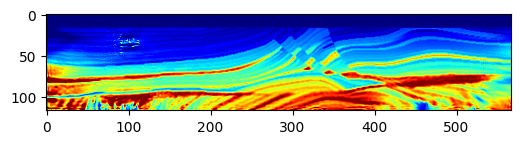

Epoch: 1571 Loss:  -1.8572199940681458 model_loss:  167652.89
Epoch: 1572 Loss:  -1.863059937953949 model_loss:  167162.78
Epoch: 1573 Loss:  -1.863086462020874 model_loss:  167421.16
Epoch: 1574 Loss:  -1.86111718416214 model_loss:  167041.45
Epoch: 1575 Loss:  -1.8575761318206787 model_loss:  167331.95
Epoch: 1576 Loss:  -1.8640809059143066 model_loss:  166856.39
Epoch: 1577 Loss:  -1.8635367155075073 model_loss:  167124.02
Epoch: 1578 Loss:  -1.8609658479690552 model_loss:  166754.52
Epoch: 1579 Loss:  -1.8573576211929321 model_loss:  167052.33
Epoch: 1580 Loss:  -1.8646573424339294 model_loss:  166583.56


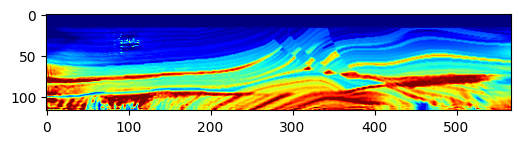

Epoch: 1581 Loss:  -1.8638951182365417 model_loss:  166836.39
Epoch: 1582 Loss:  -1.8606246709823608 model_loss:  166483.2
Epoch: 1583 Loss:  -1.856498658657074 model_loss:  166772.02
Epoch: 1584 Loss:  -1.8644005060195923 model_loss:  166299.67
Epoch: 1585 Loss:  -1.8640048503875732 model_loss:  166531.48
Epoch: 1586 Loss:  -1.8612398505210876 model_loss:  166155.98
Epoch: 1587 Loss:  -1.8568920493125916 model_loss:  166442.02
Epoch: 1588 Loss:  -1.8647225499153137 model_loss:  165970.22
Epoch: 1589 Loss:  -1.864523708820343 model_loss:  166219.45
Epoch: 1590 Loss:  -1.8617807626724243 model_loss:  165853.98


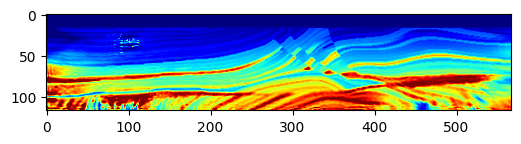

Epoch: 1591 Loss:  -1.8575078248977661 model_loss:  166158.52
Epoch: 1592 Loss:  -1.8652036786079407 model_loss:  165707.61
Epoch: 1593 Loss:  -1.865007221698761 model_loss:  165983.34
Epoch: 1594 Loss:  -1.8619986176490784 model_loss:  165631.95
Epoch: 1595 Loss:  -1.8579323887825012 model_loss:  165952.45
Epoch: 1596 Loss:  -1.8654829859733582 model_loss:  165516.31
Epoch: 1597 Loss:  -1.8655679821968079 model_loss:  165799.66
Epoch: 1598 Loss:  -1.8620558381080627 model_loss:  165453.23
Epoch: 1599 Loss:  -1.8580982089042664 model_loss:  165767.03
Epoch: 1600 Loss:  -1.8660669326782227 model_loss:  165342.02


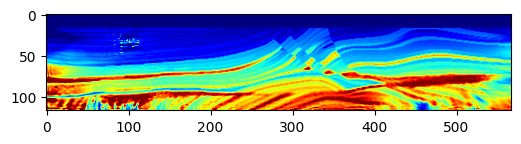

Epoch: 1601 Loss:  -1.8662227988243103 model_loss:  165614.55
Epoch: 1602 Loss:  -1.8619440197944641 model_loss:  165257.05
Epoch: 1603 Loss:  -1.8573622107505798 model_loss:  165557.36
Epoch: 1604 Loss:  -1.8654630780220032 model_loss:  165105.44
Epoch: 1605 Loss:  -1.8662704825401306 model_loss:  165344.53
Epoch: 1606 Loss:  -1.8622655272483826 model_loss:  164951.7
Epoch: 1607 Loss:  -1.857549250125885 model_loss:  165226.94
Epoch: 1608 Loss:  -1.8660861253738403 model_loss:  164768.92
Epoch: 1609 Loss:  -1.8669086694717407 model_loss:  165011.11
Epoch: 1610 Loss:  -1.8630117177963257 model_loss:  164630.95


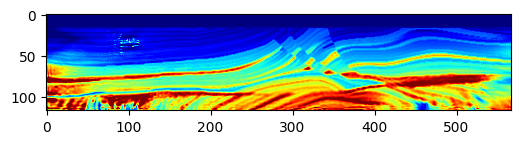

Epoch: 1611 Loss:  -1.8572412729263306 model_loss:  164921.0
Epoch: 1612 Loss:  -1.8654311299324036 model_loss:  164453.17
Epoch: 1613 Loss:  -1.866898536682129 model_loss:  164702.0
Epoch: 1614 Loss:  -1.8636366724967957 model_loss:  164339.11
Epoch: 1615 Loss:  -1.8579808473587036 model_loss:  164627.42
Epoch: 1616 Loss:  -1.8646871447563171 model_loss:  164159.73
Epoch: 1617 Loss:  -1.865931212902069 model_loss:  164408.16
Epoch: 1618 Loss:  -1.8634405732154846 model_loss:  164056.52
Epoch: 1619 Loss:  -1.8588297963142395 model_loss:  164350.86
Epoch: 1620 Loss:  -1.864846110343933 model_loss:  163898.9


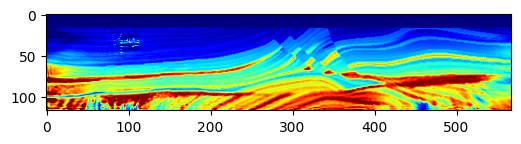

Epoch: 1621 Loss:  -1.865123689174652 model_loss:  164147.1
Epoch: 1622 Loss:  -1.8629754185676575 model_loss:  163787.25
Epoch: 1623 Loss:  -1.8592175841331482 model_loss:  164074.58
Epoch: 1624 Loss:  -1.865183174610138 model_loss:  163616.73
Epoch: 1625 Loss:  -1.8646844625473022 model_loss:  163862.56
Epoch: 1626 Loss:  -1.8629135489463806 model_loss:  163482.06
Epoch: 1627 Loss:  -1.8597540259361267 model_loss:  163769.95
Epoch: 1628 Loss:  -1.866043746471405 model_loss:  163302.61
Epoch: 1629 Loss:  -1.8651134371757507 model_loss:  163546.72
Epoch: 1630 Loss:  -1.8628364205360413 model_loss:  163172.2


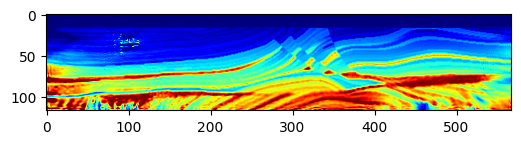

Epoch: 1631 Loss:  -1.8599275350570679 model_loss:  163468.75
Epoch: 1632 Loss:  -1.8669235706329346 model_loss:  163032.58
Epoch: 1633 Loss:  -1.8660650849342346 model_loss:  163290.14
Epoch: 1634 Loss:  -1.8627259135246277 model_loss:  162940.08
Epoch: 1635 Loss:  -1.8596888184547424 model_loss:  163233.28
Epoch: 1636 Loss:  -1.867250919342041 model_loss:  162798.98
Epoch: 1637 Loss:  -1.8672266602516174 model_loss:  163055.95
Epoch: 1638 Loss:  -1.8634225726127625 model_loss:  162714.1
Epoch: 1639 Loss:  -1.8593685626983643 model_loss:  163038.11
Epoch: 1640 Loss:  -1.8668025135993958 model_loss:  162614.58


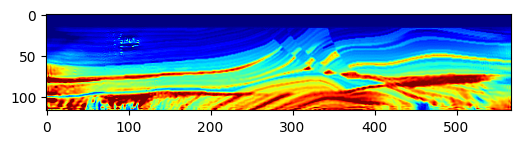

Epoch: 1641 Loss:  -1.8672634959220886 model_loss:  162872.64
Epoch: 1642 Loss:  -1.8636385202407837 model_loss:  162521.22
Epoch: 1643 Loss:  -1.8594152927398682 model_loss:  162834.6
Epoch: 1644 Loss:  -1.8669260740280151 model_loss:  162404.72
Epoch: 1645 Loss:  -1.8673186898231506 model_loss:  162662.1
Epoch: 1646 Loss:  -1.8643676042556763 model_loss:  162308.17
Epoch: 1647 Loss:  -1.859702467918396 model_loss:  162605.39
Epoch: 1648 Loss:  -1.86714506149292 model_loss:  162180.97
Epoch: 1649 Loss:  -1.8672981262207031 model_loss:  162423.3
Epoch: 1650 Loss:  -1.864505112171173 model_loss:  162061.95


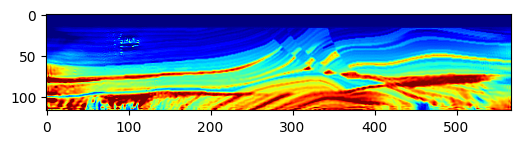

Epoch: 1651 Loss:  -1.859778881072998 model_loss:  162340.4
Epoch: 1652 Loss:  -1.8668173551559448 model_loss:  161902.11
Epoch: 1653 Loss:  -1.8670824766159058 model_loss:  162131.19
Epoch: 1654 Loss:  -1.864815592765808 model_loss:  161756.4
Epoch: 1655 Loss:  -1.8602564930915833 model_loss:  162036.84
Epoch: 1656 Loss:  -1.867250144481659 model_loss:  161602.48
Epoch: 1657 Loss:  -1.867307424545288 model_loss:  161847.72
Epoch: 1658 Loss:  -1.8649389147758484 model_loss:  161485.16
Epoch: 1659 Loss:  -1.8604393005371094 model_loss:  161776.55
Epoch: 1660 Loss:  -1.8672112226486206 model_loss:  161347.16


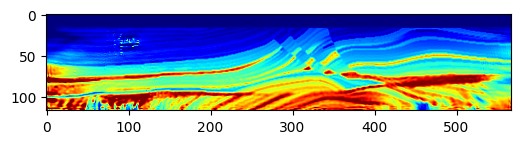

Epoch: 1661 Loss:  -1.8675053119659424 model_loss:  161592.1
Epoch: 1662 Loss:  -1.8650450110435486 model_loss:  161244.86
Epoch: 1663 Loss:  -1.8605128526687622 model_loss:  161530.33
Epoch: 1664 Loss:  -1.8674490451812744 model_loss:  161115.48
Epoch: 1665 Loss:  -1.8678574562072754 model_loss:  161361.67
Epoch: 1666 Loss:  -1.8651517033576965 model_loss:  161030.97
Epoch: 1667 Loss:  -1.8606027364730835 model_loss:  161309.69
Epoch: 1668 Loss:  -1.8675430417060852 model_loss:  160883.31
Epoch: 1669 Loss:  -1.8679047226905823 model_loss:  161124.12
Epoch: 1670 Loss:  -1.865273356437683 model_loss:  160780.12


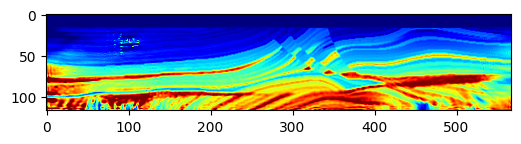

Epoch: 1671 Loss:  -1.8608779311180115 model_loss:  161049.19
Epoch: 1672 Loss:  -1.867700219154358 model_loss:  160614.14
Epoch: 1673 Loss:  -1.8678186535835266 model_loss:  160847.47
Epoch: 1674 Loss:  -1.8650533556938171 model_loss:  160495.39
Epoch: 1675 Loss:  -1.8608304262161255 model_loss:  160761.2
Epoch: 1676 Loss:  -1.8677024245262146 model_loss:  160327.58
Epoch: 1677 Loss:  -1.8677619695663452 model_loss:  160554.28
Epoch: 1678 Loss:  -1.865222692489624 model_loss:  160203.92
Epoch: 1679 Loss:  -1.861063301563263 model_loss:  160480.6
Epoch: 1680 Loss:  -1.868178367614746 model_loss:  160059.64


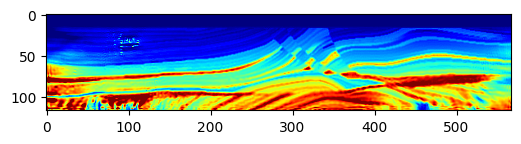

Epoch: 1681 Loss:  -1.8683218955993652 model_loss:  160305.28
Epoch: 1682 Loss:  -1.8654041290283203 model_loss:  159977.25
Epoch: 1683 Loss:  -1.8612065315246582 model_loss:  160268.47
Epoch: 1684 Loss:  -1.8680642247200012 model_loss:  159854.52
Epoch: 1685 Loss:  -1.8685926795005798 model_loss:  160106.28
Epoch: 1686 Loss:  -1.8654248118400574 model_loss:  159779.7
Epoch: 1687 Loss:  -1.8614047169685364 model_loss:  160080.98
Epoch: 1688 Loss:  -1.8678837418556213 model_loss:  159663.86
Epoch: 1689 Loss:  -1.8685097098350525 model_loss:  159923.27
Epoch: 1690 Loss:  -1.8655741810798645 model_loss:  159594.36


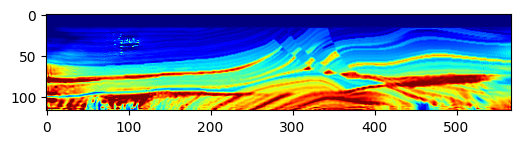

Epoch: 1691 Loss:  -1.8618565201759338 model_loss:  159908.3
Epoch: 1692 Loss:  -1.8683463335037231 model_loss:  159500.03
Epoch: 1693 Loss:  -1.8686195611953735 model_loss:  159757.56
Epoch: 1694 Loss:  -1.8657878637313843 model_loss:  159420.25
Epoch: 1695 Loss:  -1.861895501613617 model_loss:  159719.8
Epoch: 1696 Loss:  -1.868472695350647 model_loss:  159311.16
Epoch: 1697 Loss:  -1.8686526417732239 model_loss:  159547.11
Epoch: 1698 Loss:  -1.8660514950752258 model_loss:  159206.61
Epoch: 1699 Loss:  -1.861915111541748 model_loss:  159478.08
Epoch: 1700 Loss:  -1.8685928583145142 model_loss:  159050.17


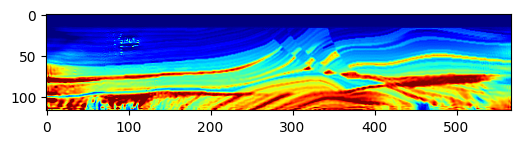

Epoch: 1701 Loss:  -1.8687444925308228 model_loss:  159272.69
Epoch: 1702 Loss:  -1.866434931755066 model_loss:  158922.53
Epoch: 1703 Loss:  -1.8624106049537659 model_loss:  159193.19
Epoch: 1704 Loss:  -1.8688952922821045 model_loss:  158776.67
Epoch: 1705 Loss:  -1.8691053986549377 model_loss:  159015.52
Epoch: 1706 Loss:  -1.8667462468147278 model_loss:  158677.56
Epoch: 1707 Loss:  -1.8626805543899536 model_loss:  158967.12
Epoch: 1708 Loss:  -1.868805170059204 model_loss:  158556.1
Epoch: 1709 Loss:  -1.8688538670539856 model_loss:  158804.9
Epoch: 1710 Loss:  -1.8668342232704163 model_loss:  158463.31


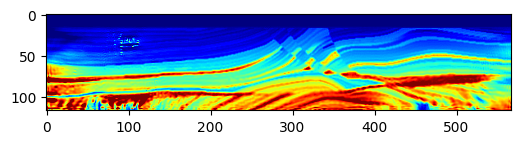

Epoch: 1711 Loss:  -1.8626663088798523 model_loss:  158757.48
Epoch: 1712 Loss:  -1.8685949444770813 model_loss:  158341.16
Epoch: 1713 Loss:  -1.8682978749275208 model_loss:  158582.48
Epoch: 1714 Loss:  -1.8666110038757324 model_loss:  158225.84
Epoch: 1715 Loss:  -1.8628095984458923 model_loss:  158509.25
Epoch: 1716 Loss:  -1.8686984181404114 model_loss:  158088.7
Epoch: 1717 Loss:  -1.86822509765625 model_loss:  158328.81
Epoch: 1718 Loss:  -1.8666692972183228 model_loss:  157980.64
Epoch: 1719 Loss:  -1.8632484078407288 model_loss:  158265.64
Epoch: 1720 Loss:  -1.8690378069877625 model_loss:  157865.03


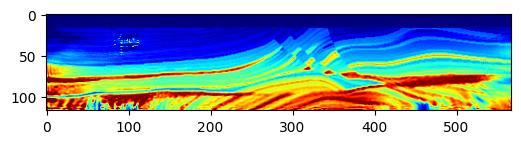

Epoch: 1721 Loss:  -1.868530809879303 model_loss:  158103.31
Epoch: 1722 Loss:  -1.8662899136543274 model_loss:  157763.83
Epoch: 1723 Loss:  -1.8630993962287903 model_loss:  158049.62
Epoch: 1724 Loss:  -1.8692206740379333 model_loss:  157639.44
Epoch: 1725 Loss:  -1.8686921000480652 model_loss:  157872.42
Epoch: 1726 Loss:  -1.8663479685783386 model_loss:  157521.19
Epoch: 1727 Loss:  -1.8630494475364685 model_loss:  157819.1
Epoch: 1728 Loss:  -1.8699469566345215 model_loss:  157424.84
Epoch: 1729 Loss:  -1.8694956302642822 model_loss:  157665.25
Epoch: 1730 Loss:  -1.86653470993042 model_loss:  157321.12


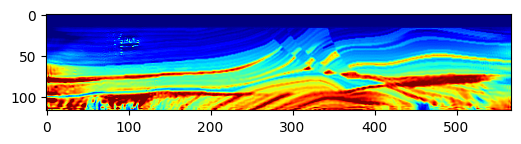

Epoch: 1731 Loss:  -1.8624334335327148 model_loss:  157611.53
Epoch: 1732 Loss:  -1.8695791959762573 model_loss:  157206.94
Epoch: 1733 Loss:  -1.8701978921890259 model_loss:  157425.62
Epoch: 1734 Loss:  -1.8676037192344666 model_loss:  157079.19
Epoch: 1735 Loss:  -1.8629940152168274 model_loss:  157357.62
Epoch: 1736 Loss:  -1.869885504245758 model_loss:  156970.61
Epoch: 1737 Loss:  -1.8703434467315674 model_loss:  157199.97
Epoch: 1738 Loss:  -1.8678632974624634 model_loss:  156867.69
Epoch: 1739 Loss:  -1.8630301356315613 model_loss:  157156.33
Epoch: 1740 Loss:  -1.8693317770957947 model_loss:  156763.77


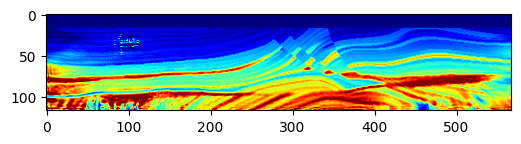

Epoch: 1741 Loss:  -1.8697674870491028 model_loss:  156996.69
Epoch: 1742 Loss:  -1.8679535388946533 model_loss:  156656.3
Epoch: 1743 Loss:  -1.8635757565498352 model_loss:  156950.98
Epoch: 1744 Loss:  -1.869450032711029 model_loss:  156560.08
Epoch: 1745 Loss:  -1.8696756958961487 model_loss:  156801.11
Epoch: 1746 Loss:  -1.8677021861076355 model_loss:  156461.34
Epoch: 1747 Loss:  -1.863833248615265 model_loss:  156755.8
Epoch: 1748 Loss:  -1.8699354529380798 model_loss:  156366.84
Epoch: 1749 Loss:  -1.8698924779891968 model_loss:  156613.81
Epoch: 1750 Loss:  -1.8676297068595886 model_loss:  156275.44


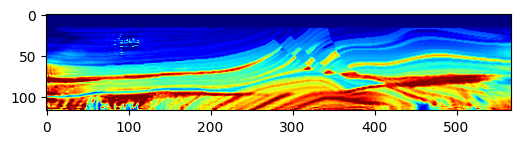

Epoch: 1751 Loss:  -1.8639607429504395 model_loss:  156566.5
Epoch: 1752 Loss:  -1.8702967762947083 model_loss:  156178.31
Epoch: 1753 Loss:  -1.870287001132965 model_loss:  156424.11
Epoch: 1754 Loss:  -1.8676652312278748 model_loss:  156082.73
Epoch: 1755 Loss:  -1.8638418912887573 model_loss:  156366.5
Epoch: 1756 Loss:  -1.8703860640525818 model_loss:  155969.52
Epoch: 1757 Loss:  -1.8706068992614746 model_loss:  156204.7
Epoch: 1758 Loss:  -1.8679211735725403 model_loss:  155867.25
Epoch: 1759 Loss:  -1.8638827204704285 model_loss:  156136.98
Epoch: 1760 Loss:  -1.8702611923217773 model_loss:  155738.78


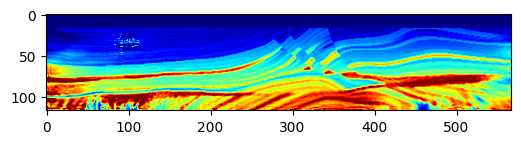

Epoch: 1761 Loss:  -1.870818555355072 model_loss:  155964.38
Epoch: 1762 Loss:  -1.8684015274047852 model_loss:  155625.31
Epoch: 1763 Loss:  -1.8641587495803833 model_loss:  155890.92
Epoch: 1764 Loss:  -1.8700944781303406 model_loss:  155496.52
Epoch: 1765 Loss:  -1.8706350922584534 model_loss:  155727.19
Epoch: 1766 Loss:  -1.8685372471809387 model_loss:  155398.83
Epoch: 1767 Loss:  -1.864351511001587 model_loss:  155677.28
Epoch: 1768 Loss:  -1.8698169589042664 model_loss:  155290.62
Epoch: 1769 Loss:  -1.8701092600822449 model_loss:  155530.05
Epoch: 1770 Loss:  -1.8685285449028015 model_loss:  155194.67


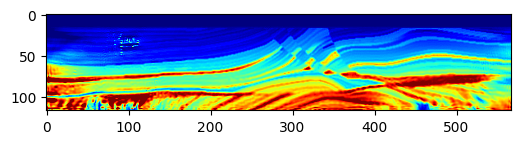

Epoch: 1771 Loss:  -1.8648545145988464 model_loss:  155470.45
Epoch: 1772 Loss:  -1.8701802492141724 model_loss:  155080.39
Epoch: 1773 Loss:  -1.8702030777931213 model_loss:  155308.02
Epoch: 1774 Loss:  -1.8687229752540588 model_loss:  154965.72
Epoch: 1775 Loss:  -1.8652012348175049 model_loss:  155230.86
Epoch: 1776 Loss:  -1.8703643083572388 model_loss:  154838.38
Epoch: 1777 Loss:  -1.8704178929328918 model_loss:  155060.97
Epoch: 1778 Loss:  -1.868870496749878 model_loss:  154719.12
Epoch: 1779 Loss:  -1.865614652633667 model_loss:  154992.89
Epoch: 1780 Loss:  -1.8708539605140686 model_loss:  154602.23


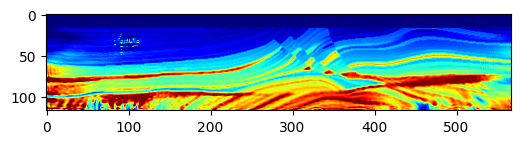

Epoch: 1781 Loss:  -1.8707339763641357 model_loss:  154837.08
Epoch: 1782 Loss:  -1.8687983751296997 model_loss:  154501.61
Epoch: 1783 Loss:  -1.8655478954315186 model_loss:  154792.69
Epoch: 1784 Loss:  -1.8709556460380554 model_loss:  154407.94
Epoch: 1785 Loss:  -1.870919108390808 model_loss:  154653.31
Epoch: 1786 Loss:  -1.8690336346626282 model_loss:  154318.77
Epoch: 1787 Loss:  -1.8655800223350525 model_loss:  154616.23
Epoch: 1788 Loss:  -1.87101811170578 model_loss:  154225.02
Epoch: 1789 Loss:  -1.870968997478485 model_loss:  154470.31
Epoch: 1790 Loss:  -1.8690181374549866 model_loss:  154128.72


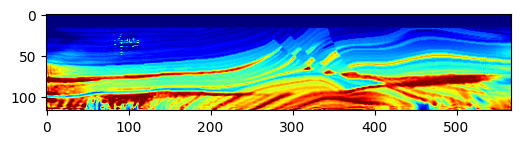

Epoch: 1791 Loss:  -1.865374505519867 model_loss:  154428.72
Epoch: 1792 Loss:  -1.8708987832069397 model_loss:  154032.73
Epoch: 1793 Loss:  -1.8707669973373413 model_loss:  154275.84
Epoch: 1794 Loss:  -1.8687235713005066 model_loss:  153929.95
Epoch: 1795 Loss:  -1.8652506470680237 model_loss:  154218.89
Epoch: 1796 Loss:  -1.8706780672073364 model_loss:  153828.8
Epoch: 1797 Loss:  -1.870774507522583 model_loss:  154057.55
Epoch: 1798 Loss:  -1.8688619136810303 model_loss:  153722.62
Epoch: 1799 Loss:  -1.8655622601509094 model_loss:  153993.38
Epoch: 1800 Loss:  -1.8713173270225525 model_loss:  153624.52


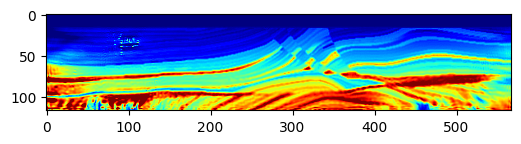

Epoch: 1801 Loss:  -1.8712692260742188 model_loss:  153850.83
Epoch: 1802 Loss:  -1.8689777255058289 model_loss:  153531.66
Epoch: 1803 Loss:  -1.8652799129486084 model_loss:  153811.56
Epoch: 1804 Loss:  -1.871233582496643 model_loss:  153442.86
Epoch: 1805 Loss:  -1.8715091943740845 model_loss:  153675.86
Epoch: 1806 Loss:  -1.8694141507148743 model_loss:  153348.58
Epoch: 1807 Loss:  -1.8653504252433777 model_loss:  153628.64
Epoch: 1808 Loss:  -1.8714549541473389 model_loss:  153253.86
Epoch: 1809 Loss:  -1.8716920614242554 model_loss:  153472.5
Epoch: 1810 Loss:  -1.8697804808616638 model_loss:  153144.83


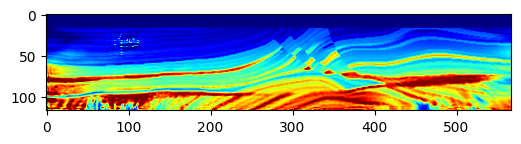

Epoch: 1811 Loss:  -1.865254819393158 model_loss:  153403.78
Epoch: 1812 Loss:  -1.8711438179016113 model_loss:  153029.61
Epoch: 1813 Loss:  -1.8714104890823364 model_loss:  153235.36
Epoch: 1814 Loss:  -1.8703224658966064 model_loss:  152909.5
Epoch: 1815 Loss:  -1.8659016489982605 model_loss:  153169.28
Epoch: 1816 Loss:  -1.871291697025299 model_loss:  152806.88
Epoch: 1817 Loss:  -1.8713486194610596 model_loss:  153030.78
Epoch: 1818 Loss:  -1.8703789710998535 model_loss:  152712.62
Epoch: 1819 Loss:  -1.8662654757499695 model_loss:  152994.14
Epoch: 1820 Loss:  -1.8712869882583618 model_loss:  152634.98


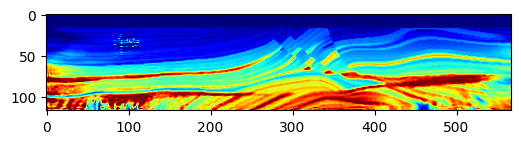

Epoch: 1821 Loss:  -1.8714365363121033 model_loss:  152869.39
Epoch: 1822 Loss:  -1.8704031705856323 model_loss:  152552.19
Epoch: 1823 Loss:  -1.866482675075531 model_loss:  152836.2
Epoch: 1824 Loss:  -1.8714656829833984 model_loss:  152482.2
Epoch: 1825 Loss:  -1.871681809425354 model_loss:  152715.98
Epoch: 1826 Loss:  -1.8704133033752441 model_loss:  152402.17
Epoch: 1827 Loss:  -1.8665220141410828 model_loss:  152686.86
Epoch: 1828 Loss:  -1.8713063597679138 model_loss:  152327.72
Epoch: 1829 Loss:  -1.8715853691101074 model_loss:  152568.52
Epoch: 1830 Loss:  -1.870121717453003 model_loss:  152243.0


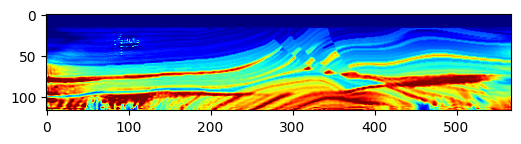

Epoch: 1831 Loss:  -1.8664473295211792 model_loss:  152521.27
Epoch: 1832 Loss:  -1.871106743812561 model_loss:  152149.84
Epoch: 1833 Loss:  -1.8713798522949219 model_loss:  152381.67
Epoch: 1834 Loss:  -1.8700288534164429 model_loss:  152043.81
Epoch: 1835 Loss:  -1.8665786385536194 model_loss:  152310.3
Epoch: 1836 Loss:  -1.87110835313797 model_loss:  151937.92
Epoch: 1837 Loss:  -1.8714471459388733 model_loss:  152159.77
Epoch: 1838 Loss:  -1.8703151941299438 model_loss:  151828.47
Epoch: 1839 Loss:  -1.8669574856758118 model_loss:  152090.38
Epoch: 1840 Loss:  -1.8714027404785156 model_loss:  151731.0


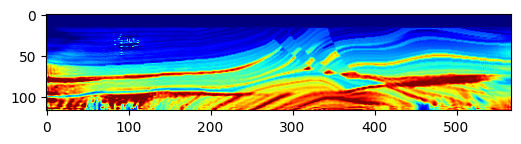

Epoch: 1841 Loss:  -1.8716830015182495 model_loss:  151955.95
Epoch: 1842 Loss:  -1.8704420924186707 model_loss:  151630.47
Epoch: 1843 Loss:  -1.8669750094413757 model_loss:  151895.38
Epoch: 1844 Loss:  -1.8711990118026733 model_loss:  151538.62
Epoch: 1845 Loss:  -1.8715476989746094 model_loss:  151775.05
Epoch: 1846 Loss:  -1.8705405592918396 model_loss:  151449.2
Epoch: 1847 Loss:  -1.8671839833259583 model_loss:  151715.48
Epoch: 1848 Loss:  -1.8712728023529053 model_loss:  151356.73
Epoch: 1849 Loss:  -1.871683418750763 model_loss:  151589.83
Epoch: 1850 Loss:  -1.8709856867790222 model_loss:  151263.1


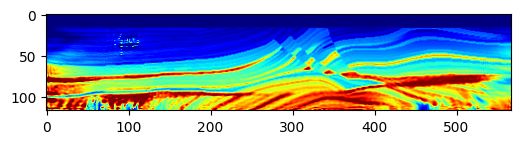

Epoch: 1851 Loss:  -1.8674923777580261 model_loss:  151516.95
Epoch: 1852 Loss:  -1.8711920380592346 model_loss:  151164.38
Epoch: 1853 Loss:  -1.8714980483055115 model_loss:  151380.77
Epoch: 1854 Loss:  -1.8710609078407288 model_loss:  151051.5
Epoch: 1855 Loss:  -1.8677623867988586 model_loss:  151287.83
Epoch: 1856 Loss:  -1.8713476657867432 model_loss:  150929.4
Epoch: 1857 Loss:  -1.8715242147445679 model_loss:  151134.25
Epoch: 1858 Loss:  -1.871195137500763 model_loss:  150801.64
Epoch: 1859 Loss:  -1.8680306673049927 model_loss:  151038.05
Epoch: 1860 Loss:  -1.8714749813079834 model_loss:  150683.75


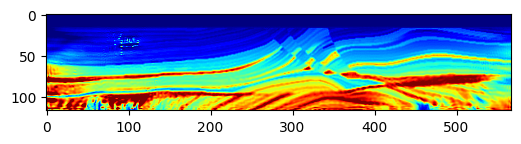

Epoch: 1861 Loss:  -1.8714731931686401 model_loss:  150896.89
Epoch: 1862 Loss:  -1.8710359334945679 model_loss:  150565.34
Epoch: 1863 Loss:  -1.8681349158287048 model_loss:  150809.55
Epoch: 1864 Loss:  -1.8716084957122803 model_loss:  150446.17
Epoch: 1865 Loss:  -1.8715741038322449 model_loss:  150665.1
Epoch: 1866 Loss:  -1.8708224892616272 model_loss:  150327.8
Epoch: 1867 Loss:  -1.868155837059021 model_loss:  150582.94
Epoch: 1868 Loss:  -1.8717512488365173 model_loss:  150217.48
Epoch: 1869 Loss:  -1.8718391060829163 model_loss:  150450.84
Epoch: 1870 Loss:  -1.870593786239624 model_loss:  150118.97


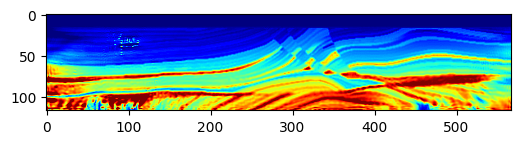

Epoch: 1871 Loss:  -1.8679143190383911 model_loss:  150385.77
Epoch: 1872 Loss:  -1.871697187423706 model_loss:  150022.89
Epoch: 1873 Loss:  -1.8719725608825684 model_loss:  150261.95
Epoch: 1874 Loss:  -1.870463490486145 model_loss:  149932.25
Epoch: 1875 Loss:  -1.8678345084190369 model_loss:  150193.67
Epoch: 1876 Loss:  -1.8719379901885986 model_loss:  149828.1
Epoch: 1877 Loss:  -1.8723052740097046 model_loss:  150063.58
Epoch: 1878 Loss:  -1.8704491257667542 model_loss:  149734.12
Epoch: 1879 Loss:  -1.8677318096160889 model_loss:  149987.55
Epoch: 1880 Loss:  -1.8720865845680237 model_loss:  149611.92


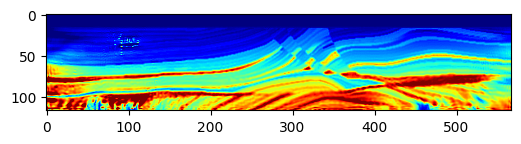

Epoch: 1881 Loss:  -1.872544765472412 model_loss:  149837.56
Epoch: 1882 Loss:  -1.8705271482467651 model_loss:  149506.83
Epoch: 1883 Loss:  -1.8676521182060242 model_loss:  149753.06
Epoch: 1884 Loss:  -1.872440218925476 model_loss:  149382.02
Epoch: 1885 Loss:  -1.8728749752044678 model_loss:  149617.33
Epoch: 1886 Loss:  -1.8705301880836487 model_loss:  149310.1
Epoch: 1887 Loss:  -1.867512822151184 model_loss:  149555.06
Epoch: 1888 Loss:  -1.8723470568656921 model_loss:  149185.27
Epoch: 1889 Loss:  -1.8728971481323242 model_loss:  149416.17
Epoch: 1890 Loss:  -1.8704707026481628 model_loss:  149111.19


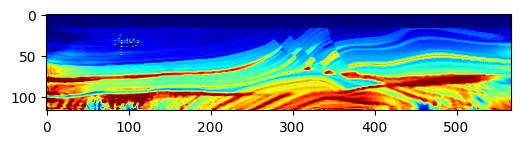

Epoch: 1891 Loss:  -1.8674417734146118 model_loss:  149346.98
Epoch: 1892 Loss:  -1.8723933696746826 model_loss:  148973.89
Epoch: 1893 Loss:  -1.8729827404022217 model_loss:  149209.95
Epoch: 1894 Loss:  -1.8701993227005005 model_loss:  148915.1
Epoch: 1895 Loss:  -1.8669629096984863 model_loss:  149151.08
Epoch: 1896 Loss:  -1.8722829222679138 model_loss:  148774.12
Epoch: 1897 Loss:  -1.8727555871009827 model_loss:  149004.95
Epoch: 1898 Loss:  -1.869854986667633 model_loss:  148712.22
Epoch: 1899 Loss:  -1.866326630115509 model_loss:  148938.34
Epoch: 1900 Loss:  -1.8722403645515442 model_loss:  148552.05


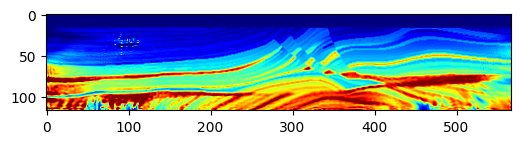

Epoch: 1901 Loss:  -1.872351348400116 model_loss:  148778.31
Epoch: 1902 Loss:  -1.8695228099822998 model_loss:  148480.08
Epoch: 1903 Loss:  -1.8660144805908203 model_loss:  148705.19
Epoch: 1904 Loss:  -1.87252539396286 model_loss:  148321.23
Epoch: 1905 Loss:  -1.8721038699150085 model_loss:  148549.42
Epoch: 1906 Loss:  -1.8681856393814087 model_loss:  148253.45
Epoch: 1907 Loss:  -1.8647885918617249 model_loss:  148484.33
Epoch: 1908 Loss:  -1.8725407719612122 model_loss:  148107.28
Epoch: 1909 Loss:  -1.8709717988967896 model_loss:  148321.5
Epoch: 1910 Loss:  -1.8651758432388306 model_loss:  148014.53


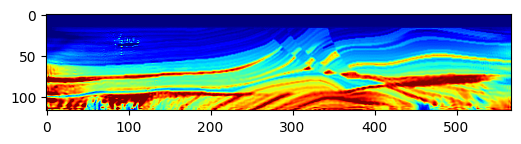

Epoch: 1911 Loss:  -1.8637178540229797 model_loss:  148248.48
Epoch: 1912 Loss:  -1.8750999569892883 model_loss:  147875.55
Epoch: 1913 Loss:  -1.872365951538086 model_loss:  148080.05
Epoch: 1914 Loss:  -1.8616064190864563 model_loss:  147759.5
Epoch: 1915 Loss:  -1.8578178882598877 model_loss:  148018.17
Epoch: 1916 Loss:  -1.8782662153244019 model_loss:  147630.67
Epoch: 1917 Loss:  -1.8887861371040344 model_loss:  147803.83
Epoch: 1918 Loss:  -1.8832055926322937 model_loss:  147625.8
Epoch: 1919 Loss:  -1.8546221852302551 model_loss:  147928.34
Epoch: 1920 Loss:  -1.8466824889183044 model_loss:  147467.4


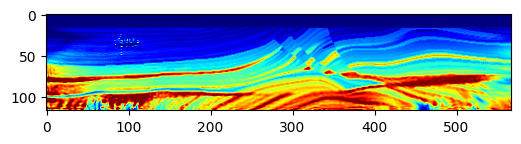

Epoch: 1921 Loss:  -1.8660815358161926 model_loss:  147632.02
Epoch: 1922 Loss:  -1.8856024742126465 model_loss:  147221.39
Epoch: 1923 Loss:  -1.8832748532295227 model_loss:  147331.2
Epoch: 1924 Loss:  -1.8608617186546326 model_loss:  147055.64
Epoch: 1925 Loss:  -1.846440851688385 model_loss:  147360.23
Epoch: 1926 Loss:  -1.8745193481445312 model_loss:  146939.19
Epoch: 1927 Loss:  -1.8911515474319458 model_loss:  147036.12
Epoch: 1928 Loss:  -1.8918187022209167 model_loss:  146768.92
Epoch: 1929 Loss:  -1.8639509677886963 model_loss:  147025.61
Epoch: 1930 Loss:  -1.8412120342254639 model_loss:  146591.84


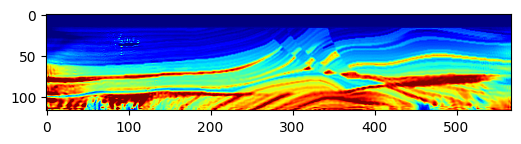

Epoch: 1931 Loss:  -1.8645696640014648 model_loss:  146738.84
Epoch: 1932 Loss:  -1.8836434483528137 model_loss:  146292.66
Epoch: 1933 Loss:  -1.8749017119407654 model_loss:  146412.9
Epoch: 1934 Loss:  -1.854379415512085 model_loss:  146083.5
Epoch: 1935 Loss:  -1.843245267868042 model_loss:  146335.61
Epoch: 1936 Loss:  -1.8695104122161865 model_loss:  145856.4
Epoch: 1937 Loss:  -1.8865949511528015 model_loss:  145983.98
Epoch: 1938 Loss:  -1.8965754508972168 model_loss:  145690.84
Epoch: 1939 Loss:  -1.9005082845687866 model_loss:  145903.16
Epoch: 1940 Loss:  -1.8896984457969666 model_loss:  145643.7


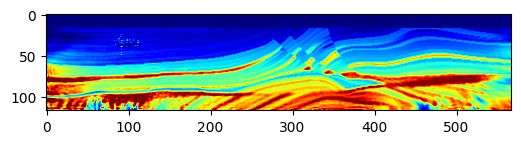

Epoch: 1941 Loss:  -1.8509495854377747 model_loss:  145822.25
Epoch: 1942 Loss:  -1.8410693407058716 model_loss:  145312.14
Epoch: 1943 Loss:  -1.8744217157363892 model_loss:  145488.33
Epoch: 1944 Loss:  -1.8923481106758118 model_loss:  145187.06
Epoch: 1945 Loss:  -1.8837732672691345 model_loss:  145347.89
Epoch: 1946 Loss:  -1.8514168858528137 model_loss:  145079.47
Epoch: 1947 Loss:  -1.8379610180854797 model_loss:  145405.19
Epoch: 1948 Loss:  -1.859933614730835 model_loss:  144959.31
Epoch: 1949 Loss:  -1.8769399523735046 model_loss:  145069.0
Epoch: 1950 Loss:  -1.8856242895126343 model_loss:  144722.8


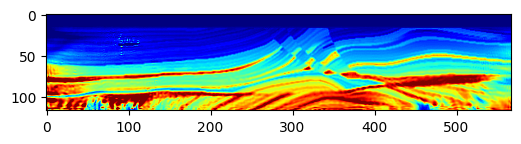

Epoch: 1951 Loss:  -1.88214111328125 model_loss:  145055.64
Epoch: 1952 Loss:  -1.8901079893112183 model_loss:  144760.86
Epoch: 1953 Loss:  -1.8998541831970215 model_loss:  144898.56
Epoch: 1954 Loss:  -1.89590585231781 model_loss:  144632.83
Epoch: 1955 Loss:  -1.869365930557251 model_loss:  144811.86
Epoch: 1956 Loss:  -1.865731418132782 model_loss:  144485.53
Epoch: 1957 Loss:  -1.8633949756622314 model_loss:  144646.23
Epoch: 1958 Loss:  -1.8678650259971619 model_loss:  144278.88
Epoch: 1959 Loss:  -1.8652089834213257 model_loss:  144492.06
Epoch: 1960 Loss:  -1.87822026014328 model_loss:  144161.61


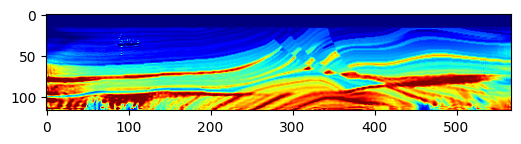

Epoch: 1961 Loss:  -1.878129005432129 model_loss:  144257.81
Epoch: 1962 Loss:  -1.871158242225647 model_loss:  143873.14
Epoch: 1963 Loss:  -1.856988787651062 model_loss:  144152.66
Epoch: 1964 Loss:  -1.8694016933441162 model_loss:  143847.81
Epoch: 1965 Loss:  -1.8774048686027527 model_loss:  143991.08
Epoch: 1966 Loss:  -1.8671332001686096 model_loss:  143590.3
Epoch: 1967 Loss:  -1.8470625281333923 model_loss:  143867.31
Epoch: 1968 Loss:  -1.8658337593078613 model_loss:  143498.95
Epoch: 1969 Loss:  -1.8799254298210144 model_loss:  143707.47
Epoch: 1970 Loss:  -1.894569456577301 model_loss:  143424.45


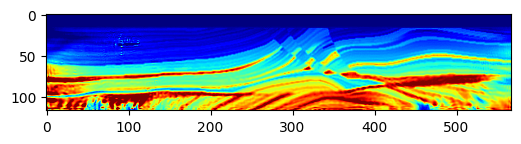

Epoch: 1971 Loss:  -1.8853465914726257 model_loss:  143525.02
Epoch: 1972 Loss:  -1.855092167854309 model_loss:  143225.69
Epoch: 1973 Loss:  -1.840808928012848 model_loss:  143420.7
Epoch: 1974 Loss:  -1.8745172619819641 model_loss:  142923.97
Epoch: 1975 Loss:  -1.8942031860351562 model_loss:  142997.03
Epoch: 1976 Loss:  -1.8926388025283813 model_loss:  142799.06
Epoch: 1977 Loss:  -1.868202567100525 model_loss:  143050.12
Epoch: 1978 Loss:  -1.8440409302711487 model_loss:  142681.98
Epoch: 1979 Loss:  -1.8602827787399292 model_loss:  142892.75
Epoch: 1980 Loss:  -1.8882340788841248 model_loss:  142543.62


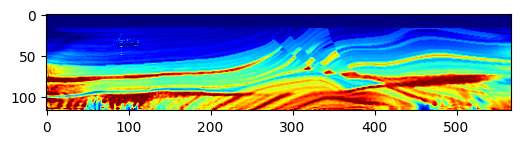

Epoch: 1981 Loss:  -1.8917210698127747 model_loss:  142642.08
Epoch: 1982 Loss:  -1.8768928050994873 model_loss:  142502.84
Epoch: 1983 Loss:  -1.852306067943573 model_loss:  142836.62
Epoch: 1984 Loss:  -1.8623363375663757 model_loss:  142430.86
Epoch: 1985 Loss:  -1.8769203424453735 model_loss:  142515.19
Epoch: 1986 Loss:  -1.869948923587799 model_loss:  142163.1
Epoch: 1987 Loss:  -1.8579980731010437 model_loss:  142466.88
Epoch: 1988 Loss:  -1.8718444108963013 model_loss:  142198.3
Epoch: 1989 Loss:  -1.8817654848098755 model_loss:  142417.64
Epoch: 1990 Loss:  -1.8750203251838684 model_loss:  142135.34


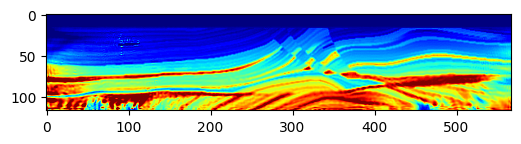

Epoch: 1991 Loss:  -1.8594998121261597 model_loss:  142399.45
Epoch: 1992 Loss:  -1.8647992014884949 model_loss:  142078.4
Epoch: 1993 Loss:  -1.8726524710655212 model_loss:  142268.38
Epoch: 1994 Loss:  -1.8689772486686707 model_loss:  141824.0
Epoch: 1995 Loss:  -1.8628004789352417 model_loss:  142014.67
Epoch: 1996 Loss:  -1.8781741857528687 model_loss:  141724.61
Epoch: 1997 Loss:  -1.8801132440567017 model_loss:  141942.81
Epoch: 1998 Loss:  -1.8723971843719482 model_loss:  141686.27
Epoch: 1999 Loss:  -1.8477097153663635 model_loss:  141957.19
Epoch: 2000 Loss:  -1.8667293190956116 model_loss:  141551.72


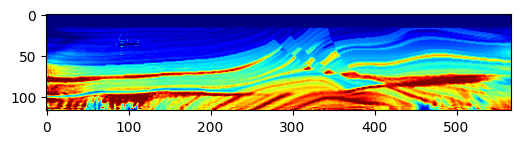

Runtime: 15.322120503584545


In [9]:
# Iterative inversion loop
t_start = time.time()
num_batches = 2 # split data into 2 batches for speed and reduced memory use
num_epochs = 2001 # Pass through the entire dataset 20001 times
model_loss = []
data_loss = []
for epoch in range(num_epochs):
    epoch_loss = 0.0
    
    for it in range(num_batches):
        optimizer.zero_grad()
        batch_src_amps = source_amplitudes[it::num_batches]
        batch_rcv_amps_true = receiver_amplitudes_true[it::num_batches].to(device)        
        batch_x_s = source_locations[it::num_batches].to(device)
        batch_x_r = receiver_locations[it::num_batches].to(device)
          
        out = scalar(
          model.T, dx, dt,
          source_amplitudes=batch_src_amps,
          source_locations=batch_x_s,
          receiver_locations=batch_x_r,
          pml_freq=freq,)
        
        batch_rcv_amps_pred = out[-1].permute(0, 2, 1)        
        u_obs = batch_rcv_amps_true
        u_pred = batch_rcv_amps_pred
        
        loss = criterion_data.forward(u_obs, u_pred)
        epoch_loss += loss.item()
        loss.backward()
        model.grad *= mask      
          
        optimizer.step()
    # scheduler.step()
    v_loss = criterion(model.cpu(),model_true.cpu()).detach().numpy()
    model_loss.append(v_loss.item())
    data_loss.append(epoch_loss)
    print('Epoch:', epoch, 'Loss: ', epoch_loss,'model_loss: ', v_loss)
    if epoch !=0 and epoch % 10 == 0:
        plt.figure(figsize=(6, 4))
        plt.imshow(model.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
                   cmap='jet')
        plt.show()

t_end = time.time()
print('Runtime:', (t_end - t_start)/60)